#***Comparative Analysis of Machine Learning Models for Stock Price Prediction***

# **Packages & Functions**

In [1]:
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from matplotlib import pyplot as plt
from pandas import concat
import numpy as np
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf
import statsmodels.api as smf
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from keras.optimizers import Adam
from keras.layers import Dense, LSTM, Embedding, Dropout, Bidirectional, Conv1D, MaxPooling1D, Flatten
from sklearn.linear_model import LinearRegression
from math import sqrt
from numpy import concatenate
from sklearn.metrics import mean_squared_error
from sklearn.svm import LinearSVR
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_error
from sklearn.svm import SVR
import tensorflow as tf
import keras
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.datasets import make_regression
from sklearn.preprocessing import PowerTransformer
from statsmodels.tsa.statespace.sarimax import SARIMAX
import seaborn as sns
import torch
import pytz as pytz
import datetime
import math
import torch.nn as nn
from torch.utils.data import Dataset
from tensorflow.keras.layers import Input

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

#**Data Exploration And Feature Engineering Possibilities**



In [3]:
stock1 = yf.download(['aapl'], start="2021-01-01", end="2024-03-28") #Insert Relevant Ticker Here

[*********************100%%**********************]  1 of 1 completed


In [4]:
stock1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 813 entries, 2021-01-04 to 2024-03-27
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       813 non-null    float64
 1   High       813 non-null    float64
 2   Low        813 non-null    float64
 3   Close      813 non-null    float64
 4   Adj Close  813 non-null    float64
 5   Volume     813 non-null    int64  
dtypes: float64(5), int64(1)
memory usage: 44.5 KB


               Open      High       Low     Close  Adj Close    Volume
Open       1.000000  0.997697  0.997544  0.994090   0.993860 -0.417383
High       0.997697  1.000000  0.997235  0.997338   0.996971 -0.397504
Low        0.997544  0.997235  1.000000  0.997492   0.997247 -0.441010
Close      0.994090  0.997338  0.997492  1.000000   0.999618 -0.420510
Adj Close  0.993860  0.996971  0.997247  0.999618   1.000000 -0.428764
Volume    -0.417383 -0.397504 -0.441010 -0.420510  -0.428764  1.000000


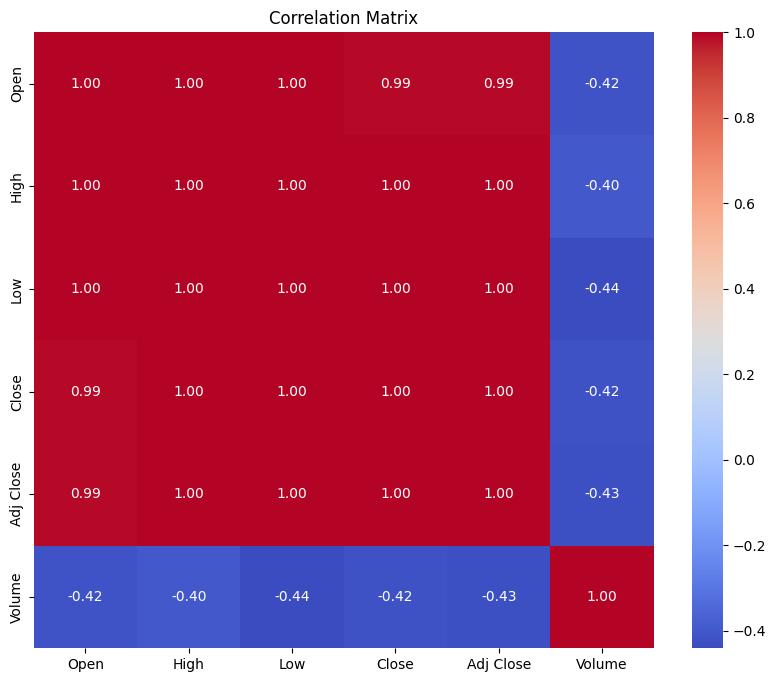

In [5]:
#SHIFTING OF DATA TO SHOW RELATIONSHIP #
corr_matrix = stock1.corr()
print(corr_matrix)
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

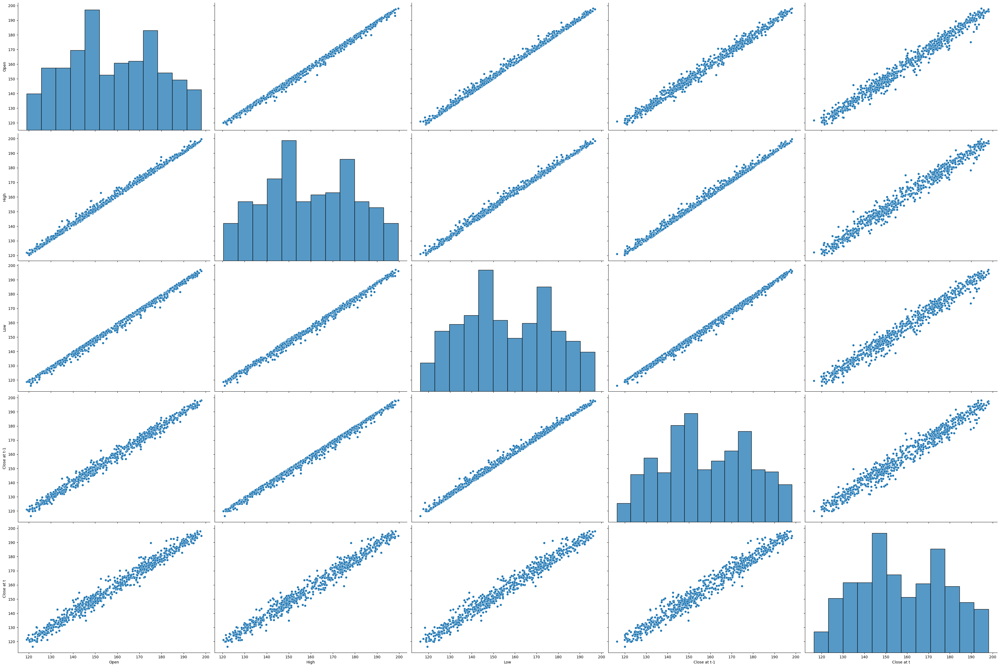

In [6]:
#Shift variables so that we have predictor variables in position t-1 and target variable in position t
Target = stock1['Close'].shift(1).dropna() #Close at time t
Predictor = stock1[['Open', 'High', 'Low', 'Close']].shift(-1).dropna() #Move all predictor variables including close to t-1 position
Predictor.rename(columns={'Close': 'Close at t-1'}, inplace=True) #Rename close
Predictor['Close at t'] = Target #Assign variable name


pairplot_data = Predictor.dropna() #Drop missing values ready for pairplot data

sns.pairplot(pairplot_data, height = 5, aspect = 1.5) #Plot data


### Here we observe linear relationships between all of the independent variables and the dependent variable (close price) ###
### We can say that this is likely to have an impact on which ML models have more predictive capability ###

# **Feature Engineering**

**Price Momentum**

In [7]:
# Calculate percentage change
#Price momentum looks at the rate of change of a stock over a certain period
stock1['Price_Momentum_15_days'] = stock1['Close'].pct_change(periods = 15) * 100
stock1['Price_Momentum_30_days'] = stock1['Close'].pct_change(periods = 30) * 100

**Relative Strength Index**

In [8]:
#Relative Strength Index (RSI) measures the speed and movement of a share price with a range between 0 and 100
#This looks at the ratio of gains to losses over a defined period from one day to the next (that's why differencing is used here)
#Dividing the average gain by the average loss gives us the Relative Strength (RSI) calculation where say an output of 30 would suggest the share is oversold and above 70 would be considered overbought)
#Maybe this can determine which direction the closing price will be going

def calculate_rsi(data, period=14):
    delta = data.diff(1)
    gain = (delta.where(delta > 0, 0)).rolling(window=period).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=period).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

# Calculate RSI with default period of 14
stock1['RSI'] = calculate_rsi(stock1['Close'])

**Standard Deviation**

In [9]:
stock1['7-Day Std Dev'] = stock1['Close'].rolling(window=7).std()

**Range**

In [10]:
stock1['Range'] = stock1['High'] - stock1['Low']

**Moving Averages**

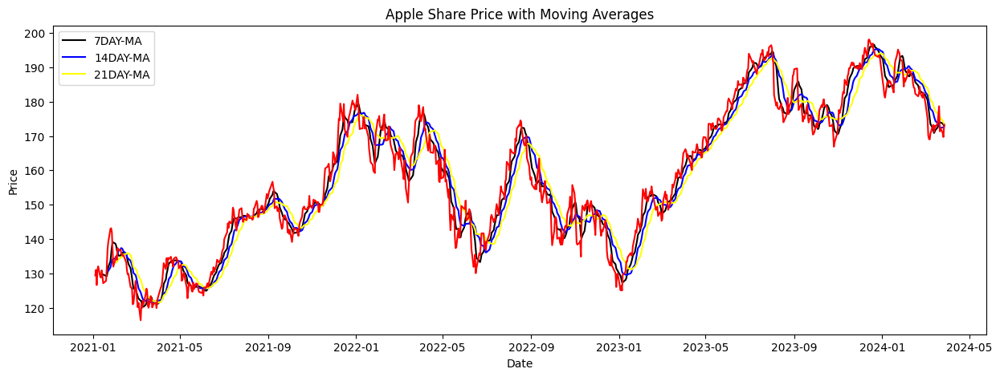

In [11]:
### Simple Moving Averages (SMA) ###
stock1['7DAY-MA'] = stock1['Close'].rolling(window=7).mean()
stock1['14DAY-MA'] = stock1['Close'].rolling(window=14).mean()
stock1['21DAY-MA'] = stock1['Close'].rolling(window=21).mean()

##Exponential Moving Averages (EMA) ##
stock1['7DAY-EMA'] = stock1['Close'].ewm(span=7, adjust=False).mean()
stock1['14DAY-EMA'] = stock1['Close'].ewm(span=14, adjust=False).mean()
stock1['21DAY-EMA'] = stock1['Close'].ewm(span=21, adjust=False).mean()


#Plot showing the smoothing that takes place with the moving average
plt.figure(figsize=(15,5))
plt.plot(stock1['7DAY-MA'], color="black", label="7DAY-MA")
plt.plot(stock1['14DAY-MA'], color="blue", label="14DAY-MA")
plt.plot(stock1['21DAY-MA'], color="yellow", label="21DAY-MA")
plt.plot(stock1['Close'], color='red')
plt.xlabel("Date")
plt.ylabel("Price")
plt.title("Apple Share Price with Moving Averages")
plt.legend(loc='upper left', fontsize='medium')


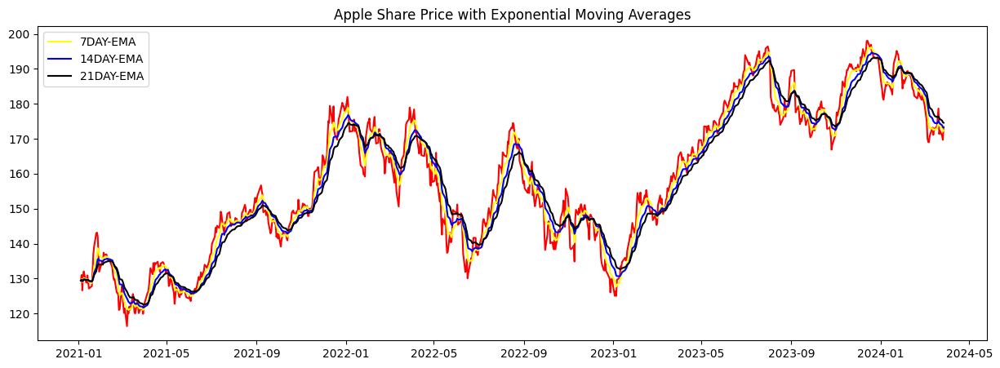

In [12]:
### Plot for Exponential Moving Averages ###

plt.figure(figsize=(15,5))
plt.plot(stock1['Close'], color = "red")
plt.plot(stock1['7DAY-EMA'], color="yellow", label="7DAY-EMA")
plt.plot(stock1['14DAY-EMA'], color="blue", label="14DAY-EMA")
plt.plot(stock1['21DAY-EMA'], color="black", label="21DAY-EMA")
plt.title("Apple Share Price with Exponential Moving Averages")
plt.legend()

In [13]:
x = stock1[['Close', '7DAY-MA', '14DAY-MA', '21DAY-MA', '7DAY-EMA', '14DAY-EMA', '21DAY-MA']].dropna()
x = pd.DataFrame(x)

# **Correlation Test to Check for Useful Features**

In [14]:
updated_corr_matrix = stock1.corr()
updated_corr_matrix

#Notice very high correlation with moving averages
#7-Day Std Deviation + Range also has relatively strong relationship with target variable close
#RSI, Price Momentum and Volume can be removed from the model as will provide noise

,Open,High,Low,Close,Adj Close,Volume,Price_Momentum_15_days,Price_Momentum_30_days,RSI,7-Day Std Dev,Range,7DAY-MA,14DAY-MA,21DAY-MA,7DAY-EMA,14DAY-EMA,21DAY-EMA
Open,1.000000,0.997697,0.997544,0.994090,0.993860,-0.417383,0.182821,0.292205,0.155391,0.001781,-0.057341,0.988854,0.971271,0.953242,0.992481,0.980502,0.968012
High,0.997697,1.000000,0.997235,0.997338,0.996971,-0.397504,0.188924,0.293547,0.161129,0.015661,-0.022339,0.988275,0.970710,0.953279,0.992391,0.980360,0.968223
Low,0.997544,0.997235,1.000000,0.997492,0.997247,-0.441010,0.204337,0.309606,0.176490,-0.014435,-0.096575,0.986458,0.967286,0.947834,0.990775,0.977219,0.963872
Close,0.994090,0.997338,0.997492,1.000000,0.999618,-0.420510,0.209252,0.308533,0.181184,0.001777,-0.061442,0.984795,0.965930,0.947449,0.989629,0.976226,0.963392
Adj Close,0.993860,0.996971,0.997247,0.999618,1.000000,-0.428764,0.200620,0.297728,0.173382,0.000709,-0.063070,0.985318,0.967450,0.949850,0.990134,0.977690,0.965726
Volume,-0.417383,-0.397504,-0.441010,-0.420510,-0.428764,1.000000,-0.181828,-0.214977,-0.175747,0.383691,0.608938,-0.389409,-0.370708,-0.340402,-0.402502,-0.388792,-0.378535
Price_Momentum_15_days,0.182821,0.188924,0.204337,0.209252,0.200620,-0.181828,1.000000,0.693462,0.921096,-0.130465,-0.217444,0.112276,-0.000955,-0.086134,0.114354,0.025000,-0.033567
Price_Momentum_30_days,0.292205,0.293547,0.309606,0.308533,0.297728,-0.214977,0.693462,1.000000,0.620212,-0.224465,-0.232419,0.242119,0.163726,0.083127,0.243177,0.167457,0.100970
RSI,0.155391,0.161129,0.176490,0.181184,0.173382,-0.175747,0.921096,0.620212,1.000000,-0.142109,-0.214559,0.081711,-0.032570,-0.107979,0.084713,-0.001920,-0.056404
7-Day Std Dev,0.001781,0.015661,-0.014435,0.001777,0.000709,0.383691,-0.130465,-0.224465,-0.142109,1.000000,0.403046,0.014224,0.026343,0.065345,0.014771,0.032239,0.048675


#Updated Correlation Matrix

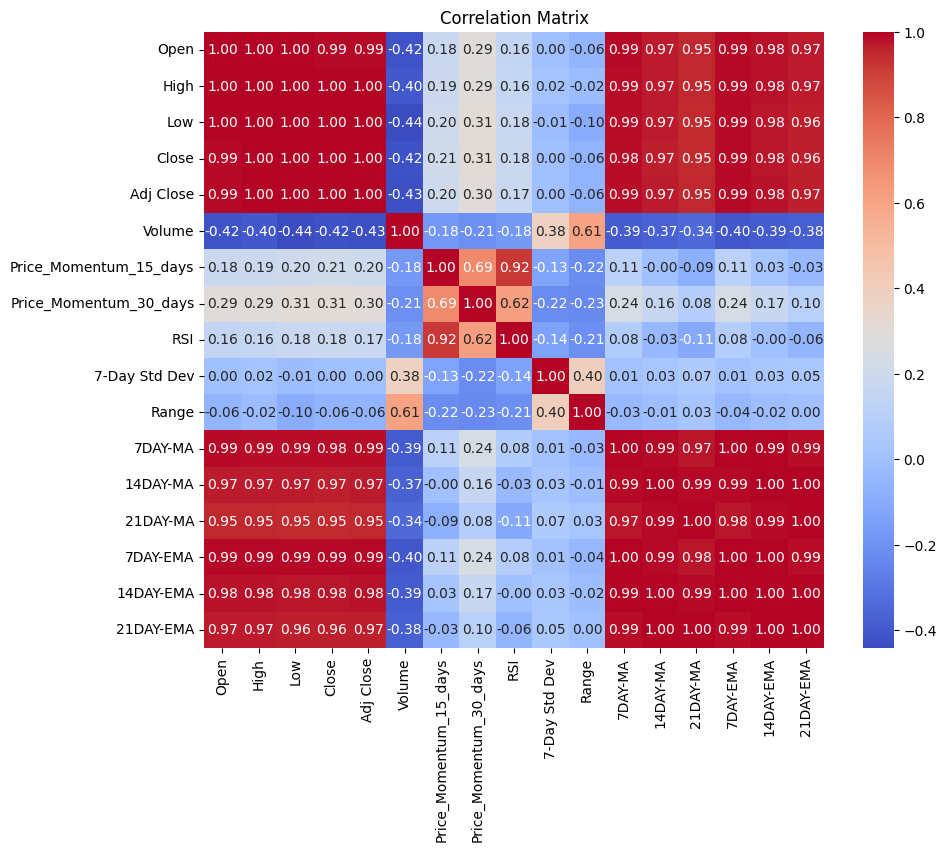

In [15]:
plt.figure(figsize=(10, 8))
sns.heatmap(updated_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

#**Data Preprocessing and Model Building**

Due to the number of models being tested data preprocessing is done within the the individual model functions as different models require different data preprocessing

# **Naive Model**

The naive model is a basic forecasting technique which is typically used as a benchmark to compare with other models, it takes the last available data point and predicts this into the future for the remainder of the forecast

In [16]:
def Naive(Ticker, start, end, prediction_period):
  """
    Naive model for share price prediction

    Parameters:
    - ticker: This determines the particular share price that we wish to review
    - start: This determines the start date for where the chosen ticker information will begin
    - end: This determines the end date for the chosen ticker information

    Return:
    - Mean Squared Error (mse)
    - Real Mean Squared Error (rmse)
    - Mean Absolute Error (mae)

  """
  stock = yf.download([Ticker], start=start, end=end) #Insert Relevant Ticker Here

  # Select the closing price column
  prices = stock['Close']

    #Training set
  train = prices[:round(0.85*len(stock))]

  #Test Set
  test = prices[round(0.85*len(stock)):]

  #Naive value - use to replace with all over values in the column of the dataframe
  Naive = train[-1:] #Extract the last data point available within the train-set

  #Naive predictions

  # Naive predictions
  predictions = pd.Series([Naive] * len(test), index=test.index)


  mse = mean_squared_error(test[:prediction_period], predictions[:prediction_period])
  mae = mean_absolute_error(test[:prediction_period], predictions[:prediction_period])
  rmse = sqrt(mse)

  plt.style.use('seaborn-darkgrid')
  plt.figure(figsize=(15,5))
  plt.plot(test[:prediction_period], color="Blue", label="Actual Values")
  plt.plot(predictions[:prediction_period], color="Red", label="Forecasted Values")
  specific_date = '2023-10-03'
  plt.axvline(x=pd.to_datetime(specific_date), color='black', linestyle='--', label='Vertical Line')
  plt.title("Predictions using a Naive Model for {} Share Price over {} Days MSE:{:.4f}, RMSE:{:.4F} & MAE:{:.4f}".format(Ticker, prediction_period, mse, rmse, mae))
  plt.legend()
  plt.show()

  return {'Stock' : Ticker, 'Model' : 'Naive', 'Prediction Period' : prediction_period, 'Test MSE': mse, 'Test RMSE': rmse, 'Test MAE': mae}

# **ARIMA Model for Forecasting**

Arima modelling or otherwise known as auto-regressive integrated moving averages uses 3 hyperparameters including (p, d, q) This takes in previous values and tries to predict values based on its lags.

In order to create an ARIMA model it is required that the time-series is stationary to avoid multi-collinearity (important for independent variables to not be correlated)

p represents the autoregressive order, indicating the number of lag observations included in the model.

d represents the differencing order, indicating the number of times the time series needs to be differenced to achieve stationarity. We can prove this using a Dickey Fuller (ADF) test and if the p-value < 0.05 then we can see the model is stationary. Differencing involves computing the difference between consecutive observations in a time series and is used to stabilise the mean to remove seasonality and trends. This mathematical calculation would therefore lead y2 = y2 - y1 and y3 = y2 - y1 for example in the case of first-order differencing. If we were to implement 2nd order differencing we would be applying the same logic but applying it the differenced points instead.

q represents the moving average order, indicating the size of the moving average window. This is the number of lagged forecast errors will go into the model.

We are going to review to see if differencing is required and as we see below we require 1 level of differencing to reduce multicollinearity between lags

[*********************100%%**********************]  1 of 1 completed


True

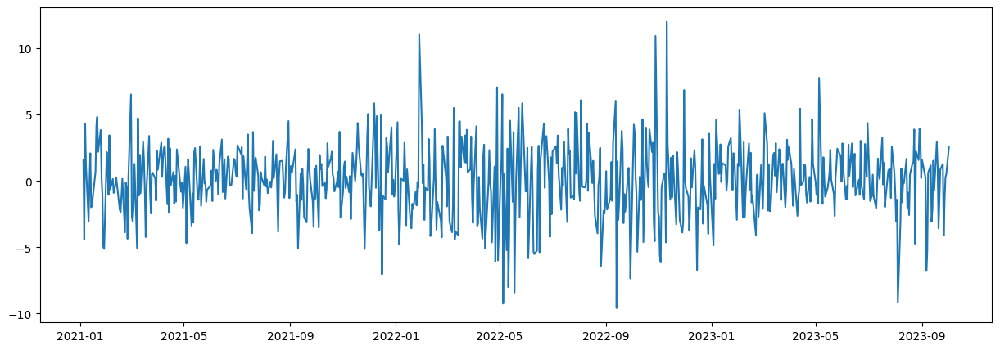

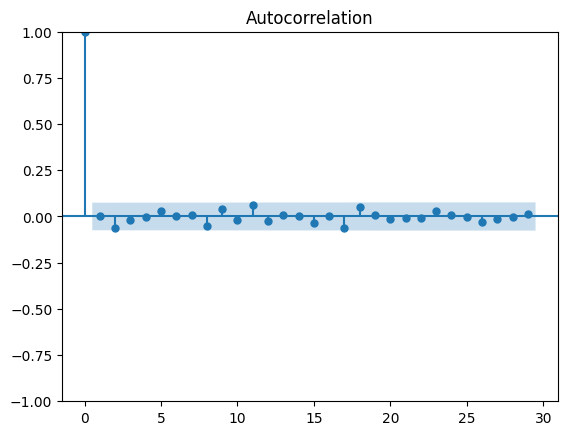

In [17]:
 # Load stock price data
stock = yf.download(['aapl'], start='2021-01-01', end='2024-03-28') #Insert Relevant Ticker Here
stock = pd.DataFrame(stock)

# Select the closing price column
#Training set
train = stock.iloc[:round(0.85 * len(stock)), :4]

train = pd.DataFrame(train, columns=[
    "Open",
    "High",
    "Low",
    "Close",

])

endog_data = train['Close']

#Test Set
test = stock.iloc[round(0.85 * len(stock)):len(stock), :4]

test = pd.DataFrame(test, columns=[
    "Open",
    "High",
    "Low",
    "Close",

])

test_endog = test['Close']

#Perform Differencing so that the data is stationary


#Perform one order of differencing on the data-set
diff = endog_data.diff().dropna() #Here we can performing one set of differencing

#Plot the impact on the autocorrelation and test with ad-fuller
plt.figure(figsize=(15,5))
plt.plot(diff)
plot_acf(diff)

#The data-set is therefore stationary and we can now perform ARIMA modelling or simply apply 1 in the differencing section of p, d, q.
adfuller(diff)[1] < 0.05

We can now work on the logic that we only need to difference once to acquire non-multicollinearity

In [18]:
def ARIMA_MODEL(Ticker, start, end, autoregressive, differencing, moving_average, prediction_period):
  """
     ARIMA model for share price prediction

    Parameters:
    - ticker: This determines the particular share price that we wish to review
    - start: This determines the start date for where the chosen ticker information will begin
    - end: This determines the end date for the chosen ticker information
    - autoregressive: This indicates the number of lag observations included in the model.
    - differencing: Differencing involves computing the difference between consecutive observations in a time series and is used to stabilise the mean to remove seasonality and trends.
     This mathematical calculation would therefore lead y2 = y2 - y1 and y3 = y2 - y1 for example in the case of first-order differencing.
    - moving_average: indicating the size of the moving average window. This is the number of lagged forecast errors which will go into the model.

    Returns:
    - Mean Squared Error (mse)
    - Real Mean Squared Error (rmse)
    - Mean Absolute Error (mae)


  """
  # Load stock price data
  stock = yf.download([Ticker], start=start, end=end) #Insert Relevant Ticker Here
  stock = pd.DataFrame(stock)

  # Select the closing price column
  #Training set
  train = stock.iloc[:round(0.85 * len(stock)), :4]

  train = pd.DataFrame(train, columns=[
    "Open",
    "High",
    "Low",
    "Close",

  ])

  endog_data = train['Close']

  #Test Set
  test = stock.iloc[round(0.85 * len(stock)):len(stock), :4]

  test = pd.DataFrame(test, columns=[
    "Open",
    "High",
    "Low",
    "Close",

  ])

  test_endog = test['Close']

  #Perform Differencing so that the data is stationary

  #Perform one order of differencing on the data-set
  diff = endog_data.diff().dropna() #Here we can performing one set of differencing

  #Run the model on the training data
  model = ARIMA(endog = endog_data, order=(autoregressive,differencing,moving_average))

  #Fit the model
  arima_model = model.fit()

  #Forecast the model using the first 7 pieces of exogenous data and then compare this to the actual results we observe
  forecast = arima_model.forecast(steps=prediction_period)

  #Implement DateTime Index and alter depending on how many predictions (remember to later above as well along with appropriate rows from exogenous data-set)
  date_index = pd.date_range(start='2023-10-03', periods=prediction_period, freq='B')

  forecast = pd.DataFrame(data=forecast.values, index=date_index)

  mse = mean_squared_error(test_endog[:prediction_period], forecast[:prediction_period])
  mae = mean_absolute_error(test_endog[:prediction_period], forecast[:prediction_period])
  rmse = sqrt(mse)

  specific_date = '2023-10-03'
  plt.style.use('seaborn-darkgrid')
  plt.figure(figsize=(15,5))
  plt.plot(test_endog[:prediction_period], color="Red", label="Actual Values")
  plt.plot(forecast, color="Blue", label = "Forecasted Values")
  plt.axvline(x=pd.to_datetime(specific_date), color='black', linestyle='--', label='Vertical Line')
  plt.title("ARIMA Modeling Forecast for {} over {} days with MSE: {:.4f}, RMSE:{} & MAE:{:.4f}".format(Ticker,prediction_period, mse, rmse, mae))
  plt.legend()
  plt.show()

  return {'Stock' : Ticker, 'Model' : 'ARIMA', 'Prediction Period' : prediction_period, 'Test MSE': mse, 'Test RMSE': rmse, 'Test MAE': mae}

# **ARIMA GRID SEARCH**

In [19]:
#def ARIMA_MODEL(Ticker, start, end, autoregressive, differencing, moving_average, prediction_period):
  # """
  #    ARIMA model for share price prediction

  #   Parameters:
  #   - ticker: This determines the particular share price that we wish to review
  #   - start: This determines the start date for where the chosen ticker information will begin
  #   - end: This determines the end date for the chosen ticker information
  #   - autoregressive: This indicates the number of lag observations included in the model.
  #   - differencing: Differencing involves computing the difference between consecutive observations in a time series and is used to stabilise the mean to remove seasonality and trends.
  #    This mathematical calculation would therefore lead y2 = y2 - y1 and y3 = y2 - y1 for example in the case of first-order differencing.
  #   - moving_average: indicating the size of the moving average window. This is the number of lagged forecast errors which will go into the model.

  # #   Returns:
  # #   - Mean Squared Error (mse)
  # #   - Real Mean Squared Error (rmse)
  # #   - Mean Absolute Error (mae)


  # # """
  # # Load stock price data
  # stock = yf.download([Ticker], start=start, end=end) #Insert Relevant Ticker Here
  # stock = pd.DataFrame(stock)

  # # Select the closing price column
  # #Training set
  # train = stock.iloc[:round(0.85 * len(stock)), :4]

  # train = pd.DataFrame(train, columns=[
  #   "Open",
  #   "High",
  #   "Low",
  #   "Close",

  # ])

  # endog_data = train['Close']

  # #Test Set
  # test = stock.iloc[round(0.85 * len(stock)):len(stock), :4]

  # test = pd.DataFrame(test, columns=[
  #   "Open",
  #   "High",
  #   "Low",
  #   "Close",

#   ])

#   test_endog = test['Close']

#   #Perform Differencing so that the data is stationary

#   #Perform one order of differencing on the data-set
#   diff = endog_data.diff().dropna() #Here we can performing one set of differencing

#   #Run the model on the training data
#   model = ARIMA(endog = endog_data, order=(autoregressive,differencing,moving_average))

#   #Fit the model
#   arima_model = model.fit()

#   #Forecast the model using the first 7 pieces of exogenous data and then compare this to the actual results we observe
#   forecast = arima_model.forecast(steps=prediction_period)

#   #Implement DateTime Index and alter depending on how many predictions (remember to later above as well along with appropriate rows from exogenous data-set)
#   date_index = pd.date_range(start='2023-10-03', periods=prediction_period, freq='B')

#   forecast = pd.DataFrame(data=forecast.values, index=date_index)

#   mse = mean_squared_error(test_endog[:prediction_period], forecast[:prediction_period])
#   mae = mean_absolute_error(test_endog[:prediction_period], forecast[:prediction_period])
#   rmse = sqrt(mse)

#   specific_date = '2023-10-03'
#   plt.style.use('seaborn-darkgrid')
#   plt.figure(figsize=(15,5))
#   plt.plot(test_endog[:prediction_period], color="Red", label="Actual Values")
#   plt.plot(forecast, color="Blue", label = "Forecasted Values")
#   plt.axvline(x=pd.to_datetime(specific_date), color='black', linestyle='--', label='Vertical Line')
#   plt.title("ARIMA Modeling Forecast for {} over {} days with MSE: {:.4f}, RMSE:{} & MAE:{:.4f}".format(Ticker,prediction_period, mse, rmse, mae))
#   plt.legend()
#   plt.show()

#   return {'Stock' : Ticker, 'Model' : 'ARIMA', 'Prediction Period' : prediction_period, 'Test MSE': mse, 'Test RMSE': rmse, 'Test MAE': mae, 'AutoRegressive' :autoregressive, 'Differencing' : differencing, 'Moving_Average':moving_average}


# #ARIMA MODELLING (Ticker, start, end, autoregressive, differencing, moving_average, prediction_period)

# # Define a list of timestep values to search over
# autoregressive = [0, 3, 6, 9, 12, 15]
# Ticker = ['AAPL', 'JNJ', 'TSLA']
# moving_average = [1, 5, 10, 15, 20, 25]
# prediction_period = [7, 30, 90]
# differencing = 1

# # Create an empty list to store results
# results = []

# # Perform grid search
# for value in autoregressive:
#     for ticker in Ticker:
#         for averages in moving_average:
#             for prediction in prediction_period:
#                 result = ARIMA_MODEL(ticker, '2021-01-01', '2024-03-28', value, differencing, averages, prediction)
#                 results.append(result)

# # Display results
# for i, result in enumerate(results):
#     print(f"Result {i+1}: {result}")

In [20]:
# df = pd.DataFrame(results)

# df_7 = df[df['Prediction Period'] == 7]
# df_30 = df[df['Prediction Period'] == 30]
# df_90 = df[df['Prediction Period'] == 90]

# df_7.sort_values(by="Test MSE", ascending=True)

# **7 Day Prediction Period**

In [21]:
#7 DAY PREDICTIONS FOR ALL STOCKS
#aapl_df = df_7[df_7['Stock'] == 'AAPL']
#aapl_df.sort_values(by="Test MSE", ascending=True).head(1) #15 AR 5 Moving average

In [22]:
#JNJ_df = df_7[df_7['Stock'] == 'JNJ']
#JNJ_df.sort_values(by="Test MSE", ascending=True).head(1) #12 AR and 25 MA

In [23]:
#TSLA_df = df_7[df_7['Stock'] == 'TSLA']
#TSLA_df.sort_values(by="Test MSE", ascending=True).head(1) #3AR and 15 MA

# **30 Day Prediction Period**

In [24]:
#aapl_df = df_30[df_30['Stock'] == 'AAPL']
#aapl_df.sort_values(by="Test MSE", ascending=True).head(1) #3 AR 20 Moving average

In [25]:
#JNJ_df = df_30[df_30['Stock'] == 'JNJ']
#JNJ_df.sort_values(by="Test MSE", ascending=True).head(1) #3 AR 5 Moving avera

In [26]:
#TSLA_df = df_30[df_30['Stock'] == 'TSLA']
#TSLA_df.sort_values(by="Test MSE", ascending=True).head(1) #9AR and 20 MA

# **90 Day Prediction Period**

In [27]:
#aapl_df = df_90[df_90['Stock'] == 'AAPL']
#aapl_df.sort_values(by="Test MSE", ascending=True).head(1) #3 AR 20 Moving average

In [28]:
#JNJ_df = df_90[df_90['Stock'] == 'JNJ']
#JNJ_df.sort_values(by="Test MSE", ascending=True).head(1) #9 AR 1 Moving avera

In [29]:
#TSLA_df = df_90[df_90['Stock'] == 'TSLA']
#TSLA_df.sort_values(by="Test MSE", ascending=True).head(1) #9AR and 20 MA

# **LSTM**

LSTM looks to improve the RNN process by eliminating the issue of a vanishing/exploding gradient. It does this by introducing a cell state and various other concepts such as forget gates, input gates and output gates.

**Cell State**:The cell state is a crucial aspect of LSTM and serves as a long-term memory. It runs along the entire chain of the LSTM cells, allowing information to persist or be modified over long sequences. The cell state can be seen as a "highway" that carries relevant information across different timesteps.

**Forget Gate**:The forget gate is responsible for deciding what information from the cell state should be discarded or kept. It takes input from the previous hidden state and the current input and outputs a value between 0 and 1 for each element in the cell state. This value is multiplied element-wise with the current cell state, determining what information to forget and what to retain.
Input Gate:

**Input Gate**: The input gate determines how much of the new information from the current input should be added to the cell state. Like the forget gate, it uses a sigmoid activation function to output values between 0 and 1. It also uses a tanh activation function to create a vector of new candidate values that could be added to the cell state. The output of the input gate is then combined with the cell state through element-wise addition.
Output Gate:

**Output Gate:** The output gate controls how much of the cell state should be exposed as the output at a given timestep. The output is determined by applying a sigmoid activation function to the previous hidden state and the current input, producing values between 0 and 1. The cell state is then passed through a tanh activation to squish the values between -1 and 1. The output is obtained by multiplying the tanh output with the sigmoid output, which determines the final output at the current timestep.

The LSTM architecture, with its cell state and gating mechanisms, allows the network to selectively retain or discard information at different timesteps, making it more effective in learning long-range dependencies. This helps mitigate the vanishing/exploding gradient problem, allowing the model to learn and remember relevant patterns over extended sequences.

## **LSTM HYPERPARAMETERS**

**hidden_nodes** = This is the number of neurons of the LSTM. If you have a higher number, the network gets more powerful. However, the number of parameters to learn also rises. This means it needs more time to train the network.

**timesteps** = the number of timesteps you want to consider. E.g. if you want to classify a sentence, this would be the number of words in a sentence.

**input_dim** = the dimensions of your features/embeddings. E.g. a vector representation of the words in the sentence

**dropout_value** = To reduce overfitting, the dropout layer just randomly takes a portion of the possible network connections. This value is the percentage of the considered network connections per epoch/batch.

# **Plot Data**

Reviewing the structure of the data and what do we want to use as our training set? - we can see from 2020 that just before 2020 the share price starts going up expoentially and therefore maybe data before-hand will just add noise to our models leading to less accurate predictions

[*********************100%%**********************]  1 of 1 completed


Text(0.5, 1.0, 'Share Price over the Past 7 Years')

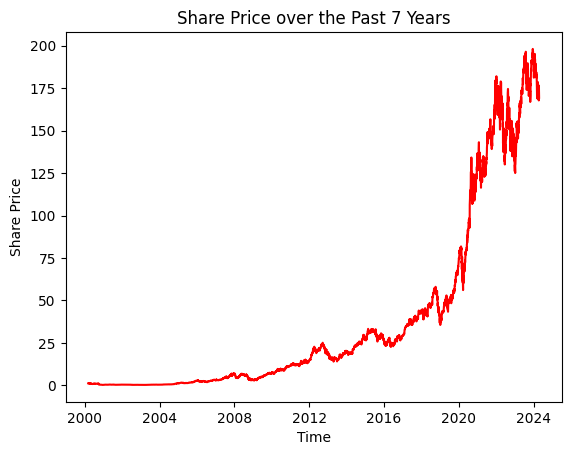

In [30]:
stock = yf.download(['aapl'], start="2000-03-06", end="2024-04-17") #Insert Relevant Ticker Here
plt.plot(stock['Close'], color="red")
plt.xlabel("Time")
plt.ylabel("Share Price")
plt.title("Share Price over the Past 7 Years")

[*********************100%%**********************]  1 of 1 completed


Text(0.5, 1.0, 'Share Price over the Past 7 Years')

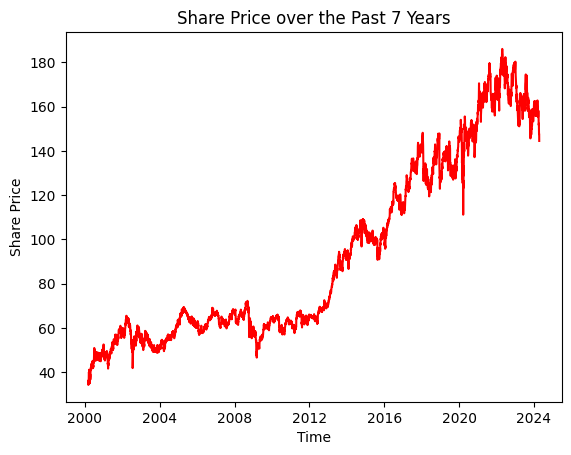

In [31]:
stock = yf.download(['JNJ'], start="2000-03-06", end="2024-04-17") #Insert Relevant Ticker Here
plt.plot(stock['Close'], color="red")
plt.xlabel("Time")
plt.ylabel("Share Price")
plt.title("Share Price over the Past 7 Years")

[*********************100%%**********************]  1 of 1 completed


Text(0.5, 1.0, 'Share Price over the Past 7 Years')

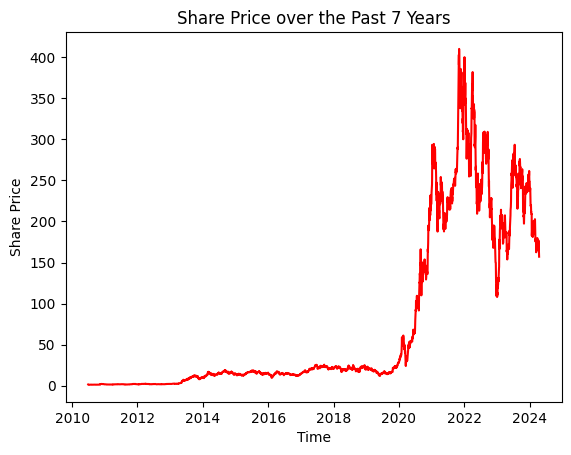

In [32]:
stock = yf.download(['TSLA'], start="2000-03-06", end="2024-04-17") #Insert Relevant Ticker Here
plt.plot(stock['Close'], color="red")
plt.xlabel("Time")
plt.ylabel("Share Price")
plt.title("Share Price over the Past 7 Years")

# **Neccessary Function For LSTM - Run Before Models Below!**

In [33]:
# convert series to supervised learning by Jason Brownlee
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
      """
      Frame a time series as a supervised learning dataset.
      Arguments:
        data: Sequence of observations as a list or NumPy array.
        n_in: Number of lag observations as input (X).
        n_out: Number of observations as output (y).
        dropnan: Boolean whether or not to drop rows with NaN values.
      Returns:
        Pandas DataFrame of series framed for supervised learning.
      """

      n_vars = 1 if type(data) is list else data.shape[1]
      df = pd.DataFrame(data)
      cols, names = list(), list()
      # input sequence (t-n, ... t-1)
      for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
      # forecast sequence (t, t+1, ... t+n)
      for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
          names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
          names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
      # put it all together
      agg = concat(cols, axis=1)
      agg.columns = names
      # drop rows with NaN values
      if dropnan:
        agg.dropna(inplace=True)
      return agg


# **LSTM Model**

Here we are using 11 features to predict t close price (open, high, low, close, Range, 7DAY-MA, 14DAY-MA, 21DAY-MA, 7DAY-EMA, 14DAY-EMA, 21DAY-EMA) we will use a timestep of 15 within the model which looks at the previous 15 values of these paramteres to predict the current close price value within the model (test-set), we have used a deep neural network with two LSTM layers of 512 neurons and 512 neurons respectively with a dense layer with 1 neuron for output.

In [34]:
def LSTM_MODEL(Ticker, start, end, batch_size, timestep, epochs, prediction_period):

    """
    LSTM model for share price prediction

      Parameters:
      - ticker: This determines the particular share price that we wish to review
      - start: This determines the start date for where the chosen ticker information will begin
      - end: This determines the end date for the chosen ticker information
      - batch_size: This determines the size of the subset of information that is processed at one time before weights are adjusted. Lower the value, the longer the runtime
      - timestep: The timestep determines how many previous iterations of each variable will be used to predict the close price at time t
      - epochs: The number of complete iterations over the entire training dataset during the training process. Each epoch involves forward and backward propagation to update the model's parameters based on the training data.

      Returns:
      - Mean Squared Error (mse)
      - Real Mean Squared Error (rmse)
      - Mean Absolute Error (mae)
      """


    stock1 = yf.download([Ticker], start=start, end=end) #Insert Relevant Ticker Here

    #FEATURE ENGINEERING

    ## Range ##
    stock1['Range'] = stock1['High'] - stock1['Low']

    ## Simple Moving Averages ##
    stock1['7DAY-MA'] = stock1['Close'].rolling(window=7).mean()
    stock1['14DAY-MA'] = stock1['Close'].rolling(window=14).mean()
    stock1['21DAY-MA'] = stock1['Close'].rolling(window=21).mean()

    ## Exponential Moving Averages ##
    stock1['7DAY-EMA'] = stock1['Close'].ewm(span=7, adjust=False).mean()
    stock1['14DAY-EMA'] = stock1['Close'].ewm(span=14, adjust=False).mean()
    stock1['21DAY-EMA'] = stock1['Close'].ewm(span=21, adjust=False).mean()


    stock1 = stock1.dropna() #Drop missing values created by moving averages

    #Filter for relevant variables to include
    stock = stock1[['Close', 'High', 'Low', 'Range', '7DAY-MA', '14DAY-MA', '21DAY-MA', '7DAY-EMA', '14DAY-EMA', '21DAY-EMA',  'Open']]

    #First 70% of the data can be used for training and remaining 30% for test and validation with 15% each
    train = stock.iloc[:555] #Training Data for first 70% of the training set
    val = stock.iloc[555:671-timestep]  #Validation Data for 15% of the set and minus timestep to ensure continuity for prediction period
    test = stock.iloc[671-timestep:] #test for unseen data at 15% and minus timestep to ensure continuity for prediction period

    #Set scaler
    scaler = MinMaxScaler()

    #Scale the variables
    scaled_train = scaler.fit_transform(train)
    scaled_val = scaler.transform(val)
    scaled_test = scaler.transform(test)

    #Create a DataFrame with appropriate names for the variables
    train_df = pd.DataFrame({
        'Close':scaled_train[:,0],
        'High':scaled_train[:,1],
        'Low':scaled_train[:,2],
        'Range':scaled_train[:,3],
        '7DAY-MA':scaled_train[:,4],
        '14DAY-MA':scaled_train[:,5],
        '21DAY-MA':scaled_train[:,6],
        '7DAY-EMA':scaled_train[:,7],
        '14DAY-EMA':scaled_train[:,8],
        '21DAY-EMA':scaled_train[:,9],
        'Open':scaled_train[:,10],
        })

    val_df = pd.DataFrame({
        'Close':scaled_val[:,0],
        'High':scaled_val[:,1],
        'Low':scaled_val[:,2],
        'Range':scaled_val[:,3],
        '7DAY-MA':scaled_val[:,4],
        '14DAY-MA':scaled_val[:,5],
        '21DAY-MA':scaled_val[:,6],
        '7DAY-EMA':scaled_val[:,7],
        '14DAY-EMA':scaled_val[:,8],
        '21DAY-EMA':scaled_val[:,9],
        'Open':scaled_val[:,10],
        })
    test_df = pd.DataFrame({
        'Close':scaled_test[:,0],
        'High':scaled_test[:,1],
        'Low':scaled_test[:,2],
        'Range':scaled_test[:,3],
        '7DAY-MA':scaled_test[:,4],
        '14DAY-MA':scaled_test[:,5],
        '21DAY-MA':scaled_test[:,6],
        '7DAY-EMA':scaled_test[:,7],
        '14DAY-EMA':scaled_test[:,8],
        '21DAY-EMA':scaled_test[:,9],
        'Open':scaled_test[:,10],
        })

    #reshape the data into a 3-D array - #(Number of rows, timestep, features)
    #Here we are keeping timestep as 1 as the series_to_supervised function sorts the data into relevant timesteps

    train_values_reshaped = np.array(train_df).reshape(len(train_df), 1, 11)
    val_values_reshaped = np.array(val_df).reshape(len(val_df), 1, 11)
    test_values_reshaped = np.array(test_df).reshape(len(test_df), 1, 11)

    #Determine the number of timesteps in the model (how many periods we are going to look back at when predicting the current time t)
    timestep = timestep

    #Use the function we designed at the start of this notebook above to frame for supervised learning, this takes our array and converts it to represent the timesteps that we desire (given above)
    train_reframed = series_to_supervised(train_df, timestep, 1) #This alters the number of lags using timestep and then n_out alters the number of predictions we are going to make (t+1) etc
    test_reframed = series_to_supervised(test_df, timestep, 1)
    val_reframed = series_to_supervised(val_df, timestep, 1)

    #Retain the values from the reframed matrix
    train_values = train_reframed.values
    test_values = test_reframed.values #FIND OUT WHERE T IS AND EXTRACT ALL OF THE COLUMNS UP TO THIS POINT AS THIS IS THE POINT WE WANT TO PREDICT AND APPLY THIS BELOW
    val_values = val_reframed.values

    #Split the data into previous time periods and and then the current time predictions (X = previous time and y=current time)
    X_train = train_values[:,:-11] #Here we have all of the previous timesteps for all of the other variables
    y_train = train_values[:, -11] #Here is the data for the current timestep for close Var1(t) = close price
    X_val = val_values[:, :-11]
    y_val = val_values[:, -11]
    X_test = test_values[:, :-11]
    y_test = test_values[:, -11]

    #We must pre-process the data so it is in 3D format for LSTM model [samples, timestep, features]
    X_train = X_train.reshape((X_train.shape[0], timestep, 11))
    X_val = X_val.reshape((X_val.shape[0], timestep, 11))
    X_test = X_test.reshape((X_test.shape[0], timestep , 11))

    #Fit the model for LSTM

    #Design the architecture of the network by creating a stacked LSTM that has 1024 hidden nodes in the first layer and 512 in the second with a final Dense layer for the ouput)
    #The input shape is determined by the timestep that we have decided, alongside the number of features that we are looking into.
    model = Sequential()
    model.add(LSTM(512,return_sequences=True, batch_input_shape=(batch_size, X_train.shape[1], X_train.shape[2]), stateful=False))
    model.add(LSTM(512))                                                                                                    #We can also add dropout here to reduce overfitting #model.add(LSTM(hidden_nodes, input_shape=(timesteps, input_dim)))
    model.add(Dense(1))
    custom_optimizer = Adam(learning_rate=0.001) #Adjust the learning rate here to alter the gradient descent learning rate if you wish
    model.compile(loss='mse', optimizer=custom_optimizer) #Optimisation algorithm has been selected as ADAM

    history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_val, y_val), verbose=2, shuffle=False)

    # plot training history
    plt.style.use('seaborn-darkgrid')
    plt.figure(figsize=(15,5))
    plt.plot(history.history['loss'], label='Train')
    plt.plot(history.history['val_loss'], label='Validation')
    plt.title('Validation Loss vs Training Loss')
    plt.legend()
    plt.show()
    plt.savefig("Training_Plot")

    #Prediction using X_test data
    yhat = model.predict(X_test)

    #Convert back to inverse form for proper analysis using inverse_transform package with scaling only undertaken on train-set
    scaler.fit(np.array(train['Close']).reshape(-1,1))
    yhat_original = scaler.inverse_transform(np.array(yhat).reshape(-1,1))
    y_test_original = scaler.inverse_transform(np.array(y_test).reshape(-1,1))

    #Now we want to compare the accuracy between the models
    mse = mean_squared_error(y_test_original[:prediction_period], yhat_original[:prediction_period])
    mae = mean_absolute_error(y_test_original[:prediction_period], yhat_original[:prediction_period])
    rmse = sqrt(mse)

    #Implement DateTime Index and alter depending on how many predictions (remember to later above as well along with appropriate rows from exogenous data-set)
    date_index = pd.date_range(start='2023-10-03', periods=len(yhat_original), freq='B')
    yhat_original = pd.DataFrame(data=yhat_original, index=date_index)

    #Implement DateTime Index and alter depending on how many predictions (remember to later above as well along with appropriate rows from exogenous data-set)
    date_index = pd.date_range(start='2023-10-03', periods=len(y_test_original), freq='B')
    y_test_original = pd.DataFrame(data=y_test_original, index=date_index)

    #compare the actual with the test results
    specific_date = '2023-10-03'
    plt.style.use('seaborn-darkgrid')
    plt.figure(figsize=(15,5))
    plt.plot(y_test_original[:prediction_period], color = 'red', label = 'actual')
    plt.plot(yhat_original[:prediction_period], color = 'blue', label = 'predicted')
    plt.axvline(x=pd.to_datetime(specific_date), color='black', linestyle='--', label='Vertical Line')
    plt.title("LSTM Model Predictions for {} over {} Days vs Test with MSE:{:.4f}, MAE:{:.4f} & RMSE:{:.4f}".format(Ticker, prediction_period, mse, rmse, mae))
    plt.xlabel('Day')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

    return {'Stock' : Ticker, 'Model' : 'LSTM', 'Prediction Period' : prediction_period, 'Test MSE': mse, 'Test RMSE': rmse, 'Test MAE': mae}

# **Grid Search for Timesteps**

In [35]:
# #LSTM_MODEL(Ticker, start, end, batch_size, timestep, epochs, prediction_period)

# # Define a list of timestep values to search over
# timestep_values = [2, 4, 6, 8, 10, 12, 14, 15]
# Ticker = ['AAPL', 'JNJ', 'TSLA']
# prediction_periods = [7, 30, 90]

# # Create an empty list to store results
# results = []

# # Perform grid search
# for timestep in timestep_values:
#     for ticker in Ticker:
#         for predictions in prediction_periods:
#           result = LSTM_MODEL(ticker, '2021-01-01', '2024-03-28', 72, timestep, 50, predictions)
#           results.append(result)

# # Display results
# for i, result in enumerate(results):
#     print(f"Result {i+1}: {result}")

In [36]:
# df = pd.DataFrame(results)
# # Create the timesteps values
# timesteps_values = [2, 4, 6, 8, 10, 12, 14, 15]

# # Repeat each value 9 times
# timesteps = [val for val in timesteps_values for _ in range(9)]

# # Add the timesteps column to the DataFrame
# df['timesteps'] = timesteps


In [37]:
# df_7 = df[df['Prediction Period'] == 7]
# df_30 = df[df['Prediction Period'] == 30]
# df_90 = df[df['Prediction Period'] == 90]

# **Best TimeStep for 7 Day Prediction Period**

In [38]:
# df = pd.DataFrame(df_7.groupby('timesteps')['Test MSE'].mean()) #best timestep = 14
# sns.barplot(
#     y = 'Test MSE',
#     x = 'timesteps',
#     data = df,
#     palette = sns.color_palette('Paired')
# )
# plt.title("Bar Chart for Timesteps for 7 Day Prediction Period")

# **Best TimeStep for 30 Day Prediction Period**

In [39]:
# df = pd.DataFrame(df_30.groupby('timesteps')['Test MSE'].mean()) #Best timestep = 14
# sns.barplot(
#     y = 'Test MSE',
#     x = 'timesteps',
#     data = df,
#     palette = sns.color_palette('Paired')
# )
# plt.title("Bar Chart for Timesteps for 30 Day Prediction Period")

# **Best TimeStep for 90 Day Prediction Period**

In [40]:
# df = pd.DataFrame(df_90.groupby('timesteps')['Test MSE'].mean()) #Best timestep = 14

In [41]:
# sns.barplot(
#     y = 'Test MSE',
#     x = 'timesteps',
#     data = df,
#     palette = sns.color_palette('Paired')

# )
# plt.title("Bar Chart for Timesteps for 90 Day Prediction Period")

# **Stateful LSTM**

Stateful LSTM carries over the information from the weights obtained within each batch from one epoch to the next, this therefore retains more information from past data points to assist with the predictions at the current time t

In [42]:
def stateful_LSTM(Ticker, start, end, timestep, epochs, prediction_period):

    """
    LSTM model with stateful=True for share price prediction, this means that the output from the batch at time t will become the initial state at time t+1.
    This generally helps models learn dependencies over long-periods of time.

      Parameters:
      - ticker: This determines the particular share price that we wish to review
      - start: This determines the start date for where the chosen ticker information will begin
      - end: This determines the end date for the chosen ticker information
      - timestep: The timestep determines how many previous iterations of each variable will be used to predict the close price at time t
      - epochs: The number of complete iterations over the entire training dataset during the training process. Each epoch involves forward and backward propagation to update the model's parameters based on the training data.
      - prediction_period: the length of the period that we wish to predict for

      Returns:
    - Mean Squared Error (mse)
    - Real Mean Squared Error (rmse)
    - Mean Absolute Error (mae)

    """
    stock1 = yf.download([Ticker], start=start, end=end) #Insert Relevant Ticker Here

    #FEATURE ENGINEERING

    ## Range ##
    stock1['Range'] = stock1['High'] - stock1['Low']

    ## Simple Moving Averages ##
    stock1['7DAY-MA'] = stock1['Close'].rolling(window=7).mean()
    stock1['14DAY-MA'] = stock1['Close'].rolling(window=14).mean()
    stock1['21DAY-MA'] = stock1['Close'].rolling(window=21).mean()

    ## Exponential Moving Averages ##
    stock1['7DAY-EMA'] = stock1['Close'].ewm(span=7, adjust=False).mean()
    stock1['14DAY-EMA'] = stock1['Close'].ewm(span=14, adjust=False).mean()
    stock1['21DAY-EMA'] = stock1['Close'].ewm(span=21, adjust=False).mean()


    stock1 = stock1.dropna() #Drop missing values created by moving averages

    #Filter for relevant variables to include
    stock = stock1[['Close', 'High', 'Low', 'Range', '7DAY-MA', '14DAY-MA', '21DAY-MA', '7DAY-EMA', '14DAY-EMA', '21DAY-EMA',  'Open']]

    #First 70% of the data can be used for training and remaining 30% for test and validation with 15% each
    train = stock.iloc[:555] #Training Data for first 70% of the training set
    val = stock.iloc[555:671-timestep]  #Validation Data for 15% of the set
    test = stock.iloc[671-timestep:] #test for unseen data at 15%

    #Set scaler
    scaler = MinMaxScaler()

    #Scale the variables
    scaled_train = scaler.fit_transform(train)
    scaled_val = scaler.transform(val)
    scaled_test = scaler.transform(test)

    #Create a DataFrame with appropriate names for the variables
    train_df = pd.DataFrame({
        'Close':scaled_train[:,0],
        'High':scaled_train[:,1],
        'Low':scaled_train[:,2],
        'Range':scaled_train[:,3],
        '7DAY-MA':scaled_train[:,4],
        '14DAY-MA':scaled_train[:,5],
        '21DAY-MA':scaled_train[:,6],
        '7DAY-EMA':scaled_train[:,7],
        '14DAY-EMA':scaled_train[:,8],
        '21DAY-EMA':scaled_train[:,9],
        'Open':scaled_train[:,10],
        })

    val_df = pd.DataFrame({
        'Close':scaled_val[:,0],
        'High':scaled_val[:,1],
        'Low':scaled_val[:,2],
        'Range':scaled_val[:,3],
        '7DAY-MA':scaled_val[:,4],
        '14DAY-MA':scaled_val[:,5],
        '21DAY-MA':scaled_val[:,6],
        '7DAY-EMA':scaled_val[:,7],
        '14DAY-EMA':scaled_val[:,8],
        '21DAY-EMA':scaled_val[:,9],
        'Open':scaled_val[:,10],
        })
    test_df = pd.DataFrame({
        'Close':scaled_test[:,0],
        'High':scaled_test[:,1],
        'Low':scaled_test[:,2],
        'Range':scaled_test[:,3],
        '7DAY-MA':scaled_test[:,4],
        '14DAY-MA':scaled_test[:,5],
        '21DAY-MA':scaled_test[:,6],
        '7DAY-EMA':scaled_test[:,7],
        '14DAY-EMA':scaled_test[:,8],
        '21DAY-EMA':scaled_test[:,9],
        'Open':scaled_test[:,10],
        })

    #reshape the data into a 3-D array - #(Number of rows, timestep, features)
    #Here we are keeping timestep as 1 as the series_to_supervised function sorts the data into relevant timesteps

    train_values_reshaped = np.array(train_df).reshape(len(train_df), 1, 11)
    val_values_reshaped = np.array(val_df).reshape(len(val_df), 1, 11)
    test_values_reshaped = np.array(test_df).reshape(len(test_df), 1, 11)

    #Determine the number of timesteps in the model (how many periods we are going to look back at when predicting the current time t)
    timestep = timestep

    #Use the function we designed at the start of this notebook above to frame for supervised learning, this takes our array and converts it to represent the timesteps that we desire (given above)
    train_reframed = series_to_supervised(train_df, timestep, 1) #This alters the number of lags using timestep and then n_out alters the number of predictions we are going to make (t+1) etc
    test_reframed = series_to_supervised(test_df, timestep, 1)
    val_reframed = series_to_supervised(val_df, timestep, 1)

    #Retain the values from the reframed matrix
    train_values = train_reframed.values
    test_values = test_reframed.values #FIND OUT WHERE T IS AND EXTRACT ALL OF THE COLUMNS UP TO THIS POINT AS THIS IS THE POINT WE WANT TO PREDICT AND APPLY THIS BELOW
    val_values = val_reframed.values

    #Split the data into previous time periods and and then the current time predictions (X = previous time and y=current time)
    X_train = train_values[:,:-11] #Here we have all of the previous timesteps for all of the other variables
    y_train = train_values[:, -11] #Here is the data for the current timestep for close Var1(t) = close price
    X_val = val_values[:, :-11]
    y_val = val_values[:, -11]
    X_test = test_values[:, :-11]
    y_test = test_values[:, -11]

    #We must pre-process the data so it is in 3D format for LSTM model [samples, timestep, features]
    X_train = X_train.reshape((X_train.shape[0], timestep, 11))
    X_val = X_val.reshape((X_val.shape[0], timestep, 11))
    X_test = X_test.reshape((X_test.shape[0], timestep , 11))

    #Fit the model for LSTM

    #Reshape so that they are in batches with an array in 3-dimensions with the data-set split into seperate batches of 36

    #X-train batching
    X_train_reshaped = X_train[:-(len(X_train) % 90)]  # Trim the data to be divisible by batch_size
    X_train_reshaped = X_train_reshaped.reshape((-1, timestep, 11))

    #Y_train batching
    y_train_reshaped = y_train[:-(len(y_train)%90)]
    y_train_reshaped = y_train_reshaped.reshape(-1, 1)

    #X_val batching
    X_val_reshaped = X_val[:-(len(X_val) % 90)]  # Trim the data to be divisible by batch_size
    X_val_reshaped = X_val_reshaped.reshape((-1, timestep, 11))

    #y_val batching
    y_val_reshaped = y_val[:-(len(y_val)%90)]
    y_val_reshaped = y_val_reshaped.reshape(-1, 1)

    #X_test batching
    X_test_reshaped = X_test[:-(len(X_test) % 90)]
    X_test_reshaped = X_test_reshaped.reshape((-1, timestep, 11))

    #Y_test batching
    y_test_reshaped = y_test[:-(len(y_test)% 90)]
    y_test_reshaped = y_test_reshaped.reshape(-1, 1)

    #design network with 512 hidden nodes in each year of LSTM with a Dense layer at the end with a singular output (higher the number, the more powerful the model becomes)
    #The input shape is determined by the timestep that we have decided, alongside the number of features that we are looking into.
    model = Sequential()
    model.add(LSTM(512, batch_input_shape=(90, X_train.shape[1], X_train.shape[2]), stateful=True, return_sequences=True)) #We dont experience rises in the validation loss so we don't implement dropout
    model.add(LSTM(512, stateful=True))                                                                  #We can also add dropout here to reduce overfitting #model.add(LSTM(hidden_nodes, input_shape=(timesteps, input_dim)))
    model.add(Dense(1))
    custom_optimizer = Adam(learning_rate=0.001) #Adjust the learning rate here to alter the gradient descent learning rate if you wish
    model.compile(loss='mse', optimizer=custom_optimizer)

    history = model.fit(X_train_reshaped, y_train_reshaped, epochs=epochs, batch_size=90, validation_data=(X_val_reshaped, y_val_reshaped), verbose=2, shuffle=False)
    model.reset_states()

    # plot training history
    plt.style.use('seaborn-darkgrid')
    plt.figure(figsize=(15,5))
    plt.plot(history.history['loss'], label='Train')
    plt.plot(history.history['val_loss'], label='Validation')
    plt.title('Validation Loss vs Training Loss')
    plt.legend()
    plt.show()
    plt.savefig("Training_Plot")

    #Prediction using X_test data
    yhat = model.predict(X_test_reshaped, batch_size=90)

    #Convert back to inverse form for proper analysis using inverse_transform package with scaling only undertaken on train-set
    scaler.fit(np.array(train['Close']).reshape(-1,1))
    yhat_original = scaler.inverse_transform(np.array(yhat).reshape(-1,1))
    y_test_original = scaler.inverse_transform(np.array(y_test).reshape(-1,1))

    #Now we want to compare the accuracy between the models
    mse = mean_squared_error(y_test_original[:7], yhat_original[:7])
    mae = mean_absolute_error(y_test_original[:7], yhat_original[:7])
    rmse = sqrt(mse)

    #Implement DateTime Index and alter depending on how many predictions (remember to later above as well along with appropriate rows from exogenous data-set)
    date_index = pd.date_range(start='2023-10-03', periods=len(yhat_original), freq='B')
    yhat_original = pd.DataFrame(data=yhat_original, index=date_index)

    #Implement DateTime Index and alter depending on how many predictions (remember to later above as well along with appropriate rows from exogenous data-set)
    date_index = pd.date_range(start='2023-10-03', periods=len(y_test_original), freq='B')
    y_test_original = pd.DataFrame(data=y_test_original, index=date_index)

    #compare the actual with the test results
    specific_date = '2023-10-03'
    plt.style.use('seaborn-darkgrid')
    plt.figure(figsize=(15,5))
    plt.plot(y_test_original[:prediction_period], color = 'red', label = 'actual')
    plt.plot(yhat_original[:prediction_period], color = 'blue', label = 'predicted')
    plt.axvline(x=pd.to_datetime(specific_date), color='black', linestyle='--', label='Vertical Line')
    plt.title("LSTM Model Predictions for {} over {} Days vs Test with MSE:{:.4f}, MAE:{:.4f} & RMSE:{:.4f}".format(Ticker, prediction_period, mse, rmse, mae))
    plt.xlabel('Day')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

    return {'Stock' : Ticker, 'Model' : 'Stateful_LSTM', 'Prediction Period' : prediction_period, 'Test MSE': mse, 'Test RMSE': rmse, 'Test MAE': mae}

# **Grid Search for Stateful LSTM**

In [43]:
# # Define a list of timestep values to search over
# timestep_values = [2, 4, 6, 8, 10, 12]
# Ticker = ['AAPL', 'JNJ', 'TSLA']
# prediction_periods = [7, 30, 90]

# # Create an empty list to store results
# results = []

# # Perform grid search
# for timestep in timestep_values:
#     for ticker in Ticker:
#         for predictions in prediction_periods:
#           result = stateful_LSTM(ticker, '2021-01-01', '2024-03-28', timestep, 50, predictions)
#           results.append(result)

# # Display results
# for i, result in enumerate(results):
#     print(f"Result {i+1}: {result}")

In [44]:
# df = pd.DataFrame(results)
# df = df.drop(df.index[-1])
# # Create the timesteps values
# timesteps_values = [2, 4, 6, 8, 10, 12]

# # Repeat each value 9 times
# timesteps = [val for val in timesteps_values for _ in range(9)]

# # Add the timesteps column to the DataFrame
# df['timesteps'] = timesteps

**Create Seperate Dataframes for each prediction period**

In [45]:
# df_7 = df[df['Prediction Period'] == 7]
# df_30 = df[df['Prediction Period'] == 30]
# df_90 = df[df['Prediction Period'] == 90]

# **Best Timestep for 7 Day Prediction Period**

In [46]:
# df = pd.DataFrame(df_7.groupby('timesteps')['Test MSE'].mean()) #best timestep = 4
# sns.barplot(
#     y = 'Test MSE',
#     x = 'timesteps',
#     data = df,
#     palette = sns.color_palette('Paired')
# )
# plt.title("Bar Chart for Timesteps for 7 Day Prediction Period")

# **Best Timestep for 30 Day Prediction Period**

In [47]:
# df = pd.DataFrame(df_30.groupby('timesteps')['Test MSE'].mean()) #Best timestep = 4
# sns.barplot(
#     y = 'Test MSE',
#     x = 'timesteps',
#     data = df,
#     palette = sns.color_palette('Paired')
# )
# plt.title("Bar Chart for Timesteps for 30 Day Prediction Period")

# **Best Timestep for 90 Day Prediction Period**

In [48]:
# df = pd.DataFrame(df_90.groupby('timesteps')['Test MSE'].mean()) #Best timestep = 8
# sns.barplot(
#     y = 'Test MSE',
#     x = 'timesteps',
#     data = df,
#     palette = sns.color_palette('Paired')

# )
# plt.title("Bar Chart for Timesteps for 90 Day Prediction Period")

# **Convolutional Neural Networks (CNN)**

**Data Preprocessing**


**`process_inputs_cnn`** function takes a price series and a window length, and generates a DataFrame `x_df` that contains the input sequences for the CNN model

In [49]:
# Define data processing functions
def process_inputs_cnn(price_series: pd.Series, window_length: int) -> pd.DataFrame:
  if window_length >= len(price_series):
      raise ValueError("window_length must be less than the length of price_series")

  dataframes = [price_series.shift(i).to_frame(f"T - {i}") for i in range(window_length)]
  df = pd.concat(dataframes, axis=1)

  # Since the last rows contain NaN values due to shifting, we need to drop them
  df.dropna(inplace=True)

  # Store the reference values in a separate column
  df['reference_value'] = price_series.reindex(df.index).values

  df.iloc[:, :-1] = df.iloc[:, :-1].divide(df['reference_value'], axis='index') - 1
  return df

**`process_targets_cnn`** function creates the target variables `y_series_7`, `y_series_30`, and `y_series_90` for the `7-day`, `30-day`, and `90-day` predictions, respectively


In [50]:
def process_targets_cnn(perf_series: pd.Series, days: int) -> pd.DataFrame:
  """
  Creates targets consisting of data `days` days after the reference date (i.e. the most recent input's date)
  :param perf_series: The stock price returns data to extract targets from.
  :param days: The number of days into the future to create the targets.
  :return: A DataFrame where one column stores the prices `days` days after the reference dates,
            and another column stores the percentage change.
  """
  # Shift the perf_series to get the prices `days` days after the reference dates
  prices_future = perf_series.shift(-days)

  # Calculate the percentage change
  pct_change = perf_series.pct_change(periods=days)

  # Drop NaN values resulting from shifting and percentage change calculation
  df = pd.DataFrame({'actual_price': prices_future, 'percentage_change': pct_change}).dropna()

  return df

**`prepare_price_data_cnn`** function combines the input and target data

In [51]:
def prepare_price_data_cnn(ticker, start_date, end_date, d):

  stock = yf.Ticker(ticker)

  price_series = stock.history(start=start_date, end=end_date)['Close'].dropna()

  x_df = process_inputs_cnn(price_series, window_length=10)

  y_series = process_targets_cnn(price_series, d)

  # Only keep rows in which we have both inputs and data.
  common_index = x_df.index.intersection(y_series.index)

  x_df, y_series = x_df.loc[common_index], y_series.loc[common_index]

  return x_df, y_series

**`split_data_cnn`** function splits the data into training and test sets for the `7-day`, `30-day`, and `90-day` predictions

In [52]:
def split_data_cnn(ticker, start_date, end_date, d):

  x_df, y_series = prepare_price_data_cnn(ticker, start_date, end_date, d)

  training_start = datetime.datetime(2021, 1, 1, tzinfo=pytz.timezone('America/New_York'))
  training_end = datetime.datetime(2023, 10, 1, tzinfo=pytz.timezone('America/New_York'))
  test_start = datetime.datetime(2023, 10, 2, tzinfo=pytz.timezone('America/New_York'))

  # Isolate training data consisting of every data point from `2021-01-01` to `2023-10-02`
  training_x_series = x_df.loc[(x_df.index >= training_start) & (x_df.index <= training_end)]
  training_y_series = y_series.loc[(y_series.index >= training_start) & (y_series.index <= training_end)]

  # Isolate test data consisting of data points for the next 7, 30, and 90 days starting from `2023-10-03`
  test_x_series = x_df.loc[(x_df.index >= test_start) & (x_df.index < test_start + datetime.timedelta(days=d))]
  test_y_series = y_series.loc[(y_series.index >= test_start) & (y_series.index < test_start + datetime.timedelta(days=d))]

  return training_x_series, training_y_series, test_x_series, test_y_series


**`CNNStocksDataset`** class is a PyTorch Dataset that provides the input and target tensors for the `CNN model`

In [53]:
from torch.utils.data import Dataset

class CNNStocksDataset(Dataset):
  def __init__(self, x_tensor: torch.Tensor, y_tensor: torch.Tensor):
    self._x_tensor = x_tensor
    self._y_tensor = y_tensor

  def __len__(self):
    return self._y_tensor.shape[0]

  def __getitem__(self, idx: int):
    return self._x_tensor[idx, :], self._y_tensor[idx]


**`CNNStocksModule`** class defines the CNN model architecture, including a 1D convolutional layer, an adaptive max pooling layer, and a linear layer for the final prediction

In [54]:
from torch import nn

class CNNStocksModule(nn.Module):
  OUT_CHANNELS = 30 # Number of CNN channels
  KERNEL_SIZE = 10  # Size of CNN kernel

  def __init__(self, window_length: int):
    super(CNNStocksModule, self).__init__()

    assert window_length >= self.KERNEL_SIZE
    self.cnn = nn.Conv1d(
        1,  # In channel size
        self.OUT_CHANNELS,
        self.KERNEL_SIZE
    )


    self.pool = nn.AdaptiveMaxPool1d(1)

    self.linear = nn.Linear(self.OUT_CHANNELS, 1, bias=True)

  def forward(self, x):
    out = self.cnn(x.unsqueeze(1))
    out = self.pool(out).squeeze()
    # out = torch.softmax(out, dim=1)
    out = self.linear(out).squeeze()
    return out

**`train_cnn`** function is responsible for training the CNN model using the provided input and target data. It sets up the dataloader, defines the loss function and optimizer, and conducts the training process

In [55]:
from functools import partial
from torch.utils.data import DataLoader

LEARNING_RATE = 1e-4
WEIGHT_DECAY = 1e-6

def train_cnn(x_df: pd.DataFrame, y_series: pd.Series, epochs: int = 100):
  """
  Trains the CNNStocksModule model
  :param x_df: Inputs consisting of sequences of stock price returns
  :param y_series: Targets consisting of returns some days in advance of the reference dates
  :param epochs: Number of complete iterations to go through the data in order to train
  :return: The trained CNNStocksModule model
  """
  # Put data into GPU if possible
  dataloader_kwargs = {}
  if torch.cuda.is_available():
    torch.set_default_tensor_type('torch.cuda.FloatTensor')  # Store all training data in the GPU
    dataloader_kwargs['generator'] = torch.Generator(device='cuda')
  else:
    torch.set_default_tensor_type('torch.FloatTensor')

  # Turn pandas objects into Pytorch tensor objects
  x_tensor, y_tensor = torch.tensor(x_df.values).float(), torch.tensor(y_series.values).float()

  # Set up the dataloader
  train_dataset = CNNStocksDataset(x_tensor, y_tensor)
  train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=True, **dataloader_kwargs)

  loss_func = partial(torch.nn.functional.huber_loss, delta=0.02)


  model = CNNStocksModule(x_df.shape[1]).train()
  if torch.cuda.is_available():  # Train on GPU if possible
    model = model.cuda()

  optimizer = torch.optim.Adam(
    model.parameters(),
    lr=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY
  )

  # Conduct training which consists of homing the model in on the best parameters that minimize the loss
  for i in range(epochs):
    total_loss = 0.
    for x, y in train_dataloader:
      optimizer.zero_grad()
      out = model(x)
      loss = loss_func(out, y)
      loss.backward()
      optimizer.step()
      total_loss += loss.cpu().detach().numpy()

  return model

**`predict_cnn`** function uses the trained model to generate predictions for the provided input data

In [56]:
def predict_cnn(trained_model, x_df: pd.DataFrame) -> pd.Series:
  """
  Generates predictions using a trained model
  :param trained_model: Trained Pytorch model
  :param x_df: Inputs to generate predictions for
  :return: Series containing predictions, with reference dates as indices
  """
  trained_model.eval()

  x_tensor = torch.tensor(x_df.values).float()
  prediction = trained_model(x_tensor)

  return pd.Series(prediction.cpu().detach().numpy(), index=x_df.index)

**Evaluation and Plotting**

**`evaluate_model_cnn`** function trains the CNN model using the training data, generates predictions for the test data, and computes evaluation metrics (MAE, MSE, RMSE) for the predictions

In [57]:
def evaluate_model_cnn(training_x_series, training_y_series, test_x_series, test_y_series):

  training_y_set = training_y_series['percentage_change']
  test_y_set = test_y_series['actual_price']
  test_y_set = test_x_series['reference_value']

  trained_model = train_cnn(training_x_series.drop(columns='reference_value'), training_y_set)
  normalized_predicted = predict_cnn(trained_model, test_x_series.drop(columns='reference_value'))

  # Denormalize the forecast using the stored reference values
  predicted_series = (normalized_predicted + 1) * test_y_set

  results_df = predicted_series.to_frame('Predicted Value').join(test_y_set.to_frame('Actual Value')).dropna()

  return results_df

In [58]:
def evaluate_predictions_cnn(ticker, actual, predicted, d):
    mae = mean_absolute_error(actual, predicted)
    mse = mean_squared_error(actual, predicted)
    rmse = sqrt(mse)  # or mse**(0.5)

    return {'Stock' : ticker, 'Model' : 'CNN', 'Prediction Period' : d, 'Test MSE': mse, 'Test RMSE': rmse, 'Test MAE': mae}

**`plot_actual_vs_predicted`** function plots the actual and predicted prices for the test data.

In [59]:
def plot_actual_vs_predicted_cnn(results_df, eval_results):
  """
  plot actual stock prices versus predicted stock prices
  Args:
  - results_df: dataframe with actual and predicted values
  - eval: contains informations about evaluation metrics
  Returns:
  - None
  """
  plt.figure(figsize = (15, 5))
  plt.style.use('seaborn-darkgrid')

  plt.plot(results_df.index, results_df['Actual Value'], label = 'Actual')
  plt.plot(results_df.index, results_df['Predicted Value'], label = 'Predicted')
  plt.title('CNN model predictions for {} over {} days vs test with MSE:{:.4f}, MAE:{:.4f} & RMSE:{:.4f}'.format(eval_results['Stock'], eval_results['Prediction Period'], eval_results['Test MSE'], eval_results['Test RMSE'], eval_results['Test MAE']))
  plt.xlabel('Date')
  plt.ylabel('Close Price')
  plt.legend()
  plt.show()

In [60]:
def cnn(ticker, start_date, end_date, d):
  training_x_series, training_y_series, test_x_series, test_y_series = split_data_cnn(ticker, start_date, end_date, d)
  results_df = evaluate_model_cnn(training_x_series, training_y_series, test_x_series, test_y_series)
  eval_results = evaluate_predictions_cnn(ticker, results_df['Actual Value'], results_df['Predicted Value'], d)
  plot_actual_vs_predicted_cnn(results_df, eval_results)
  return eval_results


# **Recurrent Neural Network (RNN)**

**```load_and_preprocess_data_rnn```** function is responsible for loading and preprocessing the stock data.

In [61]:
def load_and_preprocess_data_rnn(ticker, start_date, end_date, train_start, train_end, test_start):
  """
  load and process stock data
  Args:
    ticker: ticker symbol
    start_date: start date
    end_date: end date
    train_start: start date of training data
    train_end: end date of training data
    test_start: start date of test data

  Returns:
    tuple
  """

  # Step 1: Download the stock data using yfinance
  df = yf.download(ticker, start=start_date, end=end_date)

  # Step 2: Extract the training and test data
  train_data = df[train_start: train_end].iloc[:, 3:4]
  test_data = df[test_start:].iloc[:, 3:4]

  # Step 3: Reshape the data
  dataset_train = np.reshape(train_data.Close.values, (-1, 1))
  dataset_test = np.reshape(test_data.Close.values, (-1, 1))

  # Step 4: Scale the data
  scaler = MinMaxScaler(feature_range=(0, 1))
  scaled_train = scaler.fit_transform(dataset_train)
  scaled_test = scaler.fit_transform(dataset_test)

  return scaled_train, scaled_test, scaler, test_data, df

**```create_sequences_rnn```** function is responsible for creating input and target sequences for the RNN model

In [62]:
def create_sequences_rnn(scaled_data, sequence_length):
    """
    Create input and target sequence

    Args:
        scaled_data: scaled data
        sequence_length: length of the input sequence.

    Returns:
        tuple
    """
    X, y = [], []
    for i in range(len(scaled_data) - sequence_length):
        X.append(scaled_data[i:i + sequence_length])
        y.append(scaled_data[i + 1:i + sequence_length + 1])
    X, y = np.array(X), np.array(y)

    # Convert data to PyTorch tensors
    X = torch.tensor(X, dtype=torch.float32)
    y = torch.tensor(y, dtype=torch.float32)
    return X, y

**```RNNModel```** PyTorch module that defines the RNN model

In [63]:
class RNNModel(nn.Module):
  def __init__(self, input_size, hidden_size, num_layers):
   super(RNNModel, self).__init__()
   self.rnn = nn.RNN(input_size, hidden_size, num_layers, batch_first = True)
   self.linear = nn.Linear(hidden_size, 1)

  def forward(self, x):
    out, _ = self.rnn(x)
    out = self.linear(out)
    return out

 **Model Training**

**```train_model_rnn```** function is responsible for training the RNN model

In [64]:
def train_model_rnn(model, train_loader, test_loader, num_epochs, device):
    """
    Train the RNN model.

    Args:
        model: RNN model to train.
        train_loader: training data loader.
        test_loader: test data loader.
        num_epochs: number of training epochs.
        device: device to run the model on.

    Returns:
        tuple
    """
    loss_fn = torch.nn.MSELoss(reduction='mean')
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    train_hist = []
    test_hist = []

    for epoch in range(num_epochs):
        total_loss = 0.0
        model.train()
        for batch_X, batch_y in train_loader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device)
            predictions = model(batch_X)
            loss = loss_fn(predictions, batch_y)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        average_loss = total_loss / len(train_loader)
        train_hist.append(average_loss)

        model.eval()
        with torch.no_grad():
            total_test_loss = 0.0
            for batch_X_test, batch_y_test in test_loader:
                batch_X_test, batch_y_test = batch_X_test.to(device), batch_y_test.to(device)
                predictions_test = model(batch_X_test)
                test_loss = loss_fn(predictions_test, batch_y_test)
                total_test_loss += test_loss.item()

            average_test_loss = total_test_loss / len(test_loader)
            test_hist.append(average_test_loss)

        if (epoch + 1) % 10 == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}] - Training Loss: {average_loss:.4f}, Test Loss: {average_test_loss:.4f}')

    return train_hist, test_hist

**```plot_loss_rnn```** function plots the training and testing loss over the number of epochs

In [65]:
def plot_loss_rnn(train_hist, test_hist, num_epochs):
  x = np.linspace(1, num_epochs, num_epochs)
  plt.plot(x, train_hist, scalex=True, label="Training loss")
  plt.plot(x, test_hist, label="Test loss")
  plt.legend()
  plt.show()

 **Prediction**

```predict_rnn``` function predicts stock prices using a trained Recurrent Neural Network (RNN) model

In [66]:
def predict_rnn(model, X_test, test_data, dates, num_forecast_steps, scaler, device):
    """
    Predict output for the given input using trained RNN model

    Args:
        model: trained model
        X_test: test input data
        test_data: actual test data
        dates (pandas.DatetimeIndex): The dates corresponding to the test data.
        num_forecast_steps: dates w.r.t testt data

    Returns:
        DataFrame
    """
    dates = list(dates)
    start_index = dates.index(pd.to_datetime('2023-10-02'))

    # Convert to NumPy and remove singleton dimensions
    sequence_to_plot = X_test.squeeze().cpu().numpy()

    # Use the last 30 data points as the starting point
    historical_data = sequence_to_plot[-1]

    # Initialize a list to store the forecasted values and prediction dates
    predicted_values = []
    prediction_dates = []

    # Use the trained model to predict values
    with torch.no_grad():
        for _ in range(num_forecast_steps):
            # Prepare the historical_data tensor
            historical_data_tensor = torch.as_tensor(historical_data).view(1, -1, 1).float().to(device)
            # Use the model to predict the next value
            predicted_value = model(historical_data_tensor).cpu().numpy()[0, 0]

            # Append the predicted value to the predicted_values list
            predicted_values.append(predicted_value[0])

            # Update the historical_data sequence by removing the oldest value and adding the predicted value
            historical_data = np.roll(historical_data, shift=-1)
            historical_data[-1] = predicted_value

            prediction_dates.append(dates[start_index + _])

    # Perform inverse transformation on the predicted values
    predicted_values = scaler.inverse_transform([predicted_values])[0]

    # Get the actual values
    actual_values = test_data.loc[prediction_dates].values.squeeze()

    # Create a DataFrame with the actual and predicted values
    df = pd.DataFrame({
        'Actual Value': actual_values,
        'Predicted Value': predicted_values
    }, index=prediction_dates)

    return df

 **Evaluation and Plotting**

**`evaluate_model_rnn`** function trains the RNN model using the training data, generates predictions for the test data, and computes evaluation metrics (MAE, MSE, RMSE) for the predictions

In [67]:
def evaluate_predictions_rnn(ticker, actual, predicted, d):
    mae = mean_absolute_error(actual, predicted)
    mse = mean_squared_error(actual, predicted)
    rmse = sqrt(mse)  # or mse**(0.5)

    return {'Stock' : ticker, 'Model' : 'RNN', 'Prediction Period' : d,'Test MSE': mse, 'Test RMSE': rmse, 'Test MAE': mae}

**`plot_actual_vs_predicted_rnn`** function plots the actual and predicted prices for the test data.

In [68]:
def plot_actual_vs_predicted_rnn(results_df, eval_results):
  """
  plot actual stock prices versus predicted stock prices
  Args:
    results_df: dataframe with actual and predicted values
    eval: contains informations about evaluation metrics

  Returns:
    None
  """
  plt.figure(figsize = (15, 5))
  plt.style.use('seaborn-darkgrid')

  plt.plot(results_df.index, results_df['Actual Value'], label = 'Actual')
  plt.plot(results_df.index, results_df['Predicted Value'], label = 'Predicted')
  plt.title('RNN model predictions for {} over {} days vs test with MSE:{:.4f}, MAE:{:.4f} & RMSE:{:.4f}'.format(eval_results['Stock'], eval_results['Prediction Period'], eval_results['Test MSE'], eval_results['Test RMSE'], eval_results['Test MAE']))
  plt.xlabel('Date')
  plt.ylabel('Close Price')
  plt.legend()
  plt.show()

**Hyperparameters used in the context of training a Recurrent Neural Network (RNN)**

In [69]:
def rnn_hyper_params():
  input_size = 1
  num_layers = 2
  hidden_size = 64
  output_size = 1
  batch_size = 16
  num_epochs = 50
  sequence_length_train = 50
  sequence_length_test = 30
  return input_size, num_layers, hidden_size, output_size, batch_size, num_epochs, sequence_length_train, sequence_length_test

In [70]:
def rnn(ticker, start_date, end_date, d):

  train_start = "2021-01-01"
  train_end = "2023-10-01"
  test_start = "2023-10-02"

  scaled_train, scaled_test, scaler, test_data, df = load_and_preprocess_data_rnn(ticker, start_date, end_date, train_start, train_end, test_start)
  input_size, num_layers, hidden_size, output_size, batch_size, num_epochs, sequence_length_train, sequence_length_test = rnn_hyper_params()
  X_train, y_train = create_sequences_rnn(scaled_train, sequence_length_train)
  X_test, y_test = create_sequences_rnn(scaled_test, sequence_length_test)

  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  model = RNNModel(input_size, hidden_size, num_layers).to(device)

  train_dataset = torch.utils.data.TensorDataset(X_train, y_train)
  train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
  test_dataset = torch.utils.data.TensorDataset(X_test, y_test)
  test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

  train_hist, test_hist = train_model_rnn(model, train_loader, test_loader, num_epochs, device)
  plot_loss_rnn(train_hist, test_hist, num_epochs)

  results_df = predict_rnn(model, X_test, test_data, df.index, d, scaler, device)
  eval_results = evaluate_predictions_rnn(ticker, results_df['Actual Value'], results_df['Predicted Value'], d)
  plot_actual_vs_predicted_rnn(results_df, eval_results)
  return eval_results



#**Random Forest Regression**

#**Grid Search for Hyperparameters**

In [71]:
# stock = yf.download(['aapl'], start="2021-01-01", end="2024-03-28")
# df = stock[['Open', 'Close', 'High', 'Low']]


# train = df.iloc[:round(0.7*len(df))]
# val = df.iloc[round(0.7*len(df)):round(0.85*len(df))]
# test = df.iloc[round(0.85*len(df)):]

# #Put into target and predictor variables
# X_train = train
# y_train = train['Close']
# X_val = val
# y_val = val['Close']
# X_test = test
# y_test = test['Close']

# #Introduce lags into the system so that we predict Close price at time t with predictor variables at time t - 1
# X_train = X_train.shift(-1).dropna()
# X_val = X_val.shift(-1).dropna()
# X_test = X_test.shift(-1).dropna()
# y_train = y_train.shift(1).dropna()
# y_val = y_val.shift(1).dropna()
# y_test = y_test.shift(1).dropna()

# # Define the grid search parameters
# param_grid = {'n_estimators': [50, 100, 250, 500, 750, 1000],
#               'random_state' : [42]}

# # Perform the grid search
# grid_search = GridSearchCV(RandomForestRegressor(), param_grid, cv=5, scoring='neg_root_mean_squared_error')
# grid_search.fit(X_train, y_train)

# # Print the best alpha value and the corresponding validation score
# print(f"Best n_estimators: {grid_search.best_params_['n_estimators']}")
# print(f"Best validation score: {-grid_search.best_score_}")

#**Model**


In [72]:
def random_forest(Ticker, Start, End, predict_days):
  """
   Random Forest Model for share price prediction
   Ticker: Determine which share price we want to be used for prediction
   Start: Sets which date we want the dataset to start from
   End: Sets which date we wan to end on
   predict_days: Determines the Number of days into the future we want to predict the stock price

   Returns :
   'Predicted vs Actual price: plots the results from the test set and returns the results dictionary which contains keys  metrics (MSE, RMSE,MAE)
   """

  stock = yf.download([Ticker], start= Start, end= End)

  df = pd.DataFrame(stock)

  df = df.drop(['Volume', 'Adj Close'], axis = 1) # Volume has a low correlation with the target variable and removing it slightly reduces the RMSE

#Train, Test Split
  train = df.iloc[:round(0.7*len(df))]
  val = df.iloc[round(0.7*len(df)):round(0.85*len(df))]
  test = df.iloc[round(0.85*len(df)):]

  X_train = train
  y_train = train['Close']
  X_val = val
  y_val = val['Close']
  X_test = test
  y_test = test['Close']

  original_y_test_index = y_test.index  #original index is used in the visualisation plot to match the correct dates with the predictions

  X_train = X_train.shift(-1).dropna()
  X_val = X_val.shift(-1).dropna()
  X_test = X_test.shift(-1).dropna()
  y_train = y_train.shift(1).dropna()
  y_val = y_val.shift(1).dropna()
  y_test = y_test.shift(1).dropna()

#Model Fitting
  rf_model = RandomForestRegressor(n_estimators=250, random_state=42)
  rf_model.fit(X_train, y_train)

  y_train_pred = rf_model.predict(X_train)
  train_rmse = mean_squared_error(y_train, y_train_pred, squared = False)
  train_mse = mean_squared_error(y_train, y_train_pred)
  train_mae = mean_absolute_error(y_train, y_train_pred)
  print(f"Train RMSE: {train_rmse} Train MSE : {train_mse} Train MAE : {train_mae}")

  y_val_pred = rf_model.predict(X_val)
  val_mse = mean_squared_error(y_val, y_val_pred)
  val_mae = mean_absolute_error(y_val, y_val_pred)
  val_rmse = val_mse = mean_squared_error(y_val, y_val_pred, squared = False)
  print(f"Validation RMSE: {val_rmse}, Validation MSE: {val_mse}, Validation MAE: {val_mae}")

  X_test_subset = X_test.iloc[:predict_days] #model can only see a certain number of days to reflect real world situation
  y_test_pred = rf_model.predict(X_test_subset)
  y_test_values = y_test.values[:predict_days]

  test_mse = mean_squared_error(y_test_values, y_test_pred)
  test_mae = mean_absolute_error(y_test_values, y_test_pred)
  test_rmse = mean_squared_error(y_test_values, y_test_pred, squared = False)
  print(f"Test RMSE: {test_rmse}, Test MSE: {test_mse}, Test MAE: {test_mae}")


  #Plotting visualisation
  plt.figure(figsize=(12, 6))
  plt.plot(original_y_test_index[:predict_days], y_test_values, color='blue', label='Actual Close Price')
  plt.plot(original_y_test_index[:predict_days], y_test_pred, color='red', label='Predicted Close Price')
  plt.xlabel('Date')
  plt.ylabel('Close Price')
  plt.title(f'Random Forest Model: {Ticker} Actual vs. Predicted Close Price for {predict_days} Days')
  plt.legend()
  plt.grid(True)
  plt.show()

  print(f" Random Forest Model: Actual Close Price: {y_test_values}, Predicted Close Price: {y_test_pred}")

  rf_results = {'Stock' : Ticker, 'Model': 'Random Forest', 'Prediction Period': predict_days, 'Test MSE' : test_mse, 'Test RMSE': test_rmse, 'Test MAE' : test_mae}

  return rf_results

# **Linear Regression**

In [73]:
def Linear_Reg (Ticker, Start, End, predict_days):
    """
    Linear Regression Model for share price prediction

    Ticker: Determines which share we want the prediction to be undertaken on
    Start: From which date do we want the data to start from
    End: Which date do we wish the data to end

    Returns:

    'Predicted vs Actual': Plots the results from the test set and the actual to review accuracy
    """

    pd.set_option('display.max_columns', None)
    pd.set_option('display.max_rows', None)

    stock = yf.download([Ticker], start=Start, end=End)

    df = pd.DataFrame(stock)

    df = df.drop(['Volume', 'Adj Close'], axis = 1) # Volume has a low correlation with the target variable and removing it slightly reduces the RMSE

    #df['Price_Momentum_15_days'] = df['Close'].pct_change(periods = 15) * 100
    #df['Price_Momentum_30_days'] = df['Close'].pct_change(periods = 30) * 100
    #df = df.dropna(subset=['Price_Momentum_15_days', 'Price_Momentum_30_days'])

    #Exponential Moving Averages
    df['7DAY-EMA'] = df['Close'].ewm(span=7, adjust=False).mean()
    df['14DAY-EMA'] = df['Close'].ewm(span=14, adjust=False).mean()
    df['21DAY-EMA'] = df['Close'].ewm(span=21, adjust=False).mean()

    #Train, Test Split
    train = df.iloc[:round(0.7*len(df))]
    val = df.iloc[round(0.7*len(df)):round(0.85*len(df))]
    test = df.iloc[round(0.85*len(df)):]

    X_train = train
    y_train = train['Close']
    X_val = val
    y_val = val['Close']
    X_test = test
    y_test = test['Close']

    original_y_test_index = y_test.index  #original index is used in the visualisation plot to match the correct dates with the predictions

    #Introduce lags into the system so that we predict Close price at time t with predictor variables at time t - 1
    X_train = X_train.shift(-1).dropna()
    X_val = X_val.shift(-1).dropna()
    X_test = X_test.shift(-1).dropna()
    y_train = y_train.shift(1).dropna()
    y_val = y_val.shift(1).dropna()
    y_test = y_test.shift(1).dropna()

    #Model Fitting
    lr_model = LinearRegression()
    lr_model.fit(X_train, y_train)

    y_train_pred = lr_model.predict(X_train)
    train_rmse = mean_squared_error(y_train, y_train_pred, squared = False)
    train_mse = mean_squared_error(y_train, y_train_pred)
    train_mae = mean_absolute_error(y_train, y_train_pred)
    print(f"Train RMSE: {train_rmse} Train MSE : {train_mse} Train MAE : {train_mae}")

    y_val_pred = lr_model.predict(X_val)
    val_mse = mean_squared_error(y_val, y_val_pred)
    val_mae = mean_absolute_error(y_val, y_val_pred)
    val_rmse = val_mse = mean_squared_error(y_val, y_val_pred, squared = False)
    print(f"Validation RMSE: {val_rmse}, Validation MSE: {val_mse}, Validation MAE: {val_mae}")

    X_test_subset = X_test.iloc[:predict_days] #model can only see a certain number of days to reflect real world situation
    y_test_pred = lr_model.predict(X_test_subset)
    y_test_values = y_test.values[:predict_days]

    test_mse = mean_squared_error(y_test_values, y_test_pred)
    test_mae = mean_absolute_error(y_test_values, y_test_pred)
    test_rmse = mean_squared_error(y_test_values, y_test_pred, squared = False)
    print(f"Test RMSE: {test_rmse}, Test MSE: {test_mse}, Test MAE: {test_mae}")


  #Plotting visualisation
    plt.figure(figsize=(12, 6))
    plt.plot(original_y_test_index[:predict_days], y_test_values, color='blue', label='Actual Close Price')
    plt.plot(original_y_test_index[:predict_days], y_test_pred, color='red', label='Predicted Close Price')
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.title(f' Linear Regression: {Ticker} Actual vs. Predicted Close Price for {predict_days} Days')
    plt.legend()
    plt.grid(True)
    plt.show()

    print(f" Linear Regression Model: Actual Close Price: {y_test_values}, Predicted Close Price: {y_test_pred}")

    lr_results = {'Stock' : Ticker, 'Model': 'Linear Regression', 'Prediction Period': predict_days, 'Test MSE' : test_mse, 'Test RMSE': test_rmse, 'Test MAE' : test_mae}

    return lr_results


#**Support Vector Regression (SVR)**

# **Grid Search to Establish Best Parameters**

Linear SVR

Original

In [74]:
# stock = yf.download(['aapl'], start="2021-03-06", end="2024-03-06")
# stock = stock[['Open', 'Close', 'High', 'Low']]

# #Scale the data
# scaler = MinMaxScaler()
# scaler.fit(stock)

# #Put into target and predictor variables
# X = stock[['Open', 'High', 'Low']]
# y = stock['Close']

# #Split the data-set
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, shuffle=False)

# #GridSearch used to find best hyper-parameters for the model by testing them all

# param_grid = {'C': [0.1, 1, 10, 100],
#               'epsilon': [0.1, 0.2, 0.5, 1],
#               'kernel': ['linear', 'rbf', 'poly']}

# grid_search = GridSearchCV(SVR(), param_grid, cv=5, scoring='neg_mean_absolute_error')
# grid_search.fit(X_train, y_train)

# best_params = grid_search.best_params_
# best_svr = grid_search.best_estimator_

In [75]:
# stock = yf.download(['aapl'], start="2021-01-01", end="2024-03-28")
# stock = stock[['Open', 'Close', 'High', 'Low']]

# #Scale the data
# scaler = MinMaxScaler()
# scaler.fit(stock)

# #Put into target and predictor variables
# X = stock[['Open', 'High', 'Low', 'Close']]
# y = stock['Close']

# #Split the data-set
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, shuffle=False)

# X_train = X_train.shift(-1).dropna()
# X_test = X_test.shift(-1).dropna()
# y_test = y_test.shift(1).dropna()
# y_train = y_train.shift(1).dropna()


# #GridSearch used to find best hyper-parameters for the model by testing them all

# param_grid = {'C': [0.1, 1, 10, 100],
#               'epsilon': [0.1, 0.2, 0.5, 1],
#               'kernel': ['linear', 'rbf', 'poly']}

# grid_search = GridSearchCV(SVR(), param_grid, cv=5, scoring='neg_mean_absolute_error')
# grid_search.fit(X_train, y_train)

# best_params = grid_search.best_params_
# best_svr = grid_search.best_estimator_

# print(best_params, best_svr)

In [76]:
# stock = yf.download(['aapl'], start="2021-01-01", end="2024-03-28")
# stock = stock[['Open', 'Close', 'High', 'Low']]

# #Scale the data
# scaler = MinMaxScaler()
# scaler.fit(stock)

# #Put into target and predictor variables
# X = stock[['Open', 'High', 'Low', 'Close']]
# y = stock['Close']

# #Split the data-set
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, shuffle=False)

# X_train = X_train.shift(-1).dropna()
# X_test = X_test.shift(-1).dropna()
# y_test = y_test.shift(1).dropna()
# y_train = y_train.shift(1).dropna()


# #GridSearch used to find best hyper-parameters for the model by testing them all

# param_grid = {'C': [0.1, 1, 10, 100],
#               'epsilon': [0.1, 0.2, 0.5, 1],
#               'kernel': ['linear']}

# grid_search = GridSearchCV(SVR(), param_grid, cv=5, scoring='neg_mean_absolute_error')
# grid_search.fit(X_train, y_train)

# best_params = grid_search.best_params_
# best_svr = grid_search.best_estimator_

# print(best_params, best_svr)

In [77]:
# stock = yf.download(['aapl'], start="2021-01-01", end="2024-03-28")
# stock = stock[['Open', 'Close', 'High', 'Low']]

# #Scale the data
# scaler = MinMaxScaler()
# scaler.fit(stock)

# #Put into target and predictor variables
# X = stock[['Open', 'High', 'Low', 'Close']]
# y = stock['Close']

# #Split the data-set
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, shuffle=False)

# X_train = X_train.shift(-1).dropna()
# X_test = X_test.shift(-1).dropna()
# y_test = y_test.shift(1).dropna()
# y_train = y_train.shift(1).dropna()


# #GridSearch used to find best hyper-parameters for the model by testing them all

# param_grid = {'C': [0.1, 1, 10, 100],
#               'epsilon': [0.1, 0.2, 0.5, 1],
#               'kernel': ['rbf']}

# grid_search = GridSearchCV(SVR(), param_grid, cv=5, scoring='neg_mean_absolute_error')
# grid_search.fit(X_train, y_train)

# best_params = grid_search.best_params_
# best_svr = grid_search.best_estimator_

# print(best_params, best_svr)

# **Given Grid Search Above Best Paramters (c=1, epsilon=0.5, kernel='linear')**

#Linear activation function means that scaling isn't as impactful and using it has impacted our results

In [78]:
def SVR_Linear_model(Ticker, Start, End, predict_days):
  """
   Linear SVR Model for stock price prediction
   Ticker: Determine which share price we want to be used for prediction
   Start: Sets which date we want the dataset to start from
   End: Sets which date we wan to end on
   predict_days: Determines the Number of days into the future we want to predict the stock price

   Returns :
   'Predicted vs Actual price: plots the results from the test set and returns the results dictionary which contains keys  metrics (MSE, RMSE,MAE)
  """

  stock = yf.download([Ticker], start= Start, end= End)
  stock = stock[['Open', 'Close', 'High', 'Low']]

  df = pd.DataFrame(stock)

  train = df.iloc[:round(0.7*len(df))]
  val = df.iloc[round(0.7*len(df)):round(0.85*len(df))]
  test = df.iloc[round(0.85*len(df)):]

  X_train = train.drop('Close', axis = 1) #Model performed slightly better when Close column dropped
  y_train = train['Close']
  X_val = val.drop('Close', axis = 1)
  y_val = val['Close']
  X_test = test.drop('Close', axis = 1)
  y_test = test['Close']

  original_y_test_index = y_test.index #original index is used in the visualisation plot to match the correct dates with the predictions

#Introduce lags into the system so that we predict Close price at time t with predictor variables at time t - 1
  X_train = X_train.shift(-1).dropna()
  X_val = X_val.shift(-1).dropna()
  X_test = X_test.shift(-1).dropna()
  y_train = y_train.shift(1).dropna()
  y_val = y_val.shift(1).dropna()
  y_test = y_test.shift(1).dropna()


#FIT THE MODEL USING THE BEST POSSIBLE SVR PARAMETERS WE HAVE ESTABLISHED FROM GRIDSEARCH
  svr_model = SVR(C=1, epsilon=0.5, kernel='linear')
  model = svr_model.fit(X_train, y_train)


  y_train_pred = model.predict(X_train)
  train_rmse = mean_squared_error(y_train, y_train_pred, squared = False)
  train_mse = mean_squared_error(y_train, y_train_pred)
  train_mae = mean_absolute_error(y_train, y_train_pred)
  print(f"Train RMSE: {train_rmse} Train MSE : {train_mse} Train MAE : {train_mae}")

  y_val_pred = model.predict(X_val)
  val_mse = mean_squared_error(y_val, y_val_pred)
  val_mae = mean_absolute_error(y_val, y_val_pred)
  val_rmse = val_mse = mean_squared_error(y_val, y_val_pred, squared = False)
  print(f"Validation RMSE: {val_rmse}, Validation MSE: {val_mse}, Validation MAE: {val_mae}")

  X_test_subset = X_test.iloc[:predict_days] #model can only see a certain number of days to reflect real world situation
  y_test_pred = model.predict(X_test_subset)
  y_test_values = y_test.values[:predict_days]

  test_mse = mean_squared_error(y_test_values, y_test_pred)
  test_mae = mean_absolute_error(y_test_values, y_test_pred)
  test_rmse = mean_squared_error(y_test_values, y_test_pred, squared = False)
  print(f"Test RMSE: {test_rmse}, Test MSE: {test_mse}, Test MAE: {test_mae}")


  plt.figure(figsize=(12, 6))
  plt.plot(original_y_test_index[:predict_days], y_test_values, color='blue', label='Actual Close Price')
  plt.plot(original_y_test_index[:predict_days], y_test_pred, color='red', label='Predicted Close Price')
  plt.xlabel('Date')
  plt.ylabel('Close Price')
  plt.title(f' Linear SVR Model : {Ticker} Actual vs. Predicted Close Price for {predict_days} Days')
  plt.legend()
  plt.grid(True)
  plt.show()

  print(f" Linear SVR Model: Actual Close Price: {y_test_values}, Predicted Close Price: {y_test_pred}")

  SVR_Linear_results = {'Stock' : Ticker, 'Model': 'SVR Linear', 'Prediction Period': predict_days, 'Test MSE': test_mse, 'Test RMSE': test_rmse, 'Test MAE' : test_mae}


  return SVR_Linear_results


#**Ridge Regression**

#**Grid Search for Alpha Hyperparamter**

In [79]:
# stock = yf.download(['aapl'], start="2021-01-01", end="2024-03-28")
# stock = stock[['Open', 'Close', 'High', 'Low']]

# #Scale the data
# #scaler = MinMaxScaler()
# #scaler.fit(stock)

# #Put into target and predictor variables
# X = stock[['Open', 'High', 'Low']]
# y = stock['Close']

# #Split the data-set
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, shuffle=False)

# param_grid = {'alpha': [0.1, 1, 10, 100, 1000, 10000]}

# # Perform the grid search
# grid_search = GridSearchCV(Ridge(), param_grid, cv=5, scoring='neg_root_mean_squared_error')
# grid_search.fit(X_train, y_train)

# # Print the best alpha value and the corresponding validation score
# print(f"Best alpha: {grid_search.best_params_['alpha']}")
# print(f"Best validation score: {-grid_search.best_score_}")

#**Model**

In [80]:
def Ridge_Reg(Ticker, Start, End, predict_days):
  """
   Ridge Regression Model for share price prediction
   Ticker: Determine which share price we want to be used for prediction
   Start: Sets which date we want the dataset to start from
   End: Sets which date we wan to end on
   predict_days: Determines the Number of days into the future we want to predict the stock price

   Returns :
   'Predicted vs Actual price: plots the results from the test set and returns the results dictionary which contains keys  metrics (MSE, RMSE,MAE)
  """

  stock = yf.download([Ticker], start= Start, end= End)

  df = pd.DataFrame(stock)

  df = df.drop(['Volume', 'Adj Close'], axis = 1) # Volume has a low correlation with the target variable and removing it slightly reduces the RMSE

#Exponential Moving Averages
  df['7DAY-EMA'] = df['Close'].ewm(span=7, adjust=False).mean()
  df['14DAY-EMA'] = df['Close'].ewm(span=14, adjust=False).mean()
  df['21DAY-EMA'] = df['Close'].ewm(span=21, adjust=False).mean()

#Train, Test Split
  train = df.iloc[:round(0.7*len(df))]
  val = df.iloc[round(0.7*len(df)):round(0.85*len(df))]
  test = df.iloc[round(0.85*len(df)):]

  X_train = train
  y_train = train['Close']
  X_val = val
  y_val = val['Close']
  X_test = test
  y_test = test['Close']

  original_y_test_index = y_test.index #original index is used in the visualisation plot to match the correct dates with the predictions

#Introduce lags into the system so that we predict Close price at time t with predictor variables at time t - 1
  X_train = X_train.shift(-1).dropna()
  X_val = X_val.shift(-1).dropna()
  X_test = X_test.shift(-1).dropna()
  y_train = y_train.shift(1).dropna()
  y_val = y_val.shift(1).dropna()
  y_test = y_test.shift(1).dropna()

#Model Fitting

  Ridge_model= Ridge(alpha = 1)
  Ridge_model.fit(X_train, y_train)

  y_train_pred = Ridge_model.predict(X_train)
  train_rmse = mean_squared_error(y_train, y_train_pred, squared = False)
  train_mse = mean_squared_error(y_train, y_train_pred)
  train_mae = mean_absolute_error(y_train, y_train_pred)
  print(f"Train RMSE: {train_rmse} Train MSE : {train_mse} Train MAE : {train_mae}")

  y_val_pred = Ridge_model.predict(X_val)
  val_mse = mean_squared_error(y_val, y_val_pred)
  val_mae = mean_absolute_error(y_val, y_val_pred)
  val_rmse = val_mse = mean_squared_error(y_val, y_val_pred, squared = False)
  print(f"Validation RMSE: {val_rmse}, Validation MSE: {val_mse}, Validation MAE: {val_mae}")

  X_test_subset = X_test.iloc[:predict_days] #model can only see a certain number of days to reflect real world situation
  y_test_pred = Ridge_model.predict(X_test_subset)
  y_test_values = y_test.values[:predict_days]

  test_mse = mean_squared_error(y_test_values, y_test_pred)
  test_mae = mean_absolute_error(y_test_values, y_test_pred)
  test_rmse = mean_squared_error(y_test_values, y_test_pred, squared = False)
  print(f"Test RMSE: {test_rmse}, Test MSE: {test_mse}, Test MAE: {test_mae}")

  plt.figure(figsize=(12, 6))
  plt.plot(original_y_test_index[:predict_days], y_test_values, color='blue', label='Actual Close Price')
  plt.plot(original_y_test_index[:predict_days], y_test_pred, color='red', label='Predicted Close Price')
  plt.xlabel('Date')
  plt.ylabel('Close Price')
  plt.title(f' Ridge Regression Model : {Ticker} Actual vs. Predicted Close Price for {predict_days} Days')
  plt.legend()
  plt.grid(True)
  plt.show()

  print(f" Ridge Regression Model: Actual Close Price: {y_test_values}, Predicted Close Price: {y_test_pred}")

  Ridge_Reg_results = {'Stock' : Ticker, 'Model': 'Ridge Regression', 'Prediction Period': predict_days, 'Test MSE' : test_mse ,'Test RMSE': test_rmse, 'Test MAE': test_mae}

  return Ridge_Reg_results



#**ANN**

In [81]:
def ANN_1 (Ticker, Start, End, predict_days):

    """
    ANN Model for share price prediction

    Ticker: Determines which share we want the prediction to be undertaken on
    Start: From which date do we want the data to start from
    End: Which date do we wish the data to end

    Returns:

    'Predicted vs Actual': Plots the results from the test set and the actual to review accuracy
    """
    pd.set_option('display.max_columns', None)
    pd.set_option('display.max_rows', None)

    stock = yf.download([Ticker], start=Start, end=End)

    df = pd.DataFrame(stock)
    original_dates = df.index

    df = df.drop(['Volume', 'Adj Close'], axis = 1) #Check and compare if dropping Volume improves result metrics

    #Creating 12 & 26 day EMAs
    df['12_EMA'] = df['Close'].ewm(span=12, adjust=False).mean()
    df['26_EMA'] = df['Close'].ewm(span=26, adjust=False).mean()

    ##Feature Scaling
    #scaler = MinMaxScaler(feature_range=(0, 1))
    #scaled_df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

    close_scaler = MinMaxScaler(feature_range=(0, 1))
    close_scaled = close_scaler.fit_transform(df[['Close']])

    ##Data preparation
    # Assuming 'Close' is at index 0 after scaling
    #scaled_data = scaled_df.values  # Convert to numpy array for sequence generation
    scaled_df = pd.DataFrame(index=df.index)
    scaled_df['close_scaled'] = close_scaled.flatten()

    look_back = 60
    #data_length = len(scaled_data)
    data_length = len(close_scaled)

    # Generate sequences
    X, y = [], []
    for i in range(look_back, data_length):
        X.append(close_scaled[i-look_back:i])  # Include all features in sequence
        y.append(close_scaled[i, 0])  # Assuming 'Close' is at index 0
    X, y = np.array(X), np.array(y)

    ##Splitting the data
    # Calculate split indices
    train_size = int(X.shape[0] * 0.7)
    val_size = int(X.shape[0] * 0.15) + train_size

    # Split the sequences
    X_train, y_train = X[:train_size], y[:train_size]
    X_val, y_val = X[train_size:val_size], y[train_size:val_size]
    X_test, y_test = X[val_size:], y[val_size:]

    # Convert arrays back to DataFrames for shifting
    X_train_df = pd.DataFrame(X_train.reshape(X_train.shape[0], -1))
    X_val_df = pd.DataFrame(X_val.reshape(X_val.shape[0], -1))
    X_test_df = pd.DataFrame(X_test.reshape(X_test.shape[0], -1))

    y_train_series = pd.Series(y_train)
    y_val_series = pd.Series(y_val)
    y_test_series = pd.Series(y_test)

    ##Shifting for ANN model
    X_train_shifted = X_train_df.shift(-1).dropna()
    y_train_shifted = y_train_series.shift(1).dropna()

    X_val_shifted = X_val_df.shift(-1).dropna()
    y_val_shifted = y_val_series.shift(1).dropna()

    X_test_shifted = X_test_df.shift(-1).dropna()
    y_test_shifted = y_test_series.shift(1).dropna()

    ## Reshaping for ANN model
    X_train_flattened = X_train_shifted.values.reshape(X_train_shifted.shape[0], -1)
    X_val_flattened = X_val_shifted.values.reshape(X_val_shifted.shape[0], -1)
    X_test_flattened = X_test_shifted.values.reshape(X_test_shifted.shape[0], -1)

    ##Applying ANN model and model fitting
    input_shape = (X_train_flattened.shape[1],)

    model = Sequential([
        Input(shape=input_shape),
        Dense(128, activation='relu'),
        Dense(64, activation='relu'),
        Dense(1)
    ])

    model.compile(optimizer='adam', loss='mean_squared_error')

    model.fit(X_train_flattened, y_train_shifted, epochs=100, batch_size=64)

    ##Model prediction and evaluation metrics

    #Training dataset performance
    y_train_pred = model.predict(X_train_flattened)
    y_train_pred = y_train_pred.flatten()

    train_rmse = mean_squared_error(y_train_shifted, y_train_pred, squared=False)
    train_mse = mean_squared_error(y_train_shifted, y_train_pred)
    train_mae = mean_absolute_error(y_train_shifted, y_train_pred)
    print(f"Train RMSE: {train_rmse}, Train MSE: {train_mse}, Train MAE: {train_mae}")

    #Validation dataset performance
    y_val_pred = model.predict(X_val_flattened)
    y_val_pred = y_val_pred.flatten()

    val_rmse = mean_squared_error(y_val_shifted, y_val_pred, squared=False)
    val_mse = mean_squared_error(y_val_shifted, y_val_pred)
    val_mae = mean_absolute_error(y_val_shifted, y_val_pred)
    print(f"Validation RMSE: {val_rmse}, Validation MSE: {val_mse}, Validation MAE: {val_mae}")

    #Test dataset performance
    X_test_subset = X_test_flattened[:predict_days]
    y_test_pred = model.predict(X_test_subset)
    y_test_pred = y_test_pred.flatten()

    # Inverse transform the predictions and actual values
    y_test_pred = close_scaler.inverse_transform(y_test_pred.reshape(-1, 1)).flatten()
    y_test_values = close_scaler.inverse_transform(y_test[:predict_days].reshape(-1, 1)).flatten()

    # Calculate the performance metrics using the inverse transformed values
    test_rmse = mean_squared_error(y_test_values, y_test_pred, squared = False)
    test_mse = mean_squared_error(y_test_values, y_test_pred)
    test_mae = mean_absolute_error(y_test_values, y_test_pred)
    print(f"Test RMSE: {test_rmse}, Test MSE: {test_mse}, Test MAE: {test_mae}")

    test_dates = original_dates[-len(y_test):][:predict_days]

    plt.figure(figsize=(12, 6))
    plt.plot(test_dates, y_test_values, color='blue', label='Actual Close Price')
    plt.plot(test_dates, y_test_pred, color='red', label='Predicted Close Price')
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.title(f'ANN: {Ticker} Actual vs. Predicted Close Price for {predict_days} Days')
    plt.legend()
    plt.grid(True)
    plt.show()

    #print(f" ANN Model: Actual Close Price: {y_test_values}, Predicted Close Price: {y_test_pred}")

    ann_results = {'Stock' : Ticker, 'Model': 'ANN', 'Prediction Period': predict_days, 'Test MSE' : test_mse, 'Test RMSE': test_rmse, 'Test MAE' : test_mae}

    return ann_results

#**Results**

Results across prediction periods

Overall Results

# **Appending Results**

In [82]:
_7_Day_Results = []
_30_Day_Results = []
_90_Day_Results = []

[*********************100%%**********************]  1 of 1 completed


Epoch 1/100
9/9 [==============================] - 2s 9ms/step - loss: 0.0534
Epoch 2/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0134
Epoch 3/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0071
Epoch 4/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0049
Epoch 5/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0037
Epoch 6/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 7/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 8/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0020
Epoch 9/100
9/9 [==============================] - 0s 10ms/step - loss: 0.0019
Epoch 10/100
9/9 [==============================] - 0s 10ms/step - loss: 0.0017
Epoch 11/100
9/9 [==============================] - 0s 9ms/step - loss: 0.0017
Epoch 12/100
9/9 [==============================] - 0s 8ms/step - loss: 0.0015
Epoch 13/100
9/9 [==============================] - 0s 9ms/

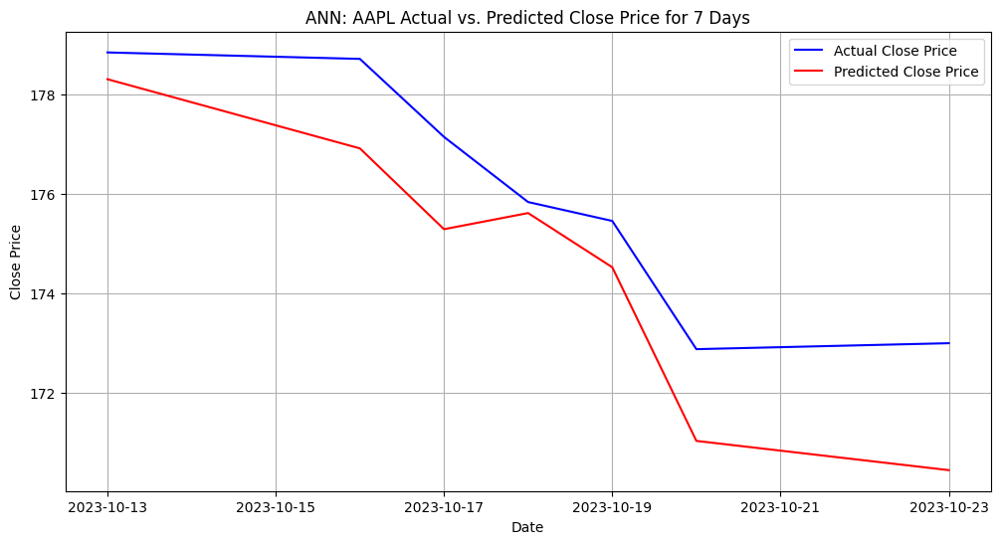

[*********************100%%**********************]  1 of 1 completed


Epoch 1/100
9/9 [==============================] - 1s 3ms/step - loss: 0.0355
Epoch 2/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0089
Epoch 3/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 4/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 5/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 6/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 7/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 8/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 9/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 10/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 11/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 12/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 13/100
9/9 [==============================] - 0s 3ms/st

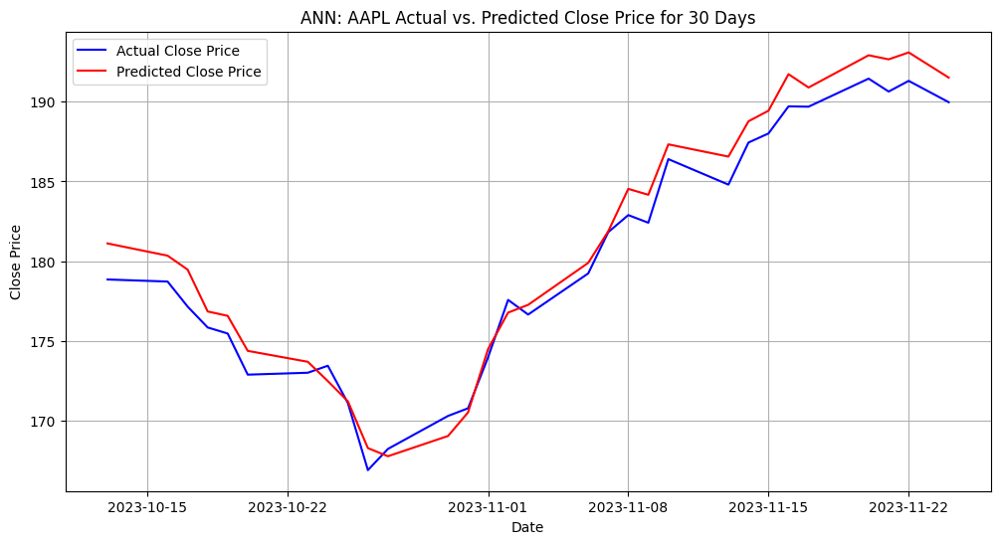

[*********************100%%**********************]  1 of 1 completed

Epoch 1/100


9/9 [==============================] - 1s 3ms/step - loss: 0.1140
Epoch 2/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0238
Epoch 3/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0124
Epoch 4/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0080
Epoch 5/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 6/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0041
Epoch 7/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 8/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 9/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 10/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 11/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 12/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 13/100
9/9 [==============================] - 0s 3ms/step - loss: 0

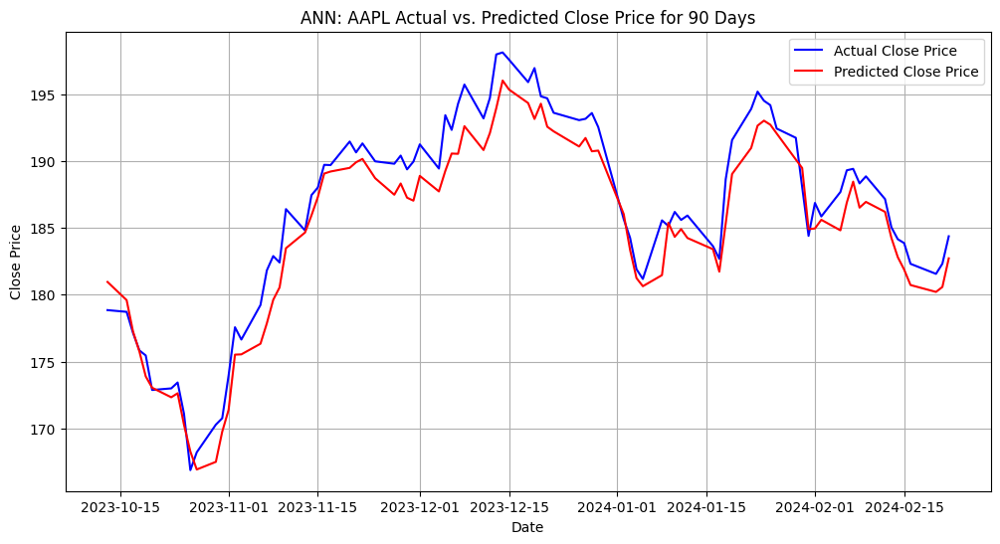

[*********************100%%**********************]  1 of 1 completed


Epoch 1/100
9/9 [==============================] - 1s 3ms/step - loss: 0.0936
Epoch 2/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0329
Epoch 3/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 4/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0122
Epoch 5/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0077
Epoch 6/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0059
Epoch 7/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0049
Epoch 8/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0044
Epoch 9/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0039
Epoch 10/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 11/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 12/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 13/100
9/9 [==============================] - 0s 4ms/st

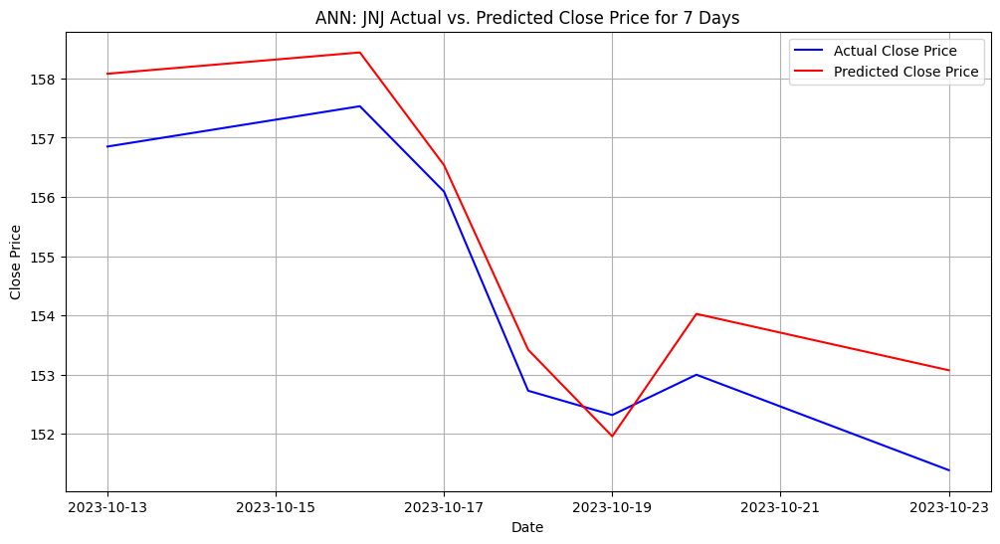

[*********************100%%**********************]  1 of 1 completed

Epoch 1/100


9/9 [==============================] - 1s 3ms/step - loss: 0.0351
Epoch 2/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0087
Epoch 3/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0066
Epoch 4/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 5/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0043
Epoch 6/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 7/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 8/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 9/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 10/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 11/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 12/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 13/100
9/9 [==============================] - 0s 4ms/step - loss: 0

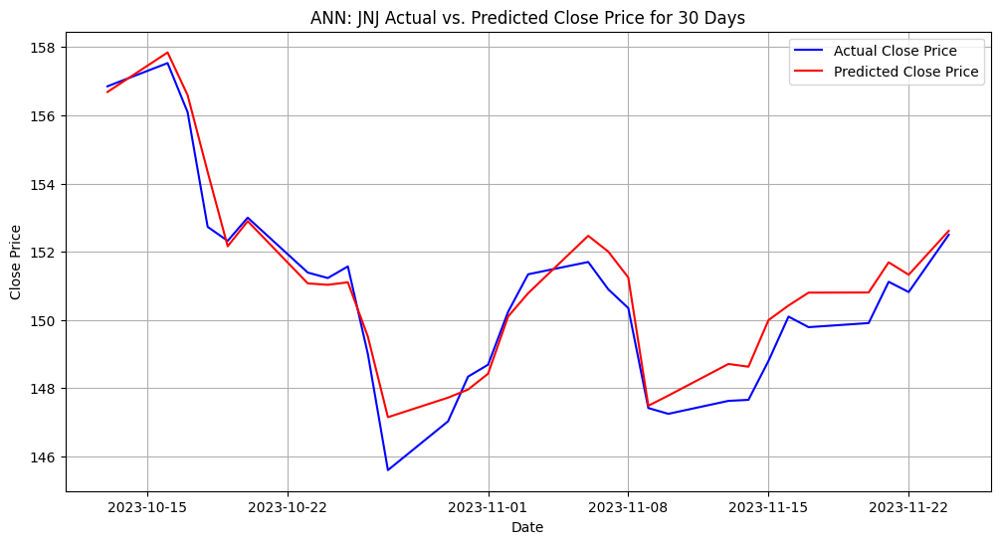

[*********************100%%**********************]  1 of 1 completed


Epoch 1/100
9/9 [==============================] - 1s 3ms/step - loss: 0.3978
Epoch 2/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0798
Epoch 3/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0350
Epoch 4/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0126
Epoch 5/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0087
Epoch 6/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0067
Epoch 7/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0057
Epoch 8/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0054
Epoch 9/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 10/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0046
Epoch 11/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0044
Epoch 12/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0042
Epoch 13/100
9/9 [==============================] - 0s 4ms/st

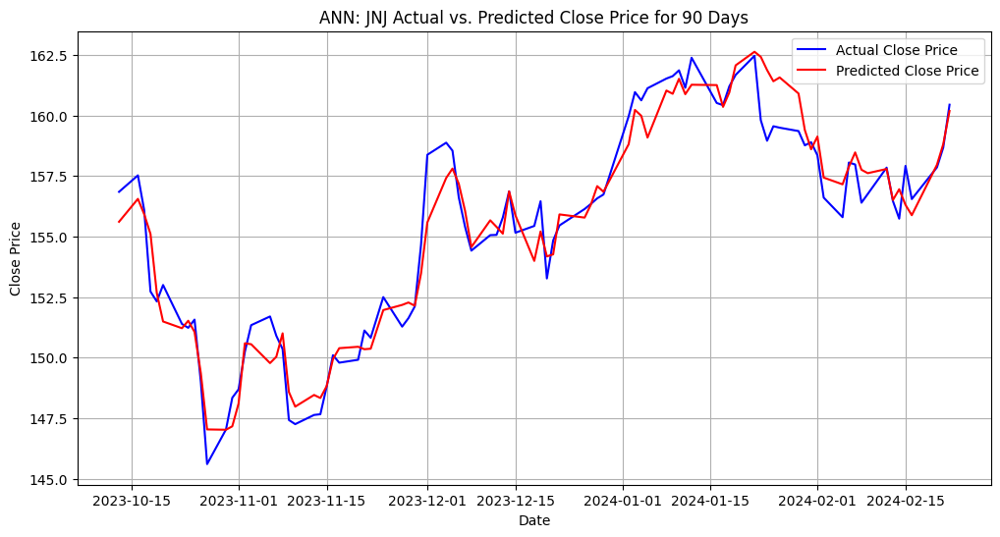

[*********************100%%**********************]  1 of 1 completed

Epoch 1/100


9/9 [==============================] - 1s 3ms/step - loss: 0.3699
Epoch 2/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0524
Epoch 3/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0247
Epoch 4/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0128
Epoch 5/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0094
Epoch 6/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0065
Epoch 7/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0052
Epoch 8/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0046
Epoch 9/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0042
Epoch 10/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 11/100
9/9 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 12/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 13/100
9/9 [==============================] - 0s 3ms/step - loss: 0

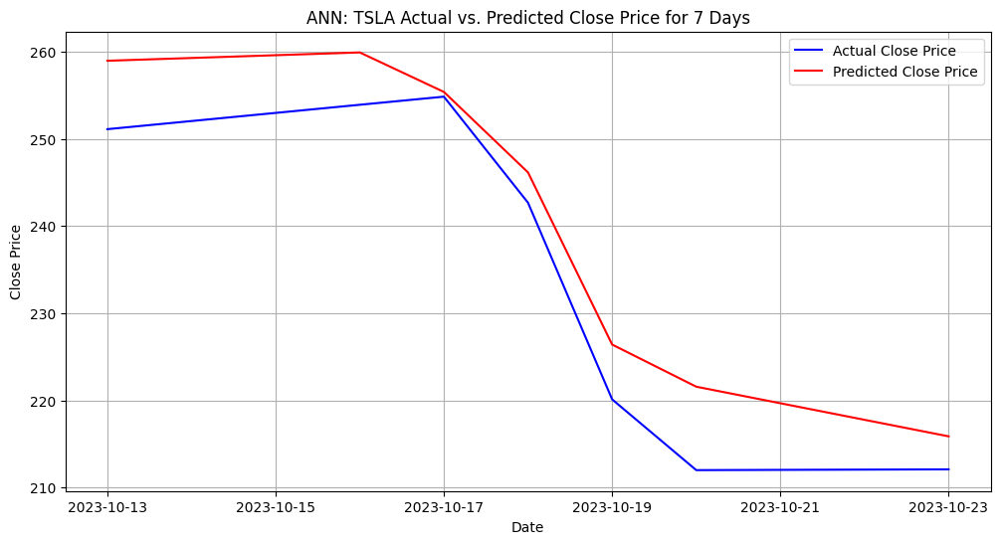

[*********************100%%**********************]  1 of 1 completed


Epoch 1/100
9/9 [==============================] - 1s 4ms/step - loss: 0.3776
Epoch 2/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0718
Epoch 3/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0238
Epoch 4/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0127
Epoch 5/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0084
Epoch 6/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0058
Epoch 7/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0052
Epoch 8/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0047
Epoch 9/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0040
Epoch 10/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0039
Epoch 11/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0036
Epoch 12/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 13/100
9/9 [==============================] - 0s 4ms/st

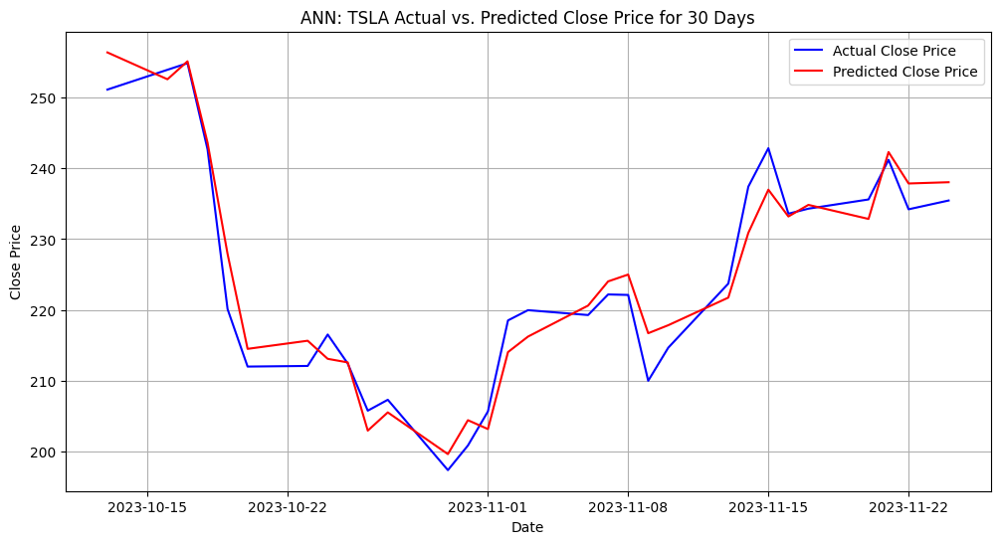

[*********************100%%**********************]  1 of 1 completed

Epoch 1/100


9/9 [==============================] - 1s 3ms/step - loss: 0.0420
Epoch 2/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0155
Epoch 3/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0087
Epoch 4/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0081
Epoch 5/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0055
Epoch 6/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0042
Epoch 7/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 8/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 9/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 10/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 11/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 12/100
9/9 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 13/100
9/9 [==============================] - 0s 4ms/step - loss: 0

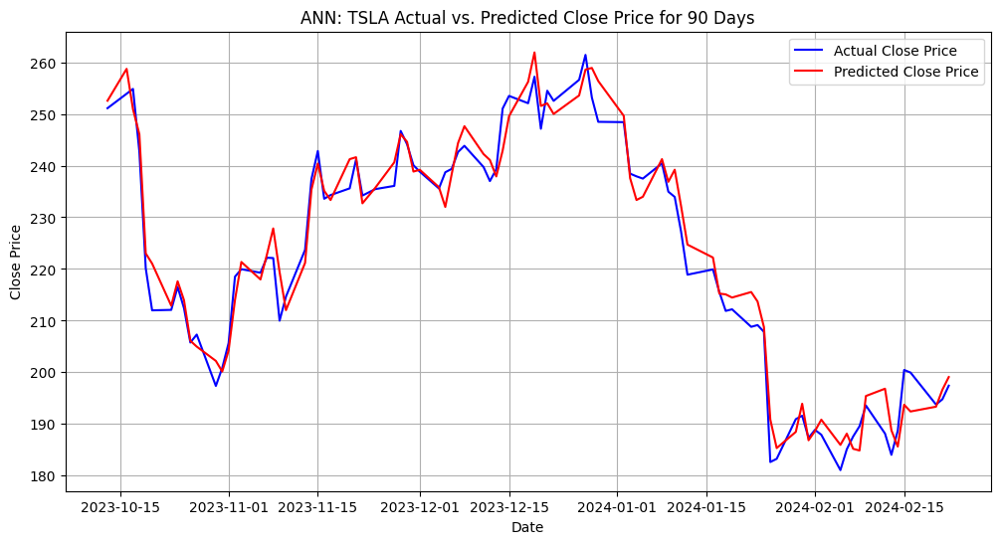

[*********************100%%**********************]  1 of 1 completed


Train RMSE: 0.6302158461696186 Train MSE : 0.3971720127632884 Train MAE : 0.4637712222354515
Validation RMSE: 5.766839040004381, Validation MSE: 5.766839040004381, Validation MAE: 3.666365602099207
Test RMSE: 0.9580628814180774, Test MSE: 0.9178844847511091, Test MAE: 0.8483708234514528


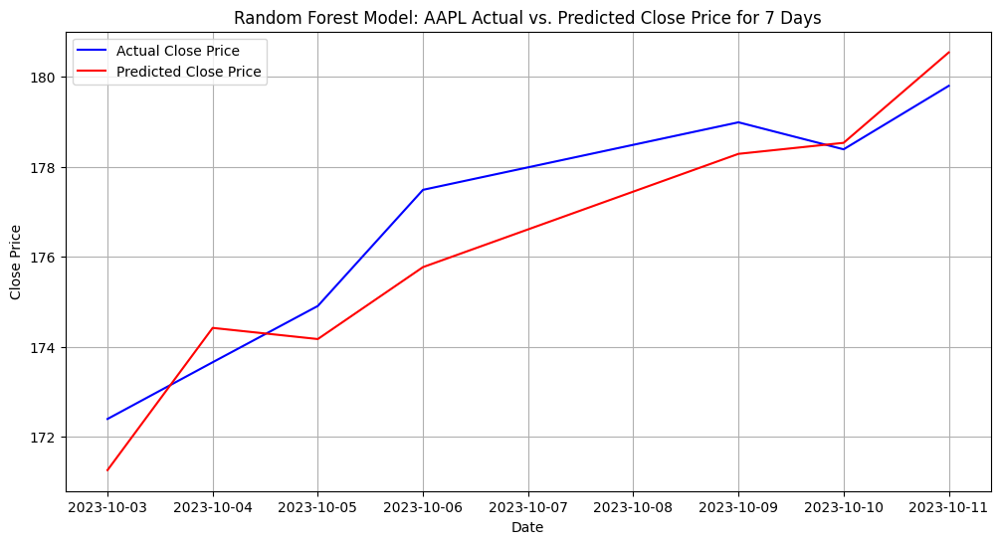

[*********************100%%**********************]  1 of 1 completed

 Random Forest Model: Actual Close Price: [172.3999939  173.66000366 174.91000366 177.49000549 178.99000549
 178.38999939 179.80000305], Predicted Close Price: [171.26332385 174.42300403 174.17504205 175.77296356 178.28924152
 178.53400183 180.54215845]


Train RMSE: 0.6302158461696186 Train MSE : 0.3971720127632884 Train MAE : 0.4637712222354515
Validation RMSE: 5.766839040004381, Validation MSE: 5.766839040004381, Validation MAE: 3.666365602099207
Test RMSE: 1.855842389706755, Test MSE: 3.4441509754324797, Test MAE: 1.4158911234537783


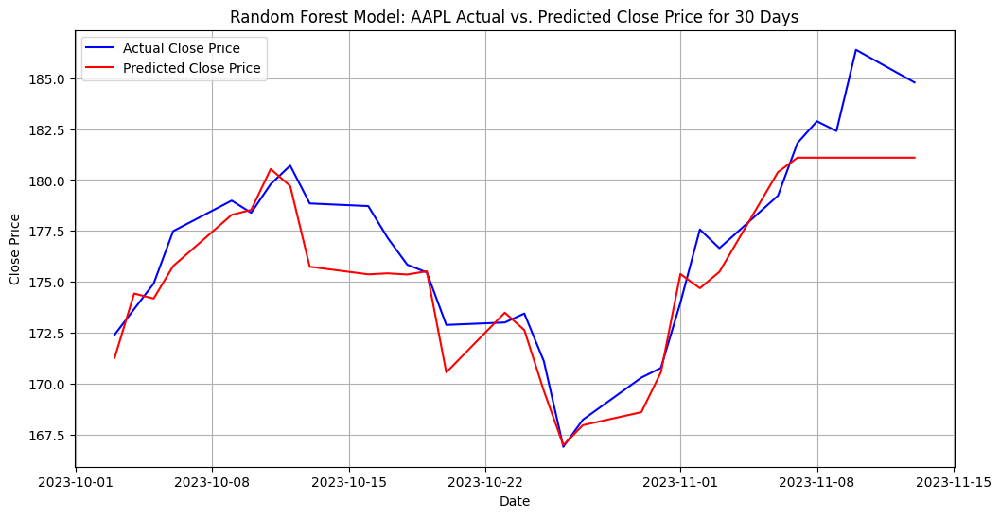

[*********************100%%**********************]  1 of 1 completed

 Random Forest Model: Actual Close Price: [172.3999939  173.66000366 174.91000366 177.49000549 178.99000549
 178.38999939 179.80000305 180.71000671 178.8500061  178.72000122
 177.1499939  175.83999634 175.46000671 172.88000488 173.
 173.44000244 171.1000061  166.88999939 168.22000122 170.28999329
 170.77000427 173.97000122 177.57000732 176.6499939  179.22999573
 181.82000732 182.88999939 182.41000366 186.3999939  184.80000305], Predicted Close Price: [171.26332385 174.42300403 174.17504205 175.77296356 178.28924152
 178.53400183 180.54215845 179.70467914 175.73992395 175.3653623
 175.41480078 175.357401   175.51772015 170.54664282 173.48295966
 172.62715717 169.64307935 166.97028229 167.95300238 168.59304291
 170.54796399 175.38128082 174.68384082 175.48908356 180.38843829
 181.09931702 181.09931702 181.09931702 181.09931702 181.09931702]


Train RMSE: 0.6302158461696186 Train MSE : 0.3971720127632884 Train MAE : 0.4637712222354515
Validation RMSE: 5.766839040004381, Validation MSE: 5.766839040004381, Validation MAE: 3.666365602099207
Test RMSE: 8.361991465340598, Test MSE: 69.92290126642901, Test MAE: 6.662540671793621


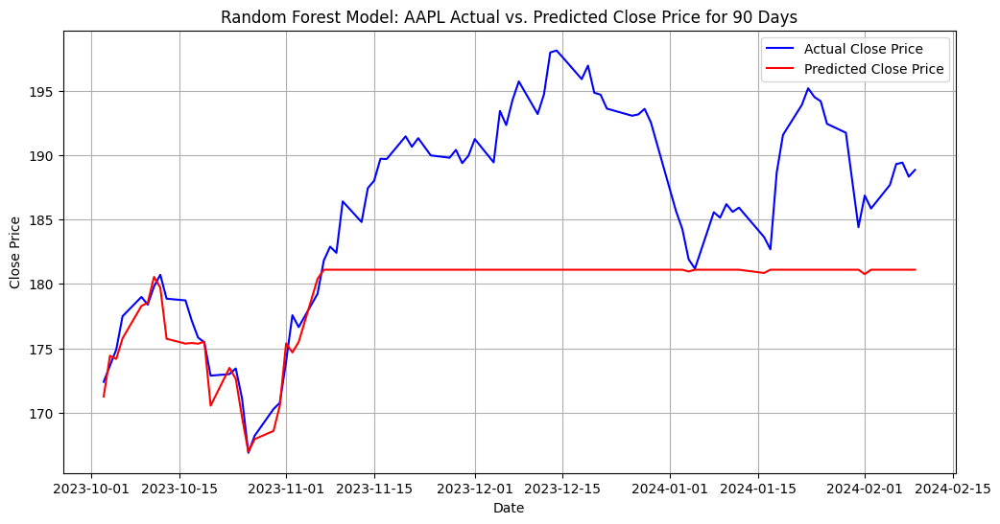

[*********************100%%**********************]  1 of 1 completed

 Random Forest Model: Actual Close Price: [172.3999939  173.66000366 174.91000366 177.49000549 178.99000549
 178.38999939 179.80000305 180.71000671 178.8500061  178.72000122
 177.1499939  175.83999634 175.46000671 172.88000488 173.
 173.44000244 171.1000061  166.88999939 168.22000122 170.28999329
 170.77000427 173.97000122 177.57000732 176.6499939  179.22999573
 181.82000732 182.88999939 182.41000366 186.3999939  184.80000305
 187.44000244 188.00999451 189.71000671 189.69000244 191.44999695
 190.63999939 191.30999756 189.97000122 189.78999329 190.3999939
 189.36999512 189.94999695 191.24000549 189.42999268 193.41999817
 192.32000732 194.27000427 195.71000671 193.17999268 194.71000671
 197.96000671 198.11000061 197.57000732 195.88999939 196.94000244
 194.83000183 194.67999268 193.6000061  193.05000305 193.1499939
 193.58000183 192.52999878 185.63999939 184.25       181.91000366
 181.17999268 185.55999756 185.13999939 186.19000244 185.58999634
 185.91999817 183.63000488 182.67999268 188.

Train RMSE: 2.3155896756177223 Train MSE : 5.361955545827388 Train MAE : 1.6022870715503965
Validation RMSE: 5.1186467963288775, Validation MSE: 5.1186467963288775, Validation MAE: 3.9451752460574316
Test RMSE: 5.961538287901122, Test MSE: 35.539938758111035, Test MAE: 4.35046170479911


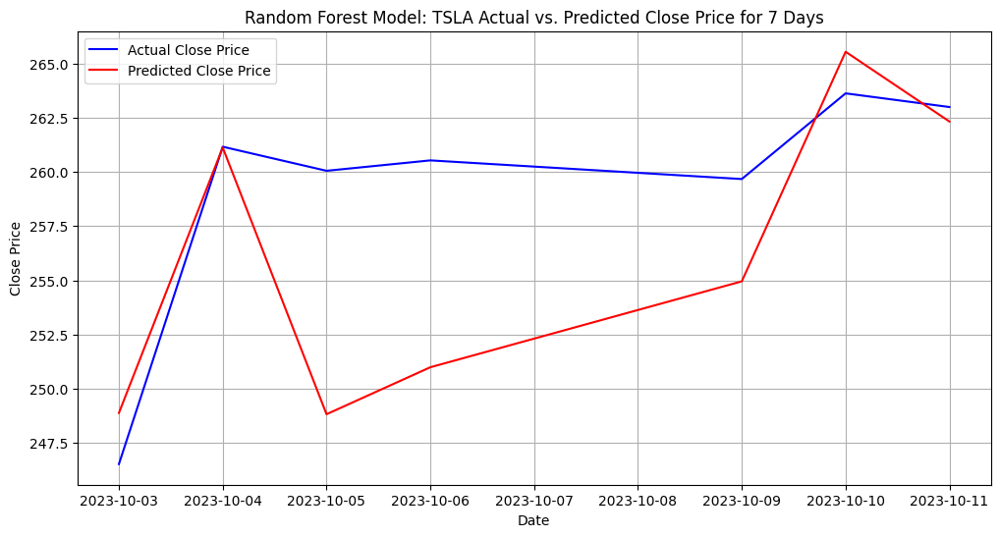

[*********************100%%**********************]  1 of 1 completed

 Random Forest Model: Actual Close Price: [246.52999878 261.16000366 260.04998779 260.52999878 259.67001343
 263.61999512 262.98999023], Predicted Close Price: [248.88619922 261.12256659 248.82832062 250.99417523 254.95350787
 265.53755847 262.32195544]


Train RMSE: 2.3155896756177223 Train MSE : 5.361955545827388 Train MAE : 1.6022870715503965
Validation RMSE: 5.1186467963288775, Validation MSE: 5.1186467963288775, Validation MAE: 3.9451752460574316
Test RMSE: 5.679132769062331, Test MSE: 32.25254900863758, Test MAE: 3.9984687418619784


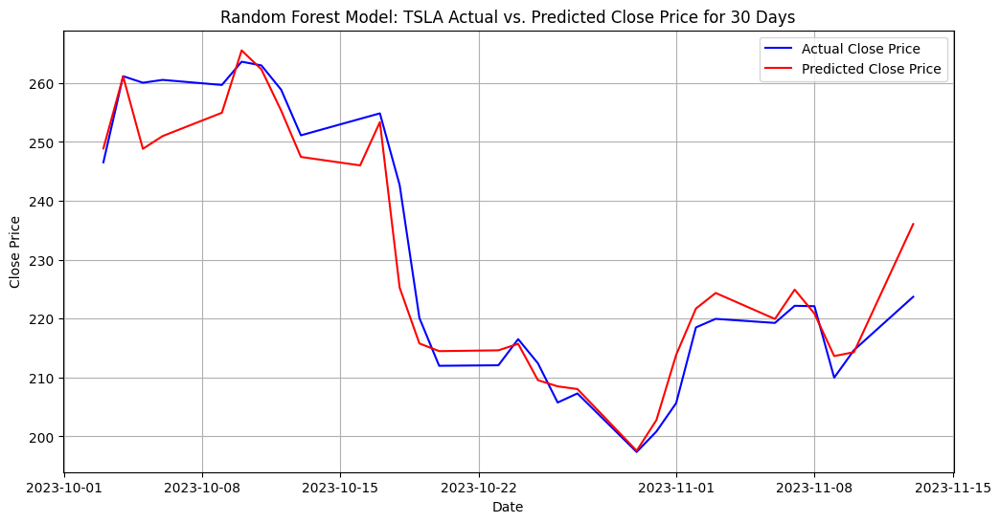

[*********************100%%**********************]  1 of 1 completed

 Random Forest Model: Actual Close Price: [246.52999878 261.16000366 260.04998779 260.52999878 259.67001343
 263.61999512 262.98999023 258.86999512 251.11999512 253.91999817
 254.8500061  242.67999268 220.11000061 211.99000549 212.08000183
 216.52000427 212.41999817 205.75999451 207.30000305 197.36000061
 200.83999634 205.66000366 218.50999451 219.96000671 219.27000427
 222.17999268 222.11000061 209.97999573 214.6499939  223.71000671], Predicted Close Price: [248.88619922 261.12256659 248.82832062 250.99417523 254.95350787
 265.53755847 262.32195544 255.31601715 247.4528382  246.01721112
 253.36886395 225.25629468 215.78463977 214.48201453 214.61894904
 215.72273267 209.55082629 208.50157446 208.04461371 197.56365259
 202.7799743  213.86010834 221.70774829 224.35737347 219.9438559
 224.92166595 220.85604004 213.6429209  214.30700171 236.05886578]


Train RMSE: 2.3155896756177223 Train MSE : 5.361955545827388 Train MAE : 1.6022870715503965
Validation RMSE: 5.1186467963288775, Validation MSE: 5.1186467963288775, Validation MAE: 3.9451752460574316
Test RMSE: 4.88256070505038, Test MSE: 23.839399038502062, Test MAE: 3.5375706149631077


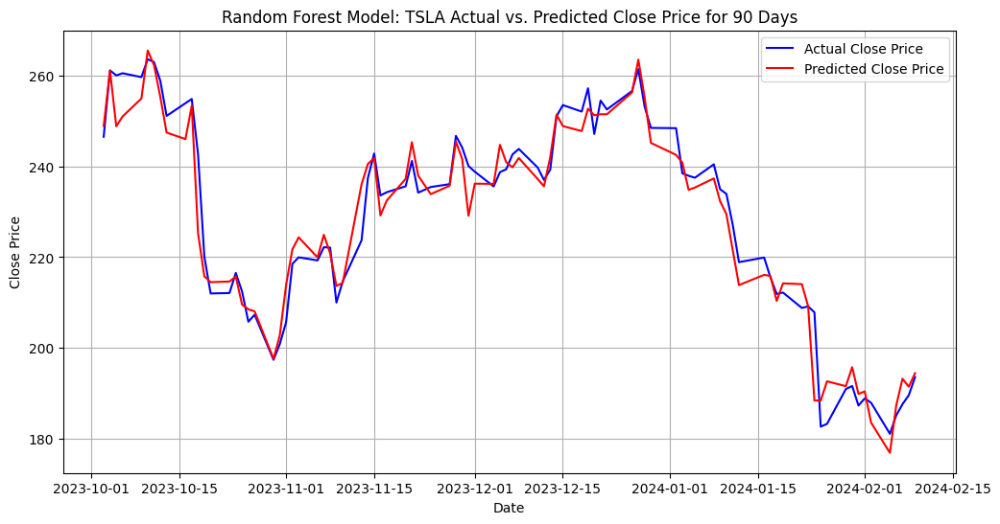

[*********************100%%**********************]  1 of 1 completed

 Random Forest Model: Actual Close Price: [246.52999878 261.16000366 260.04998779 260.52999878 259.67001343
 263.61999512 262.98999023 258.86999512 251.11999512 253.91999817
 254.8500061  242.67999268 220.11000061 211.99000549 212.08000183
 216.52000427 212.41999817 205.75999451 207.30000305 197.36000061
 200.83999634 205.66000366 218.50999451 219.96000671 219.27000427
 222.17999268 222.11000061 209.97999573 214.6499939  223.71000671
 237.41000366 242.83999634 233.58999634 234.30000305 235.6000061
 241.19999695 234.21000671 235.44999695 236.08000183 246.72000122
 244.13999939 240.08000183 238.83000183 235.58000183 238.72000122
 239.36999512 242.63999939 243.83999634 239.74000549 237.00999451
 239.28999329 251.05000305 253.5        252.08000183 257.22000122
 247.13999939 254.5        252.53999329 256.60998535 261.44000244
 253.17999268 248.47999573 248.41999817 238.44999695 237.92999268
 237.49000549 240.44999695 234.96000671 233.94000244 227.22000122
 218.88999939 219.91000366 215.5500

Train RMSE: 0.3840890413417516 Train MSE : 0.14752439167882578 Train MAE : 0.2718657620926981
Validation RMSE: 0.8684430399004667, Validation MSE: 0.8684430399004667, Validation MAE: 0.5944025001210611
Test RMSE: 0.5769201331135353, Test MSE: 0.33283683999173924, Test MAE: 0.38172639683314663


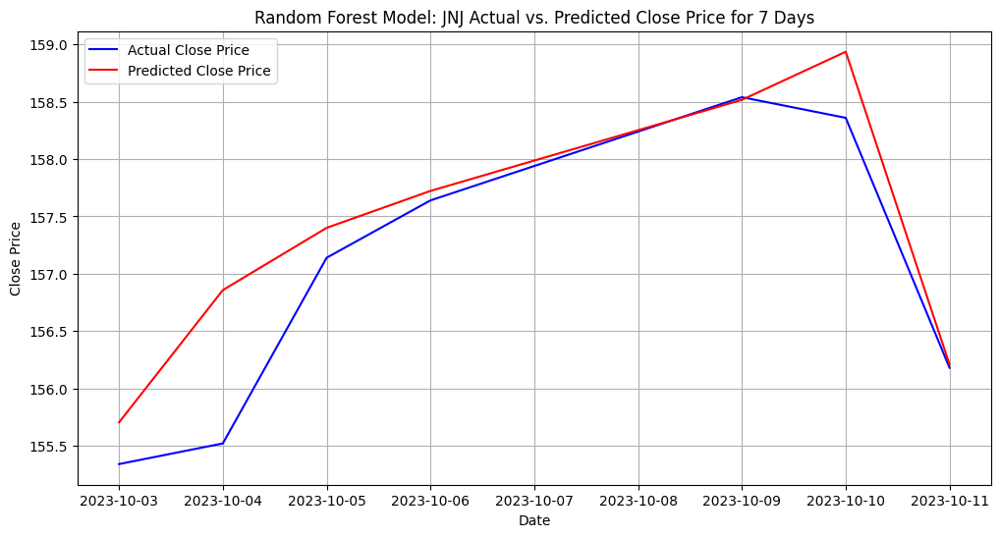

[*********************100%%**********************]  1 of 1 completed

 Random Forest Model: Actual Close Price: [155.33999634 155.52000427 157.13999939 157.63999939 158.53999329
 158.36000061 156.17999268], Predicted Close Price: [155.70371985 156.85767944 157.40048126 157.72256116 158.51695868
 158.93636206 156.20823907]


Train RMSE: 0.3840890413417516 Train MSE : 0.14752439167882578 Train MAE : 0.2718657620926981
Validation RMSE: 0.8684430399004667, Validation MSE: 0.8684430399004667, Validation MAE: 0.5944025001210611
Test RMSE: 2.0522981593566216, Test MSE: 4.211927734898577, Test MAE: 1.3831912312825552


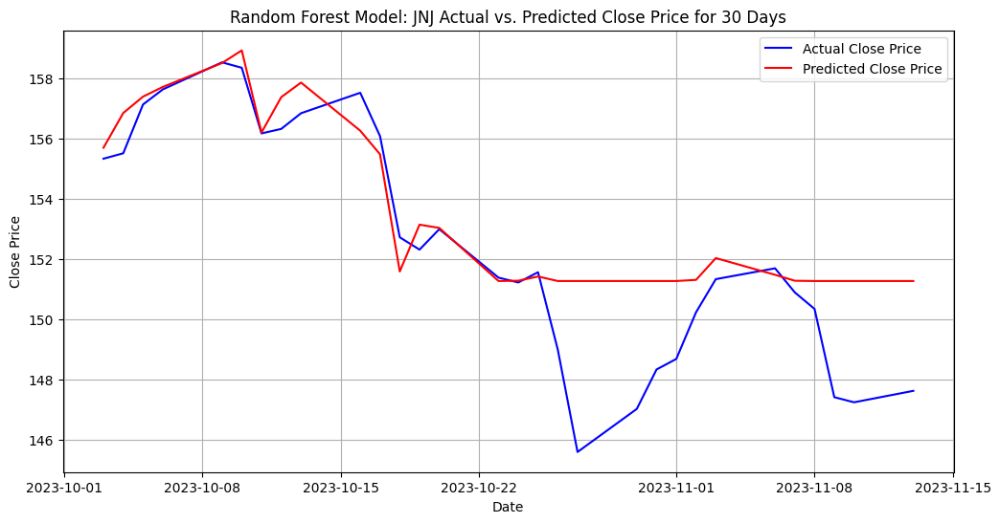

[*********************100%%**********************]  1 of 1 completed

 Random Forest Model: Actual Close Price: [155.33999634 155.52000427 157.13999939 157.63999939 158.53999329
 158.36000061 156.17999268 156.33000183 156.8500061  157.52999878
 156.08999634 152.72999573 152.32000732 153.         151.38999939
 151.22999573 151.57000732 149.         145.6000061  147.02999878
 148.33999634 148.69000244 150.24000549 151.33999634 151.69999695
 150.8999939  150.3500061  147.41999817 147.25       147.63000488], Predicted Close Price: [155.70371985 156.85767944 157.40048126 157.72256116 158.51695868
 158.93636206 156.20823907 157.38463849 157.86860156 156.26903979
 155.48612128 151.5942052  153.14951923 153.04116272 151.27772406
 151.2878042  151.42796466 151.27772406 151.27772406 151.27772406
 151.27772406 151.27772406 151.31580432 152.03908588 151.48408502
 151.28668427 151.27772406 151.27772406 151.27772406 151.27772406]


Train RMSE: 0.3840890413417516 Train MSE : 0.14752439167882578 Train MAE : 0.2718657620926981
Validation RMSE: 0.8684430399004667, Validation MSE: 0.8684430399004667, Validation MAE: 0.5944025001210611
Test RMSE: 1.4186580647937987, Test MSE: 2.012590704804486, Test MAE: 0.8861879530164948


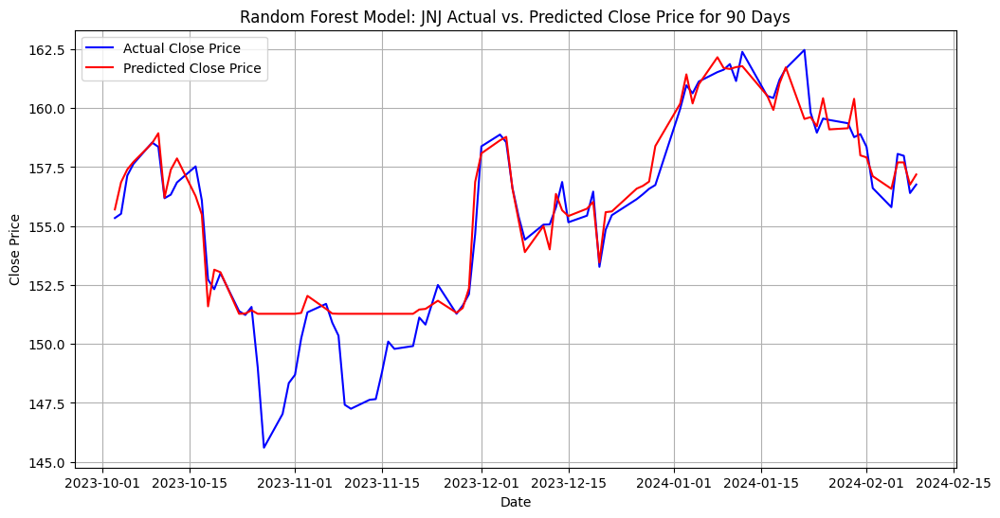

[*********************100%%**********************]  1 of 1 completed

 Random Forest Model: Actual Close Price: [155.33999634 155.52000427 157.13999939 157.63999939 158.53999329
 158.36000061 156.17999268 156.33000183 156.8500061  157.52999878
 156.08999634 152.72999573 152.32000732 153.         151.38999939
 151.22999573 151.57000732 149.         145.6000061  147.02999878
 148.33999634 148.69000244 150.24000549 151.33999634 151.69999695
 150.8999939  150.3500061  147.41999817 147.25       147.63000488
 147.66000366 148.80000305 150.1000061  149.78999329 149.91000366
 151.11999512 150.82000732 152.5        151.27999878 151.63000488
 152.11000061 154.66000366 158.38000488 158.88000488 158.55000305
 156.61999512 155.3999939  154.41999817 155.05999756 155.07000732
 155.78999329 156.86999512 155.16000366 155.44000244 156.46000671
 153.27000427 154.83999634 155.46000671 156.13999939 156.3500061
 156.58000183 156.74000549 159.97000122 160.97000122 160.63000488
 161.13000488 161.52999878 161.63000488 161.86999512 161.1499939
 162.38999939 160.52000427 160.42999

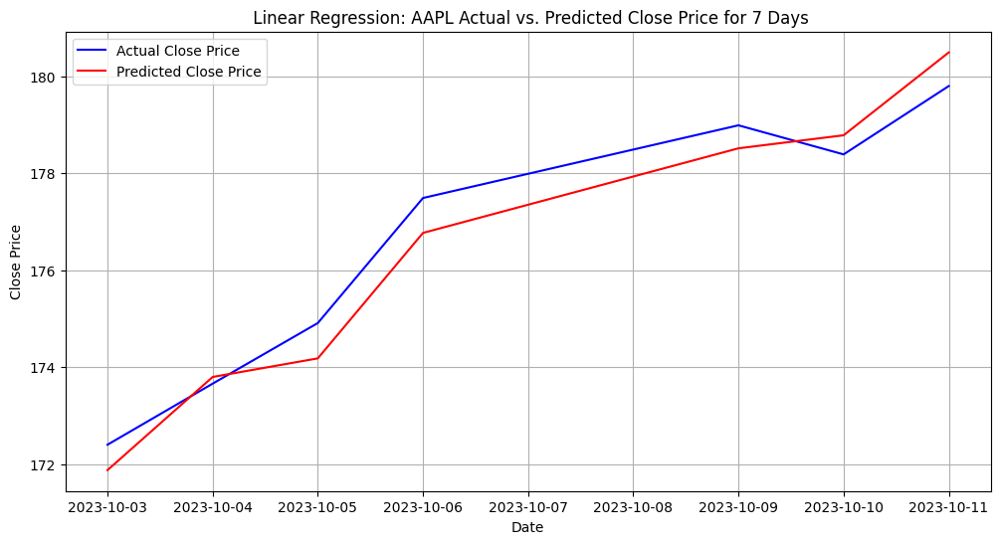

[*********************100%%**********************]  1 of 1 completed

 Linear Regression Model: Actual Close Price: [172.3999939  173.66000366 174.91000366 177.49000549 178.99000549
 178.38999939 179.80000305], Predicted Close Price: [171.87516697 173.79759356 174.18116838 176.7697486  178.51540543
 178.78430974 180.49373977]
Train RMSE: 1.1980833665326522 Train MSE : 1.4354037531622135 Train MAE : 0.8907860615567575
Validation RMSE: 1.039366399717459, Validation MSE: 1.039366399717459, Validation MAE: 0.7677190105041053
Test RMSE: 1.0417382607202248, Test MSE: 1.085218603848399, Test MAE: 0.7383497619180929


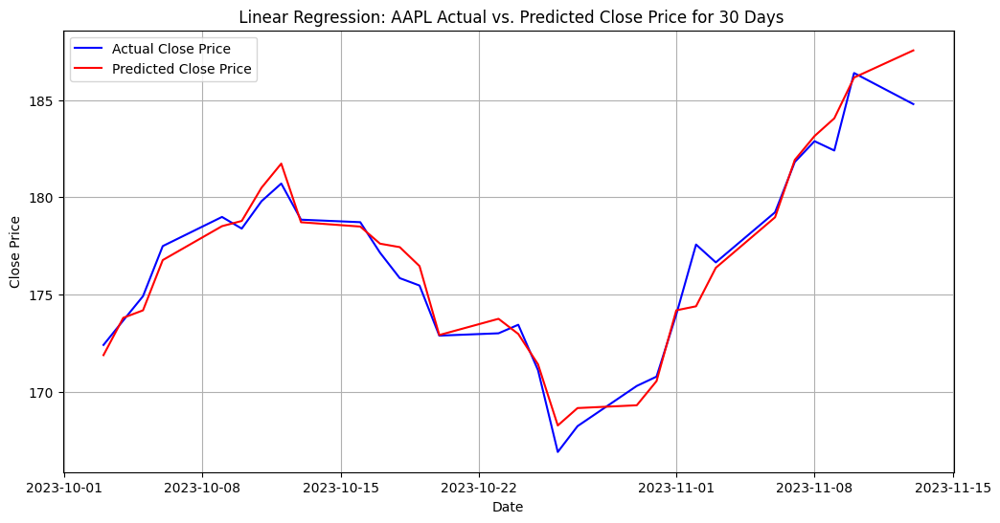

[*********************100%%**********************]  1 of 1 completed

 Linear Regression Model: Actual Close Price: [172.3999939  173.66000366 174.91000366 177.49000549 178.99000549
 178.38999939 179.80000305 180.71000671 178.8500061  178.72000122
 177.1499939  175.83999634 175.46000671 172.88000488 173.
 173.44000244 171.1000061  166.88999939 168.22000122 170.28999329
 170.77000427 173.97000122 177.57000732 176.6499939  179.22999573
 181.82000732 182.88999939 182.41000366 186.3999939  184.80000305], Predicted Close Price: [171.87516697 173.79759356 174.18116838 176.7697486  178.51540543
 178.78430974 180.49373977 181.73594249 178.71789405 178.49490647
 177.61441395 177.43511444 176.46014253 172.91082244 173.74629784
 172.96637186 171.4019065  168.25519459 169.15123193 169.29445385
 170.53885439 174.18331115 174.39049985 176.37240499 178.97198102
 181.92754624 183.15604109 184.06745751 186.16526538 187.56357762]
Train RMSE: 1.1980833665326522 Train MSE : 1.4354037531622135 Train MAE : 0.8907860615567575
Validation RMSE: 1.039366399717459, Validation MSE:

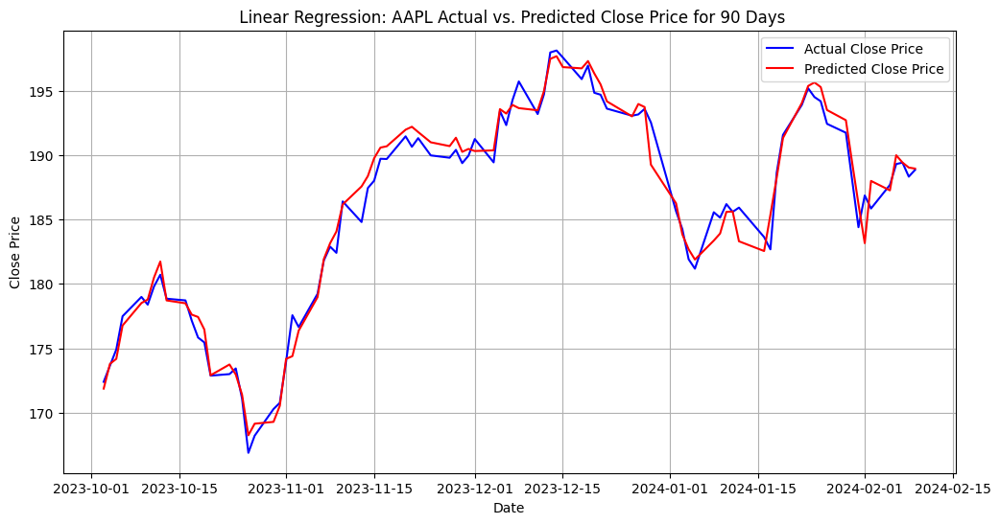

[*********************100%%**********************]  1 of 1 completed

 Linear Regression Model: Actual Close Price: [172.3999939  173.66000366 174.91000366 177.49000549 178.99000549
 178.38999939 179.80000305 180.71000671 178.8500061  178.72000122
 177.1499939  175.83999634 175.46000671 172.88000488 173.
 173.44000244 171.1000061  166.88999939 168.22000122 170.28999329
 170.77000427 173.97000122 177.57000732 176.6499939  179.22999573
 181.82000732 182.88999939 182.41000366 186.3999939  184.80000305
 187.44000244 188.00999451 189.71000671 189.69000244 191.44999695
 190.63999939 191.30999756 189.97000122 189.78999329 190.3999939
 189.36999512 189.94999695 191.24000549 189.42999268 193.41999817
 192.32000732 194.27000427 195.71000671 193.17999268 194.71000671
 197.96000671 198.11000061 197.57000732 195.88999939 196.94000244
 194.83000183 194.67999268 193.6000061  193.05000305 193.1499939
 193.58000183 192.52999878 185.63999939 184.25       181.91000366
 181.17999268 185.55999756 185.13999939 186.19000244 185.58999634
 185.91999817 183.63000488 182.67999268 

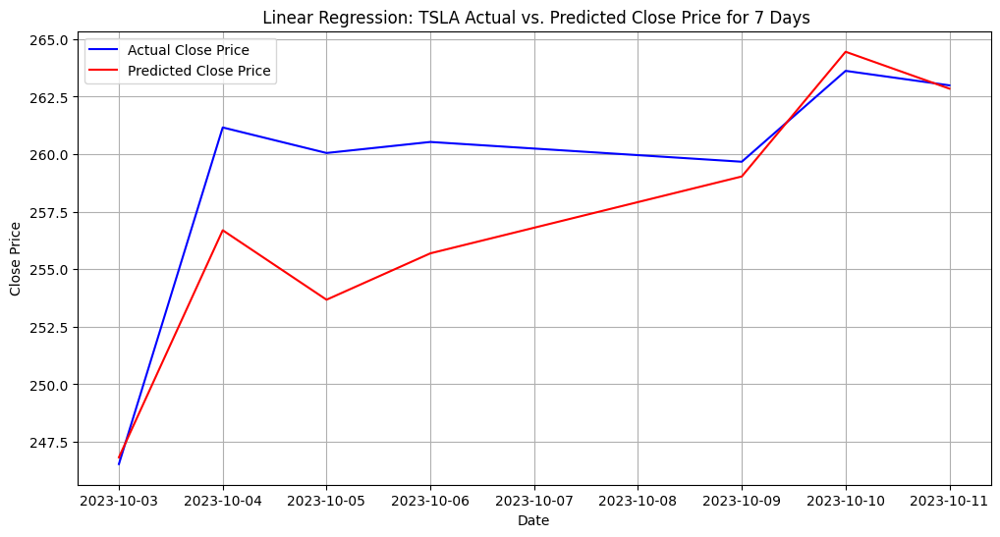

[*********************100%%**********************]  1 of 1 completed

 Linear Regression Model: Actual Close Price: [246.52999878 261.16000366 260.04998779 260.52999878 259.67001343
 263.61999512 262.98999023], Predicted Close Price: [246.82297751 256.69214726 253.6735645  255.68899729 259.03009565
 264.44990321 262.84653424]
Train RMSE: 4.114879841598202 Train MSE : 16.932236110791244 Train MAE : 2.95207796516082
Validation RMSE: 3.178424810017559, Validation MSE: 3.178424810017559, Validation MAE: 2.3280434537109134
Test RMSE: 3.015875643992739, Test MSE: 9.095505900028618, Test MAE: 2.2769826752796596


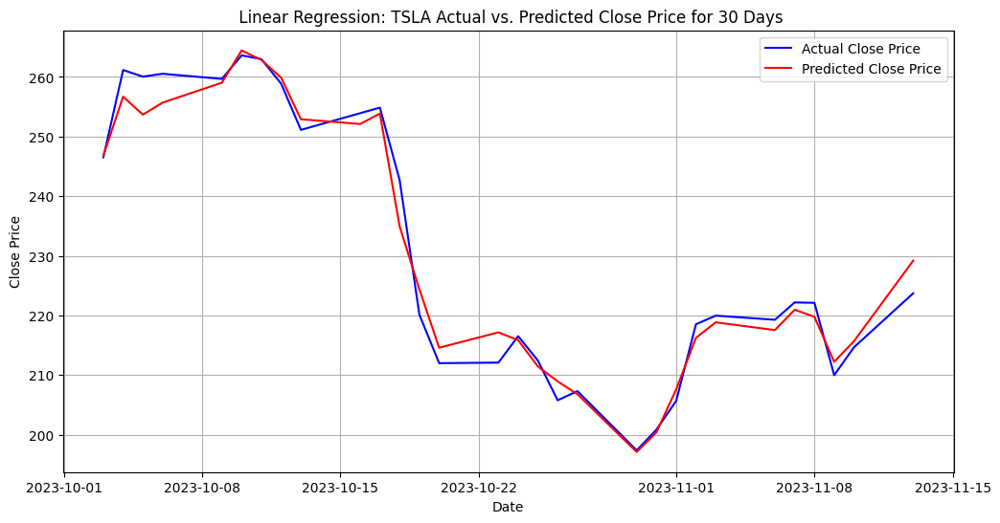

[*********************100%%**********************]  1 of 1 completed

 Linear Regression Model: Actual Close Price: [246.52999878 261.16000366 260.04998779 260.52999878 259.67001343
 263.61999512 262.98999023 258.86999512 251.11999512 253.91999817
 254.8500061  242.67999268 220.11000061 211.99000549 212.08000183
 216.52000427 212.41999817 205.75999451 207.30000305 197.36000061
 200.83999634 205.66000366 218.50999451 219.96000671 219.27000427
 222.17999268 222.11000061 209.97999573 214.6499939  223.71000671], Predicted Close Price: [246.82297751 256.69214726 253.6735645  255.68899729 259.03009565
 264.44990321 262.84653424 259.87683119 252.90545182 252.10501514
 253.85718478 234.92099655 224.36252466 214.57935923 217.15712421
 215.85217898 211.42793732 208.93922936 206.78814147 197.09269851
 200.3953661  207.60143877 216.23484698 218.84066141 217.53682829
 220.95579249 219.76164278 212.21888135 215.66696808 229.18941512]
Train RMSE: 4.114879841598202 Train MSE : 16.932236110791244 Train MAE : 2.95207796516082
Validation RMSE: 3.178424810017559, Validation

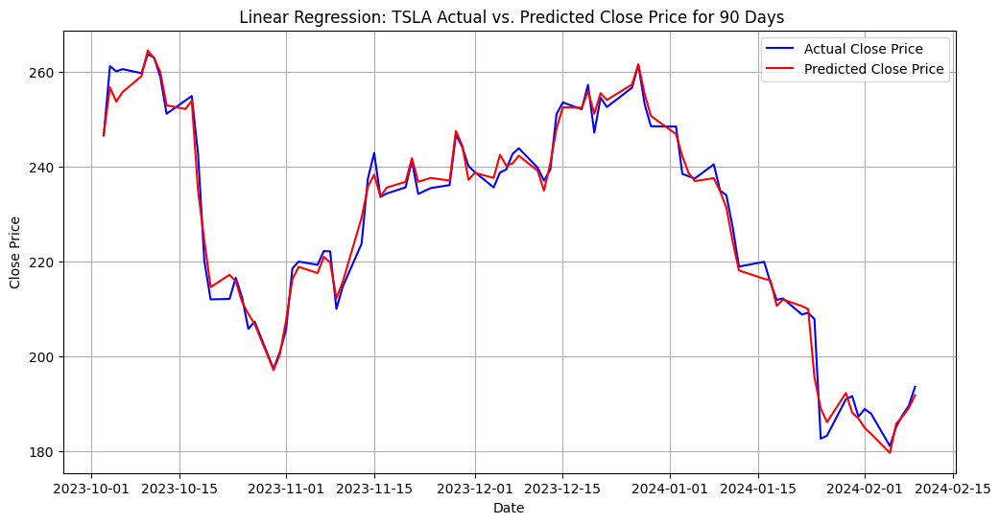

[*********************100%%**********************]  1 of 1 completed

 Linear Regression Model: Actual Close Price: [246.52999878 261.16000366 260.04998779 260.52999878 259.67001343
 263.61999512 262.98999023 258.86999512 251.11999512 253.91999817
 254.8500061  242.67999268 220.11000061 211.99000549 212.08000183
 216.52000427 212.41999817 205.75999451 207.30000305 197.36000061
 200.83999634 205.66000366 218.50999451 219.96000671 219.27000427
 222.17999268 222.11000061 209.97999573 214.6499939  223.71000671
 237.41000366 242.83999634 233.58999634 234.30000305 235.6000061
 241.19999695 234.21000671 235.44999695 236.08000183 246.72000122
 244.13999939 240.08000183 238.83000183 235.58000183 238.72000122
 239.36999512 242.63999939 243.83999634 239.74000549 237.00999451
 239.28999329 251.05000305 253.5        252.08000183 257.22000122
 247.13999939 254.5        252.53999329 256.60998535 261.44000244
 253.17999268 248.47999573 248.41999817 238.44999695 237.92999268
 237.49000549 240.44999695 234.96000671 233.94000244 227.22000122
 218.88999939 219.91000366 215.

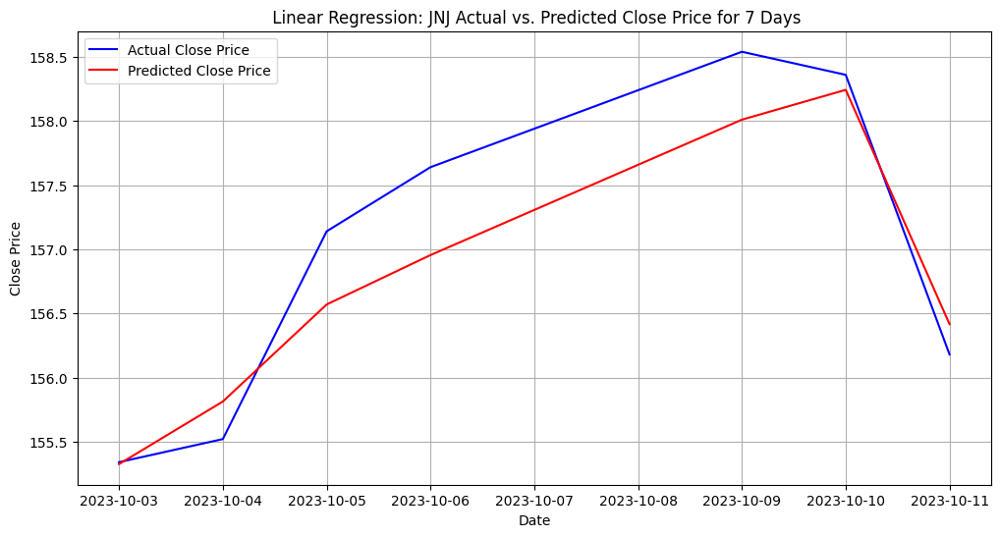

[*********************100%%**********************]  1 of 1 completed

 Linear Regression Model: Actual Close Price: [155.33999634 155.52000427 157.13999939 157.63999939 158.53999329
 158.36000061 156.17999268], Predicted Close Price: [155.32503668 155.812779   156.56957746 156.95472262 158.01049983
 158.24303708 156.41630463]
Train RMSE: 0.7587736872108571 Train MSE : 0.5757375084035598 Train MAE : 0.5679051110758113
Validation RMSE: 0.705198965131976, Validation MSE: 0.705198965131976, Validation MAE: 0.5056227904723052
Test RMSE: 0.5004627190574379, Test MSE: 0.25046293316636403, Test MAE: 0.37646193842302866


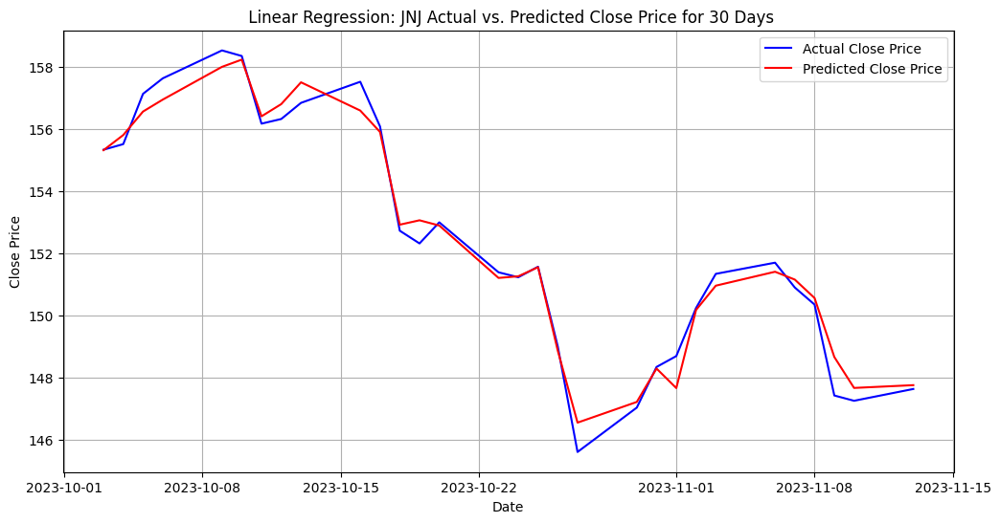

[*********************100%%**********************]  1 of 1 completed

 Linear Regression Model: Actual Close Price: [155.33999634 155.52000427 157.13999939 157.63999939 158.53999329
 158.36000061 156.17999268 156.33000183 156.8500061  157.52999878
 156.08999634 152.72999573 152.32000732 153.         151.38999939
 151.22999573 151.57000732 149.         145.6000061  147.02999878
 148.33999634 148.69000244 150.24000549 151.33999634 151.69999695
 150.8999939  150.3500061  147.41999817 147.25       147.63000488], Predicted Close Price: [155.32503668 155.812779   156.56957746 156.95472262 158.01049983
 158.24303708 156.41630463 156.81020884 157.51197551 156.601676
 155.91195542 152.92473751 153.06557509 152.8969983  151.20872818
 151.26095205 151.55478888 148.86381002 146.54596354 147.21232345
 148.28808619 147.65925104 150.17647508 150.95895674 151.40796774
 151.15528118 150.56120641 148.66086046 147.66391424 147.7533667 ]
Train RMSE: 0.7587736872108571 Train MSE : 0.5757375084035598 Train MAE : 0.5679051110758113
Validation RMSE: 0.705198965131976, Validatio

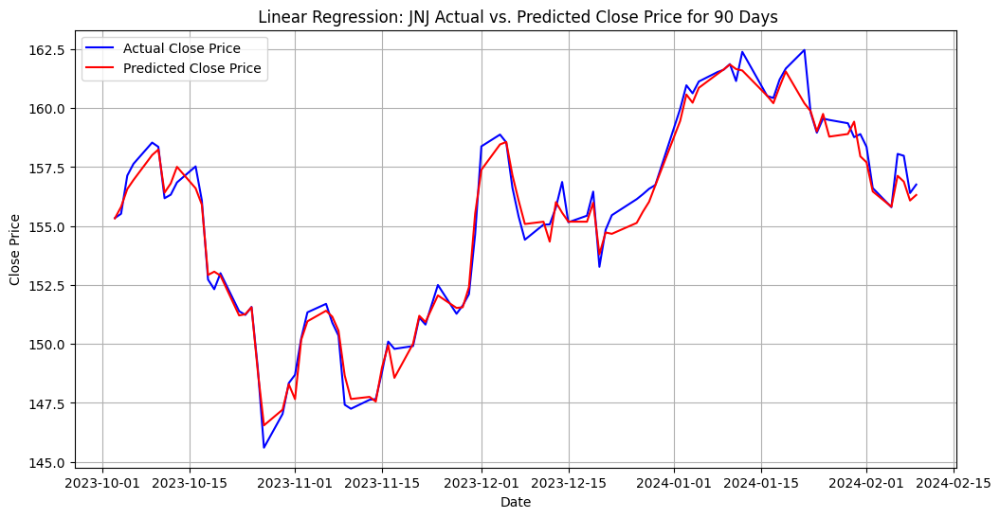

[*********************100%%**********************]  1 of 1 completed

 Linear Regression Model: Actual Close Price: [155.33999634 155.52000427 157.13999939 157.63999939 158.53999329
 158.36000061 156.17999268 156.33000183 156.8500061  157.52999878
 156.08999634 152.72999573 152.32000732 153.         151.38999939
 151.22999573 151.57000732 149.         145.6000061  147.02999878
 148.33999634 148.69000244 150.24000549 151.33999634 151.69999695
 150.8999939  150.3500061  147.41999817 147.25       147.63000488
 147.66000366 148.80000305 150.1000061  149.78999329 149.91000366
 151.11999512 150.82000732 152.5        151.27999878 151.63000488
 152.11000061 154.66000366 158.38000488 158.88000488 158.55000305
 156.61999512 155.3999939  154.41999817 155.05999756 155.07000732
 155.78999329 156.86999512 155.16000366 155.44000244 156.46000671
 153.27000427 154.83999634 155.46000671 156.13999939 156.3500061
 156.58000183 156.74000549 159.97000122 160.97000122 160.63000488
 161.13000488 161.52999878 161.63000488 161.86999512 161.1499939
 162.38999939 160.52000427 160.4

Train RMSE: 1.4666372280204687 Train MSE : 2.151024758615564 Train MAE : 1.0420620169049601
Validation RMSE: 1.9378653932960646, Validation MSE: 1.9378653932960646, Validation MAE: 1.5274318221598875
Test RMSE: 1.8715053068436152, Test MSE: 3.5025321135438143, Test MAE: 1.386388630471369


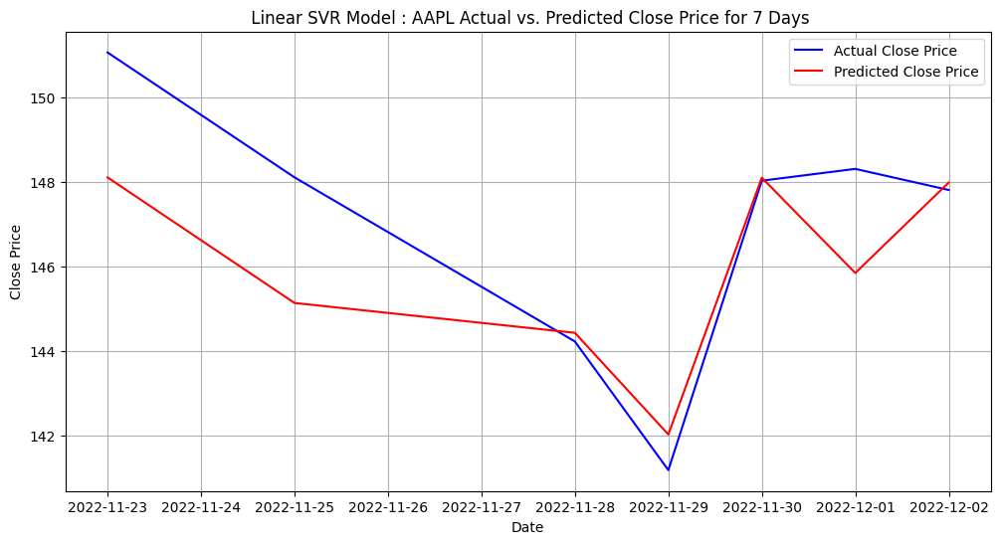

[*********************100%%**********************]  1 of 1 completed

 Linear SVR Model: Actual Close Price: [151.07000732 148.11000061 144.22000122 141.16999817 148.02999878
 148.30999756 147.80999756], Predicted Close Price: [148.10860076 145.13219109 144.42463112 142.01566745 148.10133839
 145.8427887  147.98665424]


Train RMSE: 1.4666372280204687 Train MSE : 2.151024758615564 Train MAE : 1.0420620169049601
Validation RMSE: 1.9378653932960646, Validation MSE: 1.9378653932960646, Validation MAE: 1.5274318221598875
Test RMSE: 1.5971637552411015, Test MSE: 2.5509320610558572, Test MAE: 1.1619855363575595


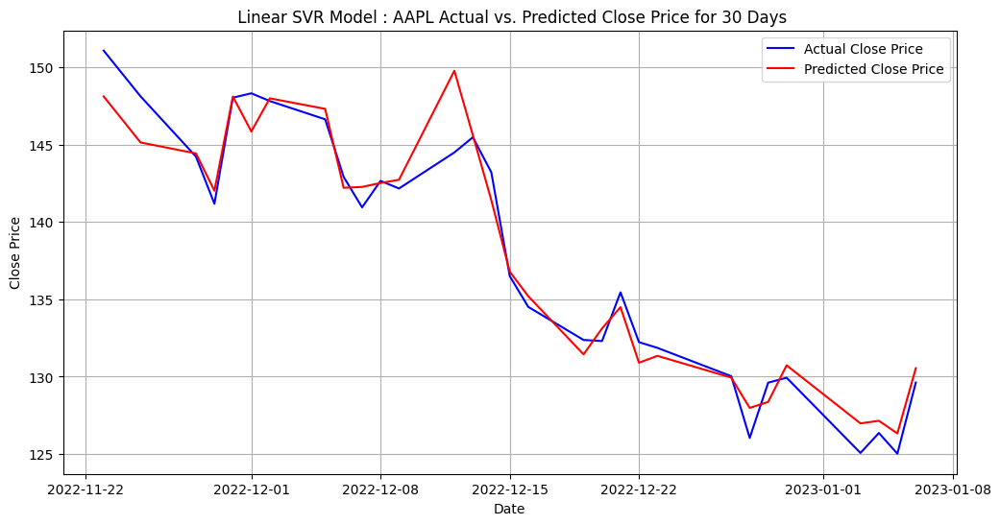

[*********************100%%**********************]  1 of 1 completed

 Linear SVR Model: Actual Close Price: [151.07000732 148.11000061 144.22000122 141.16999817 148.02999878
 148.30999756 147.80999756 146.63000488 142.91000366 140.94000244
 142.6499939  142.16000366 144.49000549 145.47000122 143.21000671
 136.5        134.50999451 132.36999512 132.30000305 135.44999695
 132.22999573 131.86000061 130.02999878 126.04000092 129.61000061
 129.92999268 125.06999969 126.36000061 125.01999664 129.61999512], Predicted Close Price: [148.10860076 145.13219109 144.42463112 142.01566745 148.10133839
 145.8427887  147.98665424 147.30463621 142.20359907 142.25923081
 142.51704868 142.72283719 149.76965158 145.60892991 141.4124388
 136.78632561 135.20311672 131.44004439 133.11668399 134.49155856
 130.90066491 131.34246027 129.93907657 127.98054581 128.36781331
 130.73207562 126.98055768 127.14696304 126.33145847 130.54654645]


Train RMSE: 1.5209907460041476 Train MSE : 2.3134128494302537 Train MAE : 1.1039251198998596
Validation RMSE: 1.3482353749435263, Validation MSE: 1.3482353749435263, Validation MAE: 0.8979778042800037
Test RMSE: 1.4661255343817043, Test MSE: 2.1495240825660384, Test MAE: 0.9863017716520864


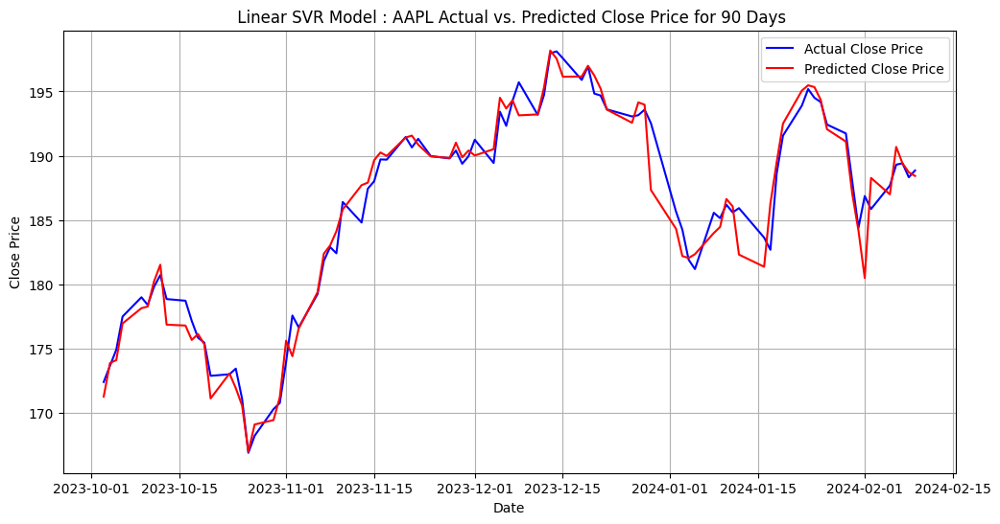

[*********************100%%**********************]  1 of 1 completed

 Linear SVR Model: Actual Close Price: [172.3999939  173.66000366 174.91000366 177.49000549 178.99000549
 178.38999939 179.80000305 180.71000671 178.8500061  178.72000122
 177.1499939  175.83999634 175.46000671 172.88000488 173.
 173.44000244 171.1000061  166.88999939 168.22000122 170.28999329
 170.77000427 173.97000122 177.57000732 176.6499939  179.22999573
 181.82000732 182.88999939 182.41000366 186.3999939  184.80000305
 187.44000244 188.00999451 189.71000671 189.69000244 191.44999695
 190.63999939 191.30999756 189.97000122 189.78999329 190.3999939
 189.36999512 189.94999695 191.24000549 189.42999268 193.41999817
 192.32000732 194.27000427 195.71000671 193.17999268 194.71000671
 197.96000671 198.11000061 197.57000732 195.88999939 196.94000244
 194.83000183 194.67999268 193.6000061  193.05000305 193.1499939
 193.58000183 192.52999878 185.63999939 184.25       181.91000366
 181.17999268 185.55999756 185.13999939 186.19000244 185.58999634
 185.91999817 183.63000488 182.67999268 188.630

Train RMSE: 5.257877479509562 Train MSE : 27.645275589533828 Train MAE : 3.641826979304156
Validation RMSE: 4.309699467884108, Validation MSE: 4.309699467884108, Validation MAE: 3.048277676941182
Test RMSE: 3.4619979967236474, Test MSE: 11.985430129318546, Test MAE: 2.8652499403672738


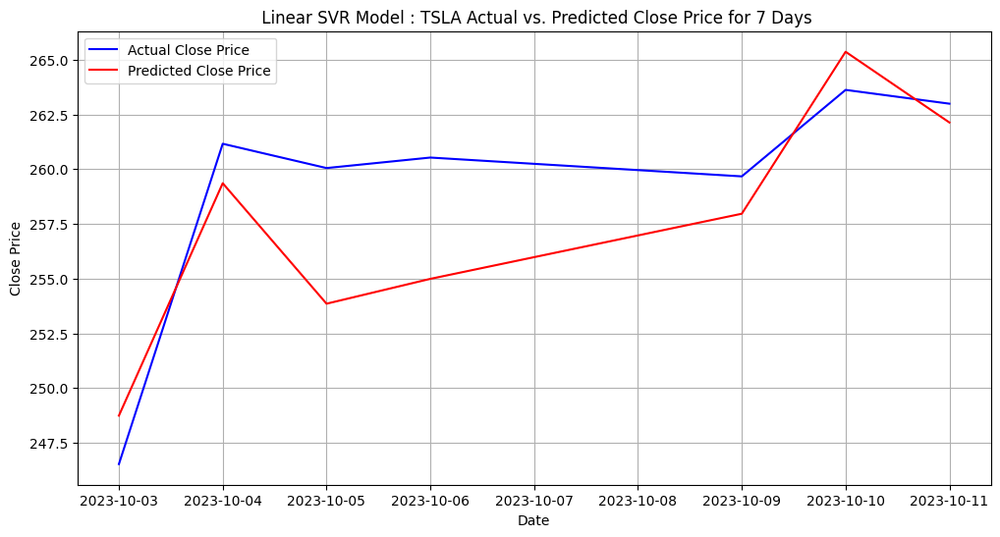

[*********************100%%**********************]  1 of 1 completed

 Linear SVR Model: Actual Close Price: [246.52999878 261.16000366 260.04998779 260.52999878 259.67001343
 263.61999512 262.98999023], Predicted Close Price: [248.74271159 259.35738839 253.85501576 254.98973751 257.96444061
 265.36174301 262.13112274]


Train RMSE: 5.257877479509562 Train MSE : 27.645275589533828 Train MAE : 3.641826979304156
Validation RMSE: 4.309699467884108, Validation MSE: 4.309699467884108, Validation MAE: 3.048277676941182
Test RMSE: 4.726486092490636, Test MSE: 22.3396707825074, Test MAE: 3.256623807146956


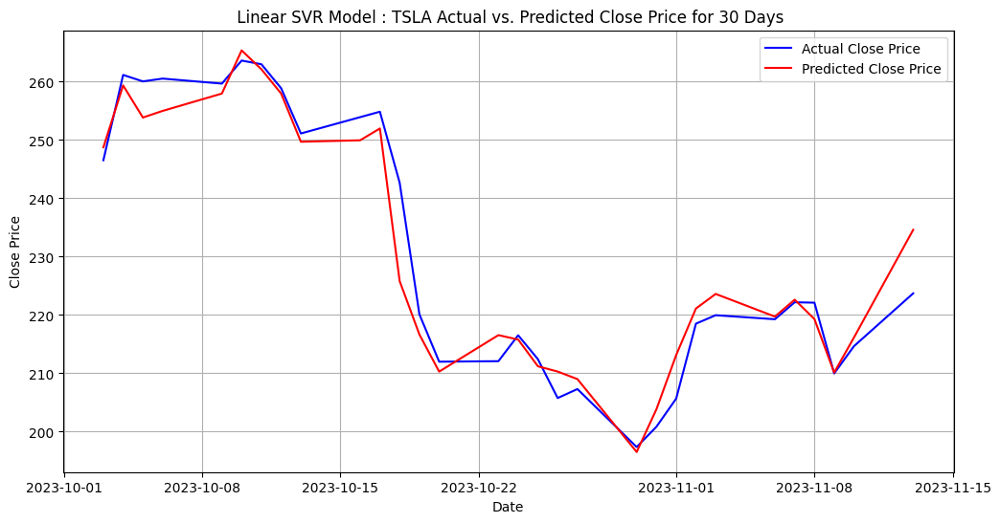

[*********************100%%**********************]  1 of 1 completed

 Linear SVR Model: Actual Close Price: [246.52999878 261.16000366 260.04998779 260.52999878 259.67001343
 263.61999512 262.98999023 258.86999512 251.11999512 253.91999817
 254.8500061  242.67999268 220.11000061 211.99000549 212.08000183
 216.52000427 212.41999817 205.75999451 207.30000305 197.36000061
 200.83999634 205.66000366 218.50999451 219.96000671 219.27000427
 222.17999268 222.11000061 209.97999573 214.6499939  223.71000671], Predicted Close Price: [248.74271159 259.35738839 253.85501576 254.98973751 257.96444061
 265.36174301 262.13112274 257.96414104 249.70291377 249.95043482
 251.97584212 225.81632643 216.65122927 210.29258275 216.54382946
 215.78707303 211.20435119 210.30023775 209.00680257 196.51062486
 203.83227107 213.12491366 221.10768051 223.60856935 219.72413743
 222.62565902 219.29580132 210.12915016 216.13307483 234.60695636]


Train RMSE: 5.257877479509562 Train MSE : 27.645275589533828 Train MAE : 3.641826979304156
Validation RMSE: 4.309699467884108, Validation MSE: 4.309699467884108, Validation MAE: 3.048277676941182
Test RMSE: 3.970676186282521, Test MSE: 15.766269376311104, Test MAE: 2.7036913026933242


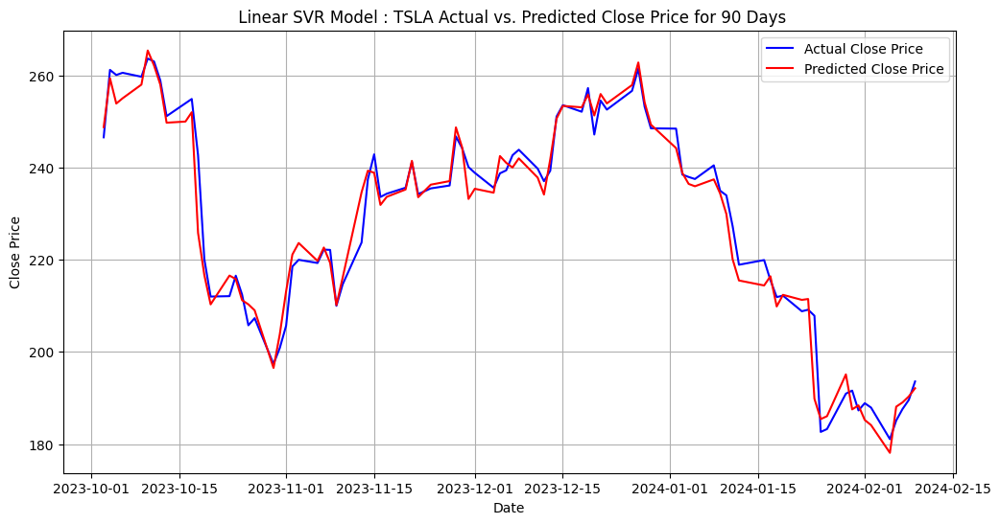

[*********************100%%**********************]  1 of 1 completed

 Linear SVR Model: Actual Close Price: [246.52999878 261.16000366 260.04998779 260.52999878 259.67001343
 263.61999512 262.98999023 258.86999512 251.11999512 253.91999817
 254.8500061  242.67999268 220.11000061 211.99000549 212.08000183
 216.52000427 212.41999817 205.75999451 207.30000305 197.36000061
 200.83999634 205.66000366 218.50999451 219.96000671 219.27000427
 222.17999268 222.11000061 209.97999573 214.6499939  223.71000671
 237.41000366 242.83999634 233.58999634 234.30000305 235.6000061
 241.19999695 234.21000671 235.44999695 236.08000183 246.72000122
 244.13999939 240.08000183 238.83000183 235.58000183 238.72000122
 239.36999512 242.63999939 243.83999634 239.74000549 237.00999451
 239.28999329 251.05000305 253.5        252.08000183 257.22000122
 247.13999939 254.5        252.53999329 256.60998535 261.44000244
 253.17999268 248.47999573 248.41999817 238.44999695 237.92999268
 237.49000549 240.44999695 234.96000671 233.94000244 227.22000122
 218.88999939 219.91000366 215.5500030

Train RMSE: 0.9194877816156555 Train MSE : 0.8454577805404794 Train MAE : 0.6310687813633695
Validation RMSE: 0.8175466090206929, Validation MSE: 0.8175466090206929, Validation MAE: 0.5199924689547069
Test RMSE: 0.38006465365523495, Test MSE: 0.1444491409580737, Test MAE: 0.28855297254491624


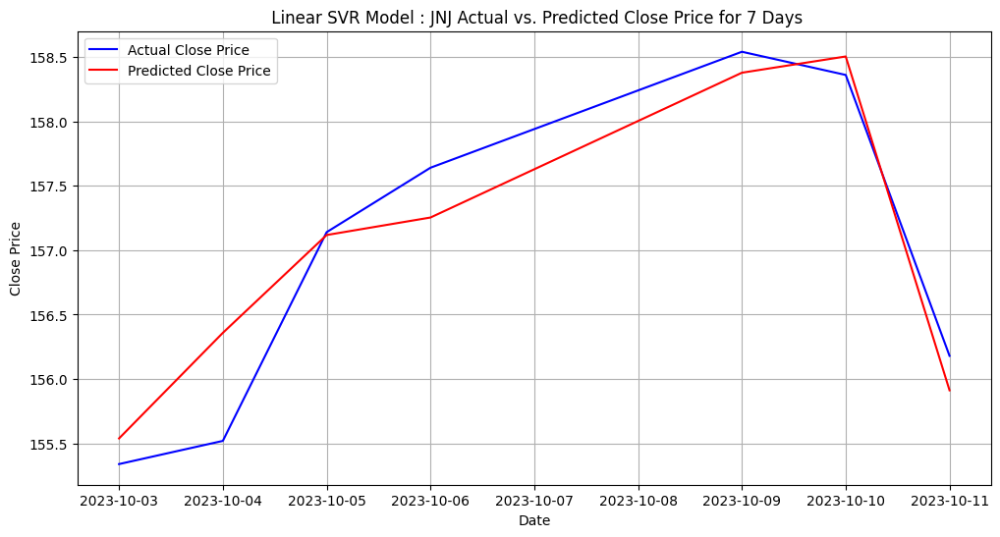

[*********************100%%**********************]  1 of 1 completed

 Linear SVR Model: Actual Close Price: [155.33999634 155.52000427 157.13999939 157.63999939 158.53999329
 158.36000061 156.17999268], Predicted Close Price: [155.53918441 156.3585306  157.11776731 157.25360098 158.3773176
 158.50345249 155.91259433]


Train RMSE: 0.9194877816156555 Train MSE : 0.8454577805404794 Train MAE : 0.6310687813633695
Validation RMSE: 0.8175466090206929, Validation MSE: 0.8175466090206929, Validation MAE: 0.5199924689547069
Test RMSE: 0.5793112010708238, Test MSE: 0.3356014676861205, Test MAE: 0.47274065888747524


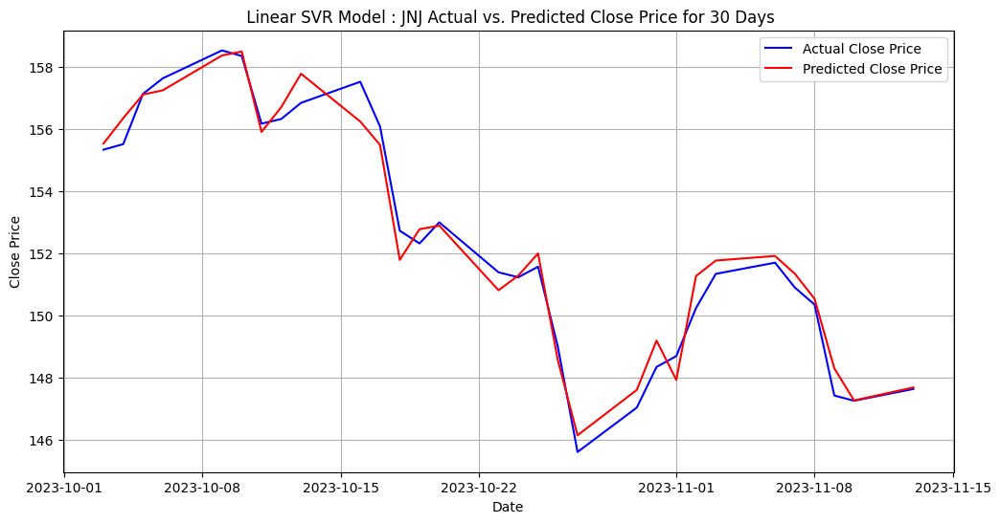

[*********************100%%**********************]  1 of 1 completed

 Linear SVR Model: Actual Close Price: [155.33999634 155.52000427 157.13999939 157.63999939 158.53999329
 158.36000061 156.17999268 156.33000183 156.8500061  157.52999878
 156.08999634 152.72999573 152.32000732 153.         151.38999939
 151.22999573 151.57000732 149.         145.6000061  147.02999878
 148.33999634 148.69000244 150.24000549 151.33999634 151.69999695
 150.8999939  150.3500061  147.41999817 147.25       147.63000488], Predicted Close Price: [155.53918441 156.3585306  157.11776731 157.25360098 158.3773176
 158.50345249 155.91259433 156.71208773 157.78914963 156.24833632
 155.49565995 151.7903712  152.77792153 152.89459111 150.81131088
 151.28512654 151.99611512 148.56369667 146.13735156 147.59957798
 149.19060331 147.9240236  151.27147162 151.76837574 151.91611945
 151.34559941 150.53672551 148.29521557 147.25996653 147.67896015]
Train RMSE: 0.9194877816156555 Train MSE : 0.8454577805404794 Train MAE : 0.6310687813633695
Validation RMSE: 0.8175466090206929, Validation MSE

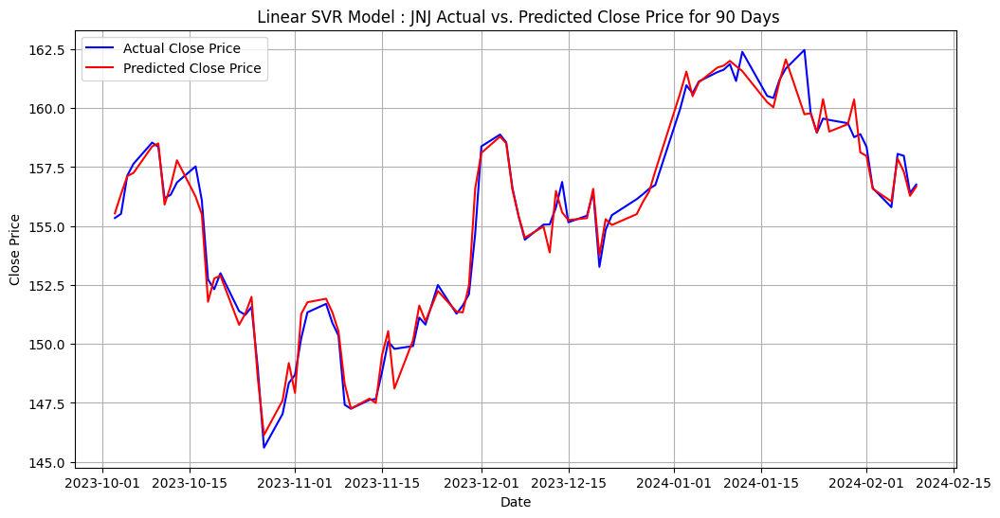

[*********************100%%**********************]  1 of 1 completed

 Linear SVR Model: Actual Close Price: [155.33999634 155.52000427 157.13999939 157.63999939 158.53999329
 158.36000061 156.17999268 156.33000183 156.8500061  157.52999878
 156.08999634 152.72999573 152.32000732 153.         151.38999939
 151.22999573 151.57000732 149.         145.6000061  147.02999878
 148.33999634 148.69000244 150.24000549 151.33999634 151.69999695
 150.8999939  150.3500061  147.41999817 147.25       147.63000488
 147.66000366 148.80000305 150.1000061  149.78999329 149.91000366
 151.11999512 150.82000732 152.5        151.27999878 151.63000488
 152.11000061 154.66000366 158.38000488 158.88000488 158.55000305
 156.61999512 155.3999939  154.41999817 155.05999756 155.07000732
 155.78999329 156.86999512 155.16000366 155.44000244 156.46000671
 153.27000427 154.83999634 155.46000671 156.13999939 156.3500061
 156.58000183 156.74000549 159.97000122 160.97000122 160.63000488
 161.13000488 161.52999878 161.63000488 161.86999512 161.1499939
 162.38999939 160.52000427 160.42999268

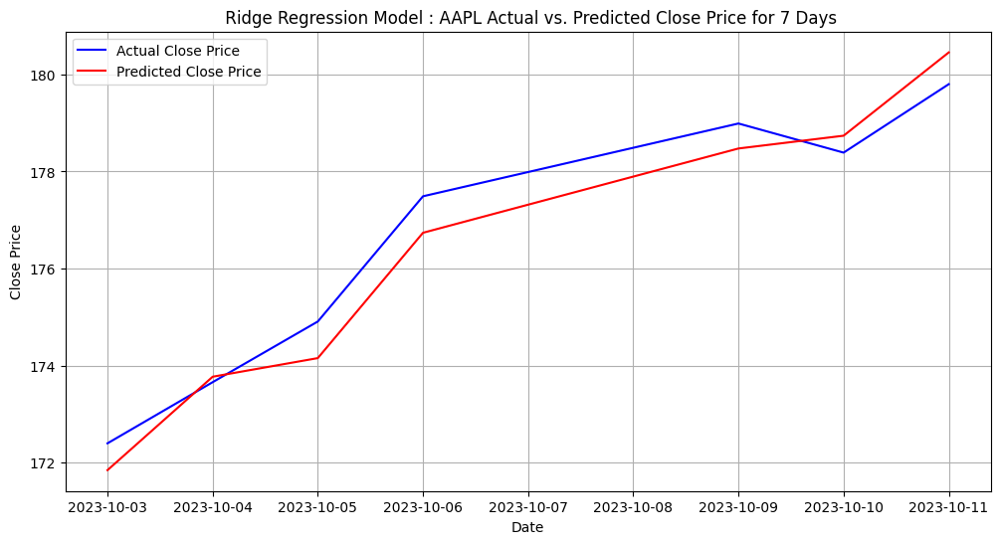

[*********************100%%**********************]  1 of 1 completed

 Ridge Regression Model: Actual Close Price: [172.3999939  173.66000366 174.91000366 177.49000549 178.99000549
 178.38999939 179.80000305], Predicted Close Price: [171.84733859 173.7721133  174.15577565 176.73811087 178.47512839
 178.73841901 180.45434649]
Train RMSE: 1.1983061036780336 Train MSE : 1.4359375181120302 Train MAE : 0.8896510708031707
Validation RMSE: 1.0378964309840382, Validation MSE: 1.0378964309840382, Validation MAE: 0.7661245553218596
Test RMSE: 1.0353302844386516, Test MSE: 1.071908797875819, Test MAE: 0.7344683673785823


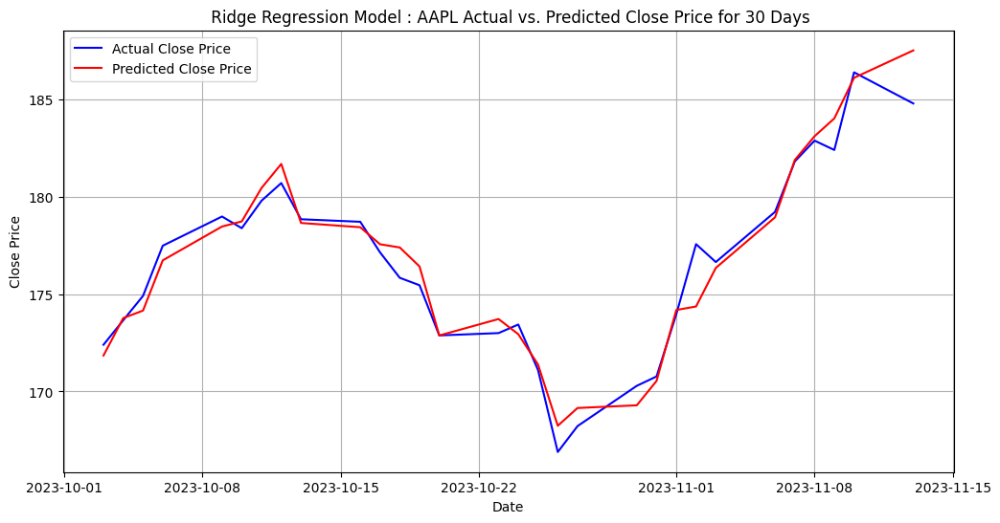

[*********************100%%**********************]  1 of 1 completed

 Ridge Regression Model: Actual Close Price: [172.3999939  173.66000366 174.91000366 177.49000549 178.99000549
 178.38999939 179.80000305 180.71000671 178.8500061  178.72000122
 177.1499939  175.83999634 175.46000671 172.88000488 173.
 173.44000244 171.1000061  166.88999939 168.22000122 170.28999329
 170.77000427 173.97000122 177.57000732 176.6499939  179.22999573
 181.82000732 182.88999939 182.41000366 186.3999939  184.80000305], Predicted Close Price: [171.84733859 173.7721133  174.15577565 176.73811087 178.47512839
 178.73841901 180.45434649 181.69320593 178.65893999 178.43974993
 177.56460581 177.39968584 176.42498769 172.87706431 173.72312168
 172.94370117 171.38343779 168.23768312 169.15123947 169.28841179
 170.54071765 174.18813379 174.36616362 176.34926682 178.94905204
 181.89591035 183.11601514 184.03252483 186.11847058 187.5265317 ]
Train RMSE: 1.1983061036780336 Train MSE : 1.4359375181120302 Train MAE : 0.8896510708031707
Validation RMSE: 1.0378964309840382, Validation MSE:

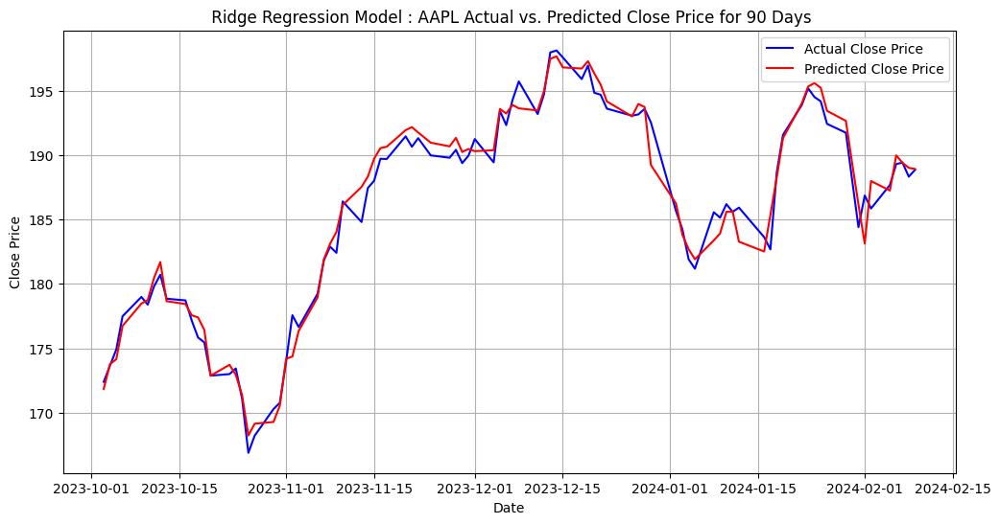

[*********************100%%**********************]  1 of 1 completed

 Ridge Regression Model: Actual Close Price: [172.3999939  173.66000366 174.91000366 177.49000549 178.99000549
 178.38999939 179.80000305 180.71000671 178.8500061  178.72000122
 177.1499939  175.83999634 175.46000671 172.88000488 173.
 173.44000244 171.1000061  166.88999939 168.22000122 170.28999329
 170.77000427 173.97000122 177.57000732 176.6499939  179.22999573
 181.82000732 182.88999939 182.41000366 186.3999939  184.80000305
 187.44000244 188.00999451 189.71000671 189.69000244 191.44999695
 190.63999939 191.30999756 189.97000122 189.78999329 190.3999939
 189.36999512 189.94999695 191.24000549 189.42999268 193.41999817
 192.32000732 194.27000427 195.71000671 193.17999268 194.71000671
 197.96000671 198.11000061 197.57000732 195.88999939 196.94000244
 194.83000183 194.67999268 193.6000061  193.05000305 193.1499939
 193.58000183 192.52999878 185.63999939 184.25       181.91000366
 181.17999268 185.55999756 185.13999939 186.19000244 185.58999634
 185.91999817 183.63000488 182.67999268 1

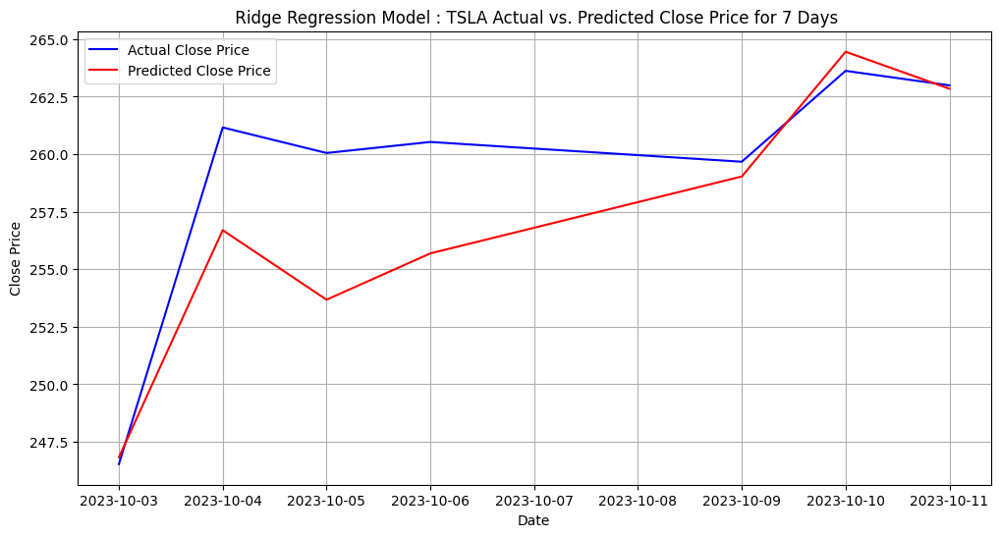

[*********************100%%**********************]  1 of 1 completed

 Ridge Regression Model: Actual Close Price: [246.52999878 261.16000366 260.04998779 260.52999878 259.67001343
 263.61999512 262.98999023], Predicted Close Price: [246.82716372 256.69539254 253.67327122 255.68746585 259.02945247
 264.4499002  262.84488563]
Train RMSE: 4.114883239587621 Train MSE : 16.932264075439114 Train MAE : 2.951791559200334
Validation RMSE: 3.1785664597377403, Validation MSE: 3.1785664597377403, Validation MAE: 2.3281532119696986
Test RMSE: 3.016704030011624, Test MSE: 9.100503204688374, Test MAE: 2.276873315361142


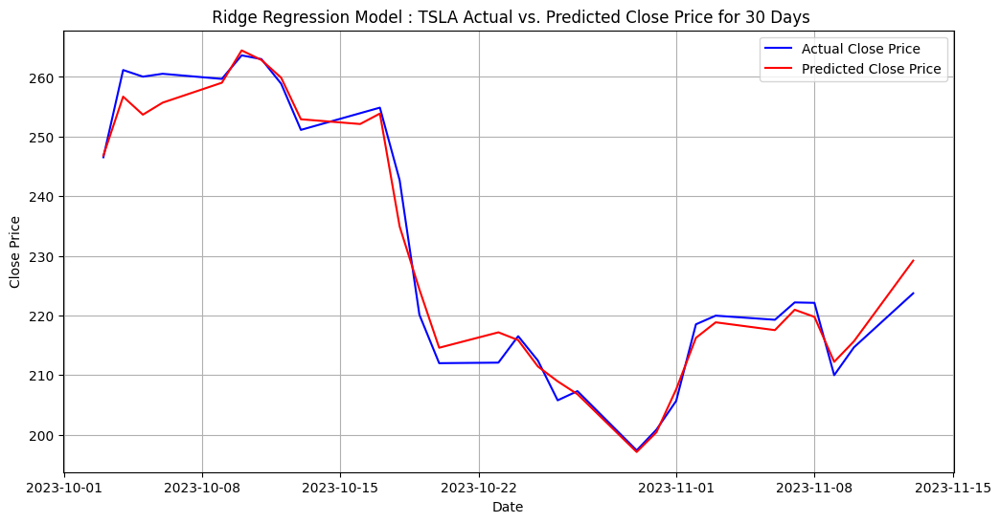

[*********************100%%**********************]  1 of 1 completed

 Ridge Regression Model: Actual Close Price: [246.52999878 261.16000366 260.04998779 260.52999878 259.67001343
 263.61999512 262.98999023 258.86999512 251.11999512 253.91999817
 254.8500061  242.67999268 220.11000061 211.99000549 212.08000183
 216.52000427 212.41999817 205.75999451 207.30000305 197.36000061
 200.83999634 205.66000366 218.50999451 219.96000671 219.27000427
 222.17999268 222.11000061 209.97999573 214.6499939  223.71000671], Predicted Close Price: [246.82716372 256.69539254 253.67327122 255.68746585 259.02945247
 264.4499002  262.84488563 259.87430591 252.90263318 252.10352574
 253.8563817  234.91388768 224.35871384 214.5801353  217.16296689
 215.85800543 211.43272252 208.9447708  206.79351204 197.09521968
 200.39990598 207.60775273 216.23920364 218.84235474 217.53477159
 220.95245497 219.75614467 212.21243318 215.66369642 229.1902799 ]
Train RMSE: 4.114883239587621 Train MSE : 16.932264075439114 Train MAE : 2.951791559200334
Validation RMSE: 3.1785664597377403, Validatio

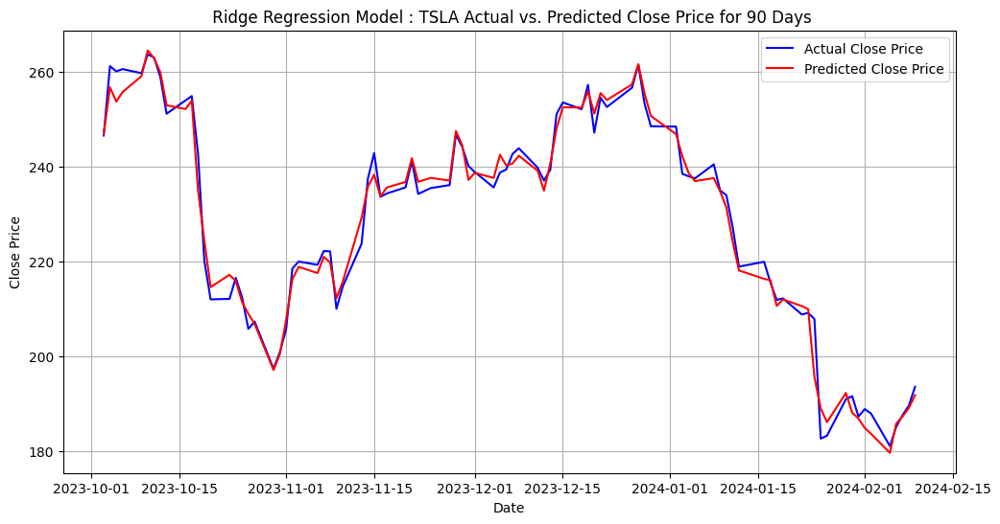

[*********************100%%**********************]  1 of 1 completed

 Ridge Regression Model: Actual Close Price: [246.52999878 261.16000366 260.04998779 260.52999878 259.67001343
 263.61999512 262.98999023 258.86999512 251.11999512 253.91999817
 254.8500061  242.67999268 220.11000061 211.99000549 212.08000183
 216.52000427 212.41999817 205.75999451 207.30000305 197.36000061
 200.83999634 205.66000366 218.50999451 219.96000671 219.27000427
 222.17999268 222.11000061 209.97999573 214.6499939  223.71000671
 237.41000366 242.83999634 233.58999634 234.30000305 235.6000061
 241.19999695 234.21000671 235.44999695 236.08000183 246.72000122
 244.13999939 240.08000183 238.83000183 235.58000183 238.72000122
 239.36999512 242.63999939 243.83999634 239.74000549 237.00999451
 239.28999329 251.05000305 253.5        252.08000183 257.22000122
 247.13999939 254.5        252.53999329 256.60998535 261.44000244
 253.17999268 248.47999573 248.41999817 238.44999695 237.92999268
 237.49000549 240.44999695 234.96000671 233.94000244 227.22000122
 218.88999939 219.91000366 215.5

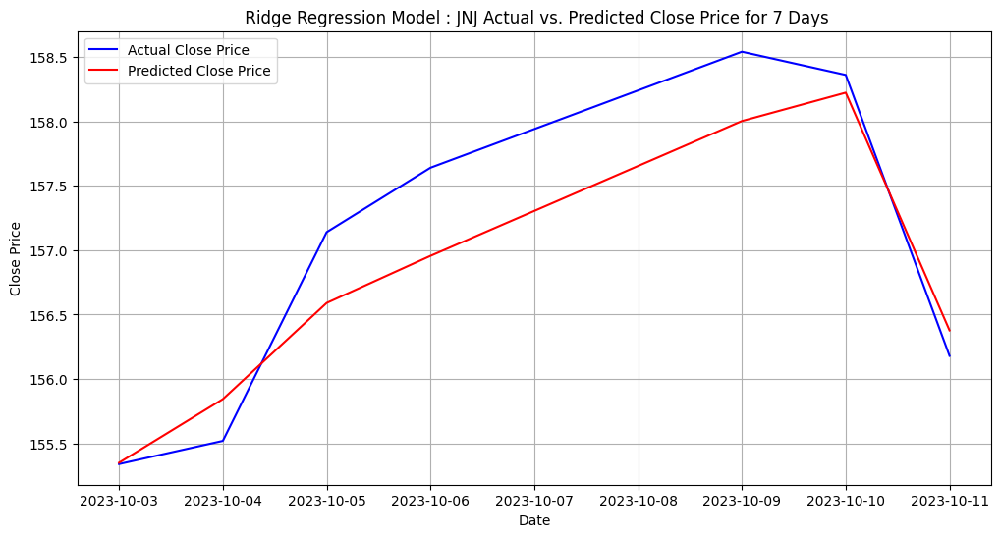

[*********************100%%**********************]  1 of 1 completed

 Ridge Regression Model: Actual Close Price: [155.33999634 155.52000427 157.13999939 157.63999939 158.53999329
 158.36000061 156.17999268], Predicted Close Price: [155.35049606 155.84406063 156.59040369 156.95600597 158.00243378
 158.22262348 156.37765041]
Train RMSE: 0.759772022298231 Train MSE : 0.5772535258671436 Train MAE : 0.5656280263628404
Validation RMSE: 0.6933722100152797, Validation MSE: 0.6933722100152797, Validation MAE: 0.4894861342787086
Test RMSE: 0.4981742508493177, Test MSE: 0.24817758420927893, Test MAE: 0.3716925586684994


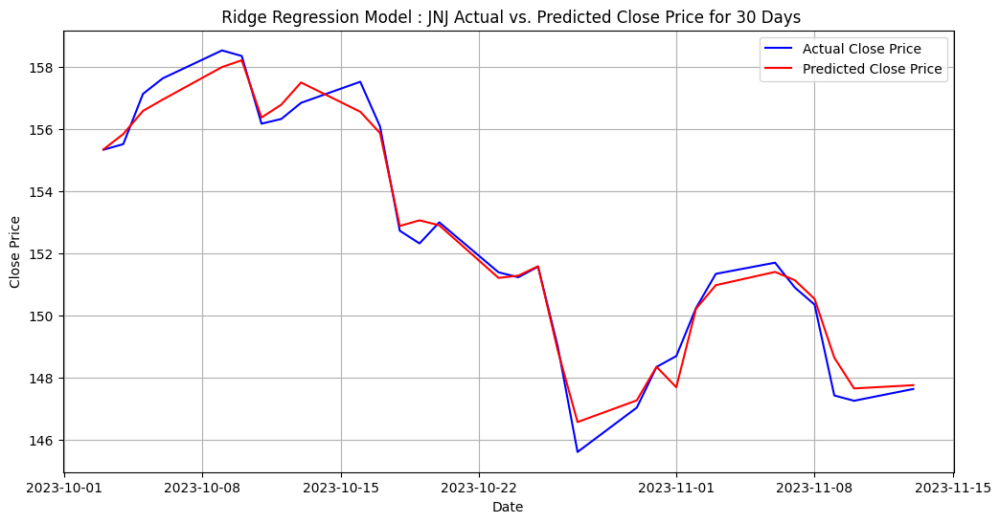

[*********************100%%**********************]  1 of 1 completed

 Ridge Regression Model: Actual Close Price: [155.33999634 155.52000427 157.13999939 157.63999939 158.53999329
 158.36000061 156.17999268 156.33000183 156.8500061  157.52999878
 156.08999634 152.72999573 152.32000732 153.         151.38999939
 151.22999573 151.57000732 149.         145.6000061  147.02999878
 148.33999634 148.69000244 150.24000549 151.33999634 151.69999695
 150.8999939  150.3500061  147.41999817 147.25       147.63000488], Predicted Close Price: [155.35049606 155.84406063 156.59040369 156.95600597 158.00243378
 158.22262348 156.37765041 156.78964234 157.50632271 156.56323457
 155.87684957 152.88224265 153.06354918 152.90539678 151.20954728
 151.28126373 151.58387854 148.86962641 146.56440679 147.26311428
 148.34539272 147.68479882 150.21902813 150.97516905 151.40224702
 151.13450813 150.5331092  148.63864366 147.64798786 147.75189563]
Train RMSE: 0.759772022298231 Train MSE : 0.5772535258671436 Train MAE : 0.5656280263628404
Validation RMSE: 0.6933722100152797, Validati

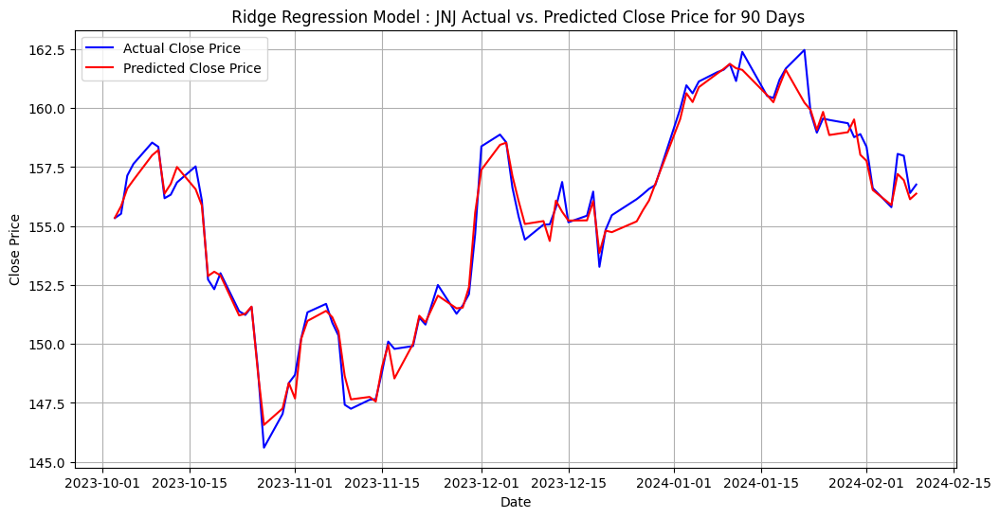

[*********************100%%**********************]  1 of 1 completed

 Ridge Regression Model: Actual Close Price: [155.33999634 155.52000427 157.13999939 157.63999939 158.53999329
 158.36000061 156.17999268 156.33000183 156.8500061  157.52999878
 156.08999634 152.72999573 152.32000732 153.         151.38999939
 151.22999573 151.57000732 149.         145.6000061  147.02999878
 148.33999634 148.69000244 150.24000549 151.33999634 151.69999695
 150.8999939  150.3500061  147.41999817 147.25       147.63000488
 147.66000366 148.80000305 150.1000061  149.78999329 149.91000366
 151.11999512 150.82000732 152.5        151.27999878 151.63000488
 152.11000061 154.66000366 158.38000488 158.88000488 158.55000305
 156.61999512 155.3999939  154.41999817 155.05999756 155.07000732
 155.78999329 156.86999512 155.16000366 155.44000244 156.46000671
 153.27000427 154.83999634 155.46000671 156.13999939 156.3500061
 156.58000183 156.74000549 159.97000122 160.97000122 160.63000488
 161.13000488 161.52999878 161.63000488 161.86999512 161.1499939
 162.38999939 160.52000427 160.42


/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:185: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  array = numpy.asarray(array, order=order, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:185: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  array = numpy.asarray(array, order=order, dtype=dtype)
<ipython-input-16-2b85885974c5>:40: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')
/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: FutureWarning: Calling float o

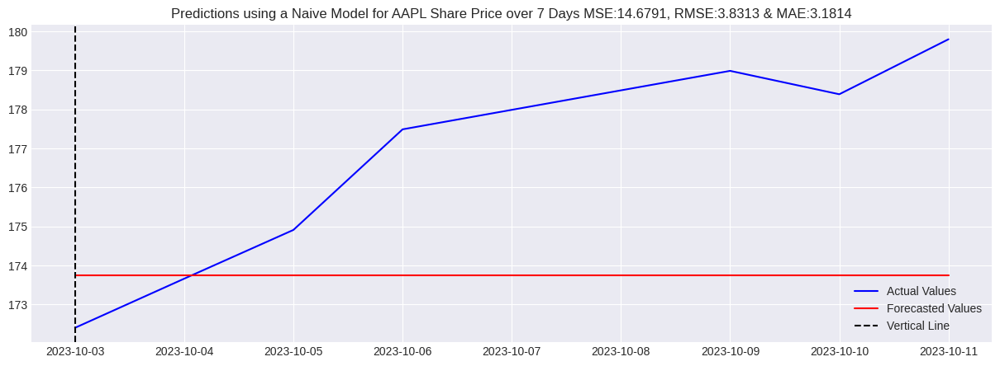

[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:185: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  array = numpy.asarray(array, order=order, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:185: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  array = numpy.asarray(array, order=order, dtype=dtype)
<ipython-input-16-2b85885974c5>:40: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')
/usr/local/lib/python3.10/dist-packag

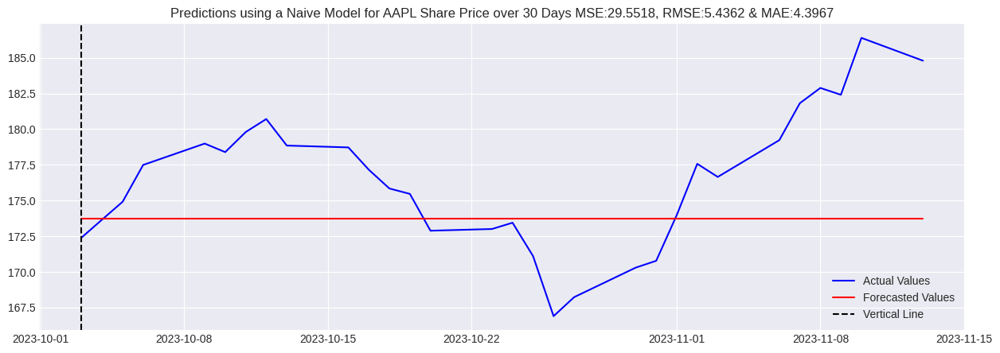

[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:185: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  array = numpy.asarray(array, order=order, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:185: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  array = numpy.asarray(array, order=order, dtype=dtype)
<ipython-input-16-2b85885974c5>:40: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')
/usr/local/lib/python3.10/dist-packag

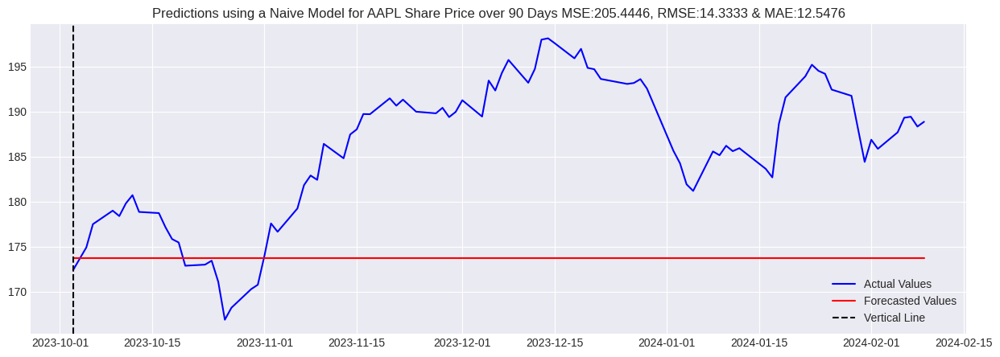

[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:185: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  array = numpy.asarray(array, order=order, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:185: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  array = numpy.asarray(array, order=order, dtype=dtype)
<ipython-input-16-2b85885974c5>:40: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')
/usr/local/lib/python3.10/dist-packag

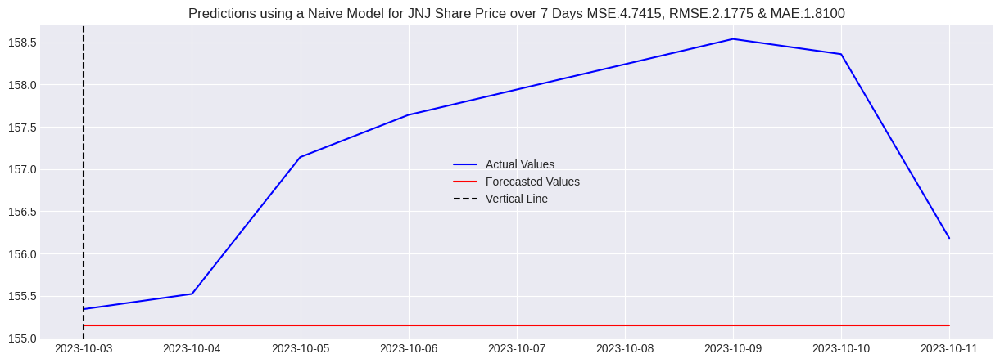

[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:185: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  array = numpy.asarray(array, order=order, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:185: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  array = numpy.asarray(array, order=order, dtype=dtype)
<ipython-input-16-2b85885974c5>:40: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')
/usr/local/lib/python3.10/dist-packag

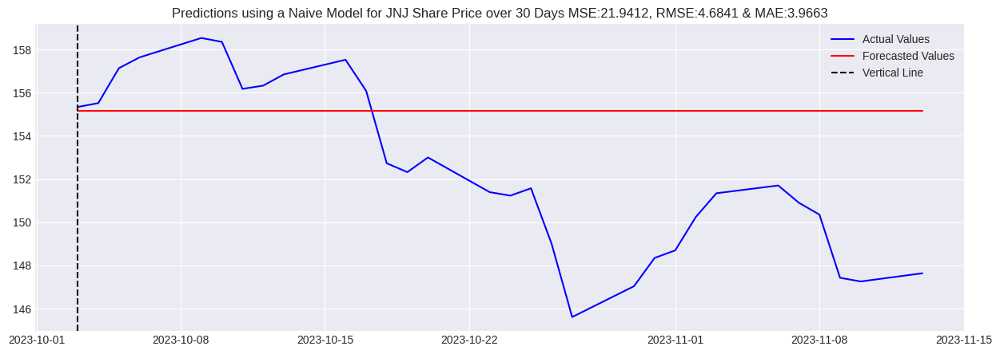

[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:185: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  array = numpy.asarray(array, order=order, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:185: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  array = numpy.asarray(array, order=order, dtype=dtype)
<ipython-input-16-2b85885974c5>:40: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')
/usr/local/lib/python3.10/dist-packag

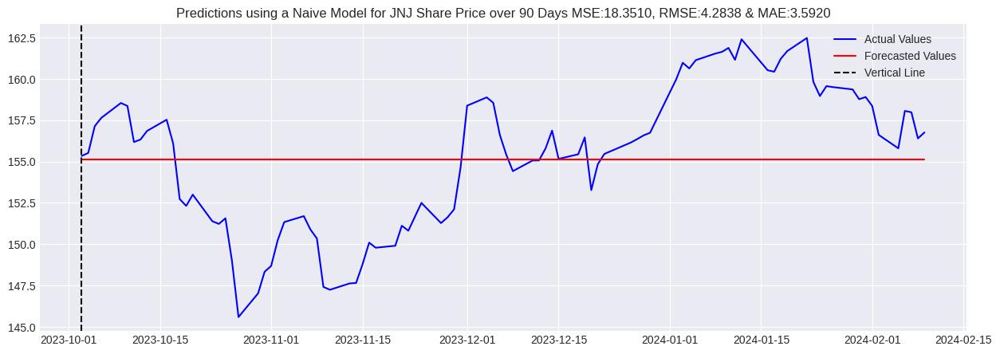

[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:185: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  array = numpy.asarray(array, order=order, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:185: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  array = numpy.asarray(array, order=order, dtype=dtype)
<ipython-input-16-2b85885974c5>:40: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')
/usr/local/lib/python3.10/dist-packag

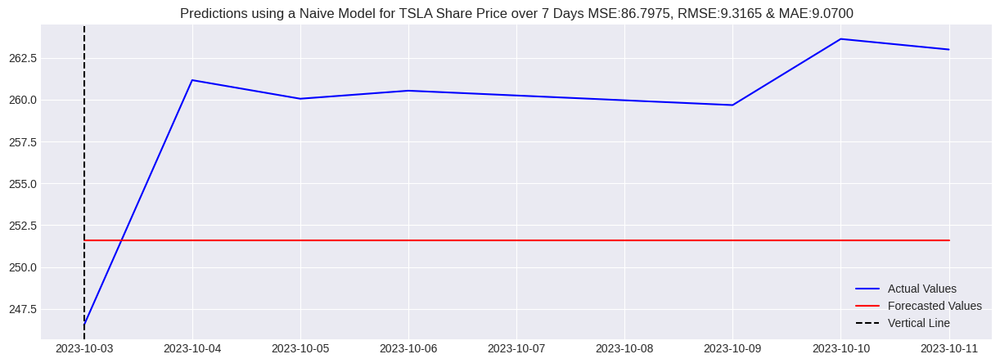

[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:185: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  array = numpy.asarray(array, order=order, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:185: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  array = numpy.asarray(array, order=order, dtype=dtype)
<ipython-input-16-2b85885974c5>:40: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')
/usr/local/lib/python3.10/dist-packag

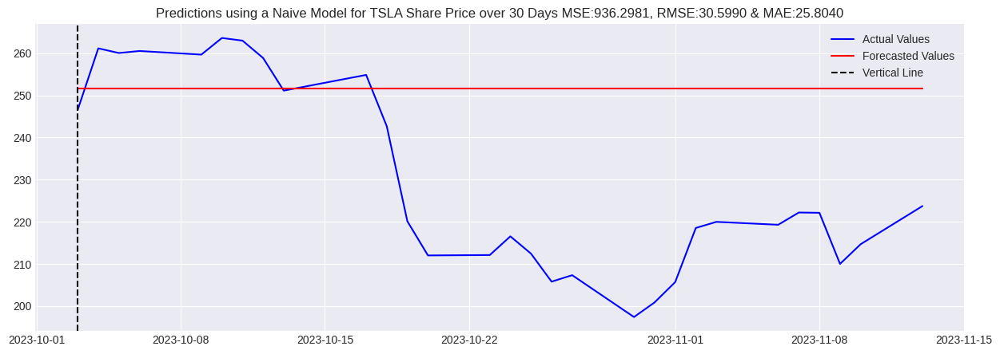

[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:185: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  array = numpy.asarray(array, order=order, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:185: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  array = numpy.asarray(array, order=order, dtype=dtype)
<ipython-input-16-2b85885974c5>:40: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')
/usr/local/lib/python3.10/dist-packag

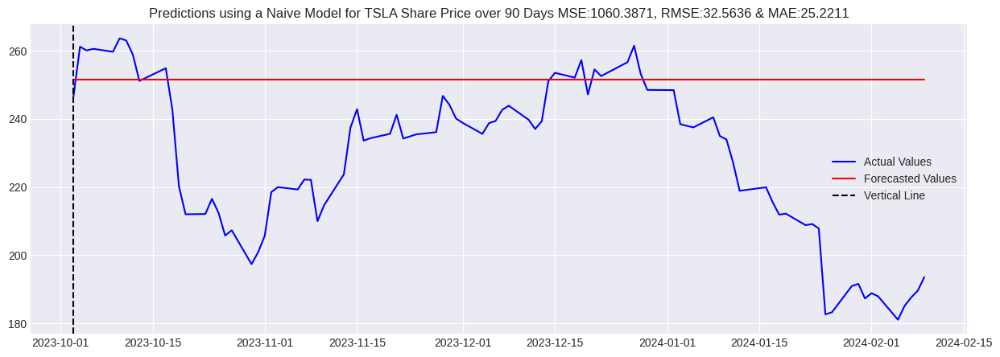

[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Max

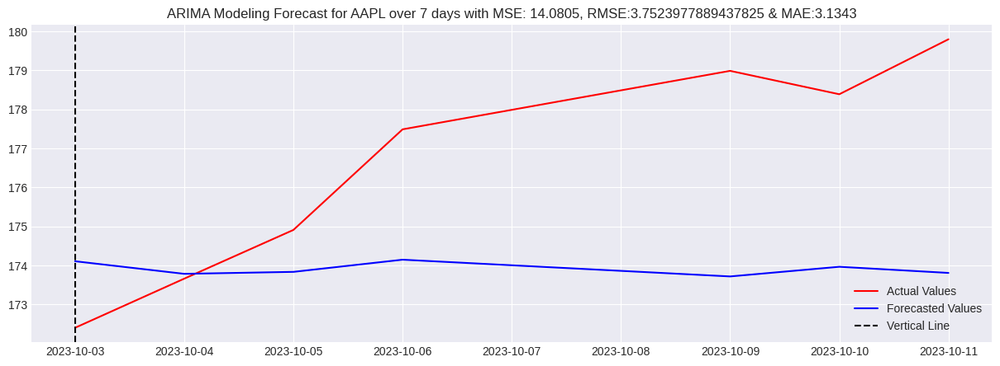

[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Max

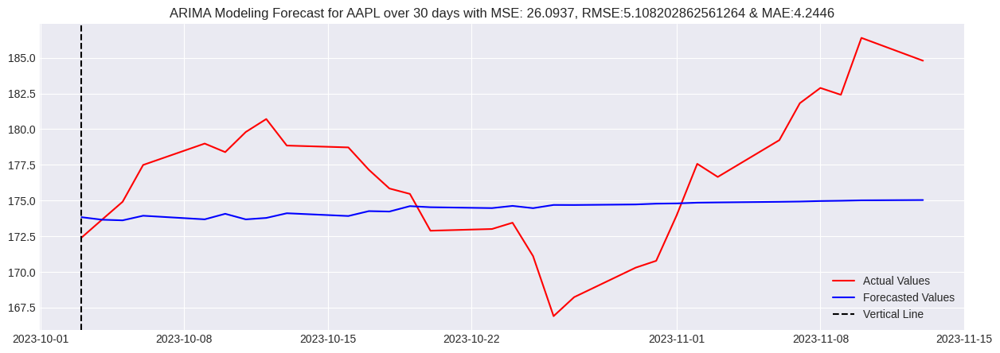

[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Max

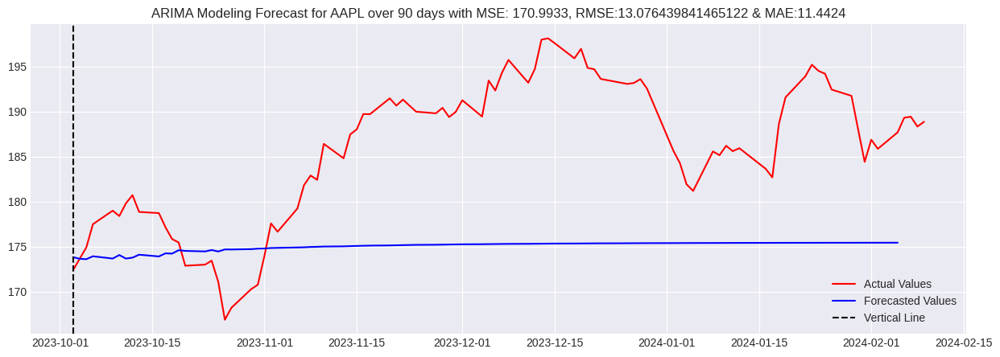

[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Max

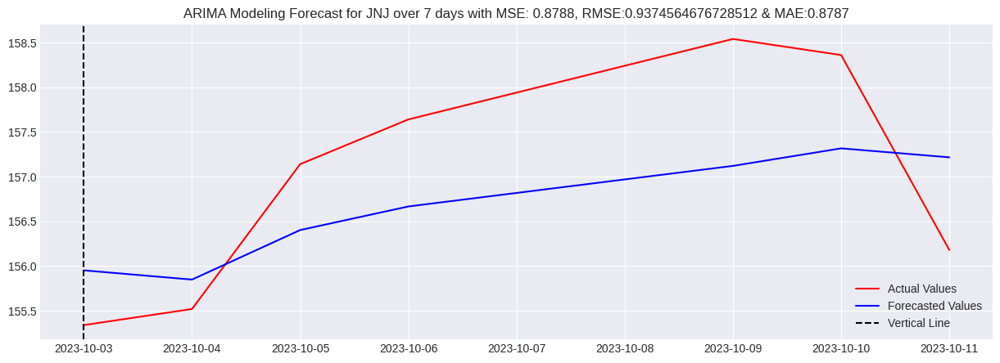

[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Max

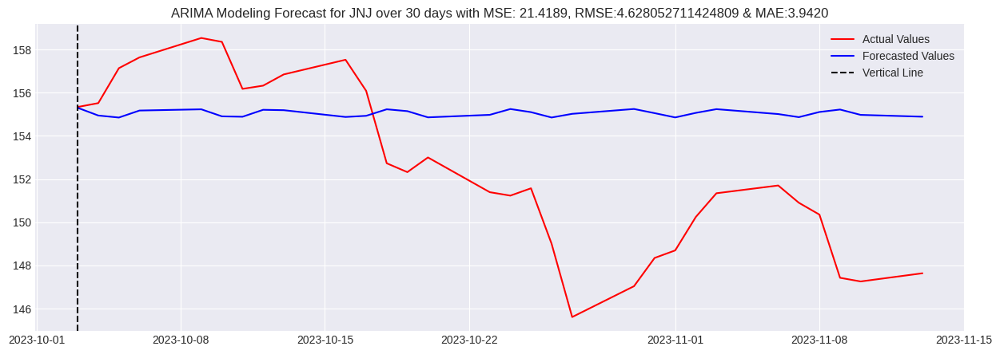

[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index 

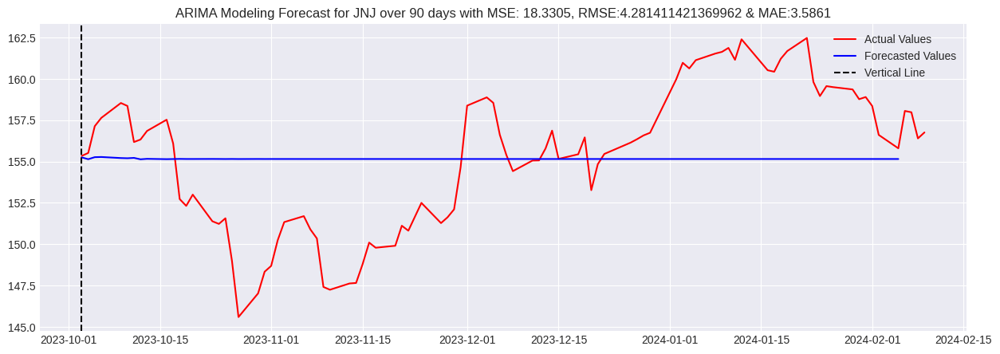

[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Max

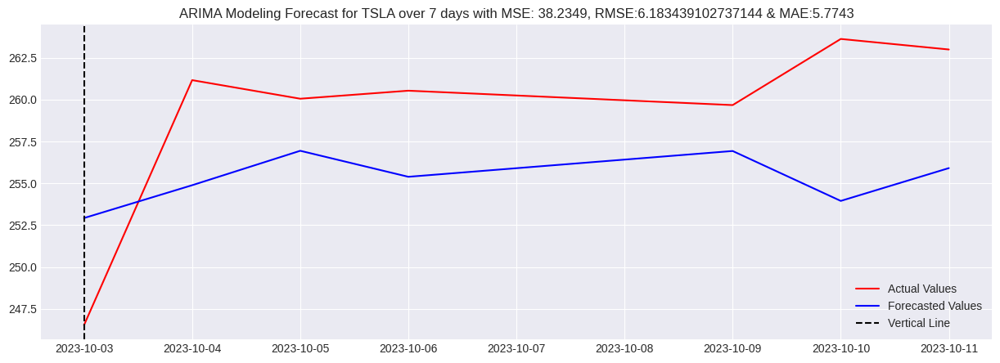

[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Max

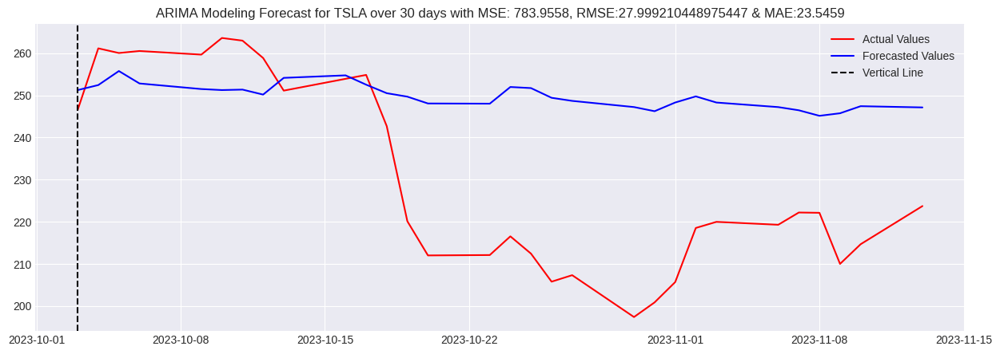

[*********************100%%**********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Max

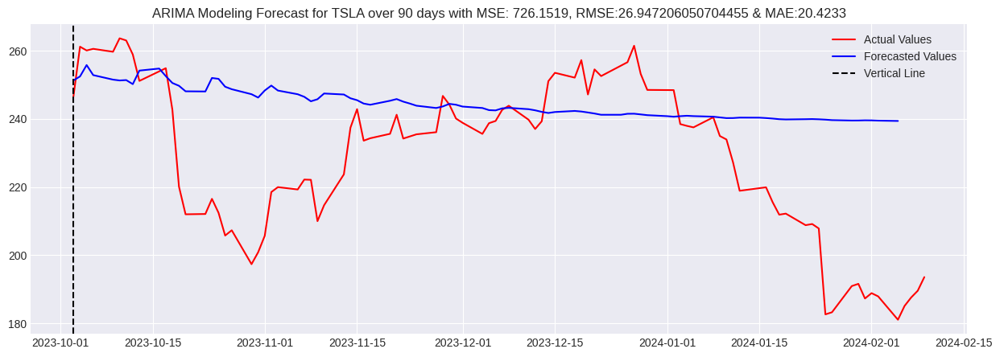

[*********************100%%**********************]  1 of 1 completed


Epoch [10/50] - Training Loss: 0.0015, Test Loss: 0.0057
Epoch [20/50] - Training Loss: 0.0012, Test Loss: 0.0045
Epoch [30/50] - Training Loss: 0.0012, Test Loss: 0.0044
Epoch [40/50] - Training Loss: 0.0012, Test Loss: 0.0044
Epoch [50/50] - Training Loss: 0.0012, Test Loss: 0.0044


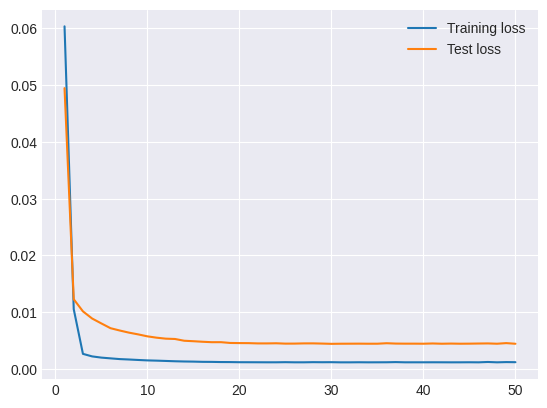

<ipython-input-66-c63adde89b6b>:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  historical_data[-1] = predicted_value
<ipython-input-68-01d63afce19a>:12: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


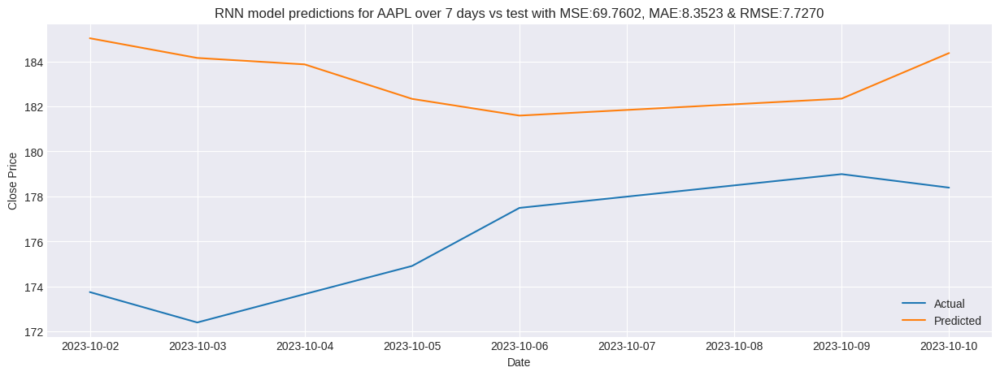

[*********************100%%**********************]  1 of 1 completed


Epoch [10/50] - Training Loss: 0.0015, Test Loss: 0.0058
Epoch [20/50] - Training Loss: 0.0012, Test Loss: 0.0046
Epoch [30/50] - Training Loss: 0.0012, Test Loss: 0.0045
Epoch [40/50] - Training Loss: 0.0012, Test Loss: 0.0044
Epoch [50/50] - Training Loss: 0.0012, Test Loss: 0.0045


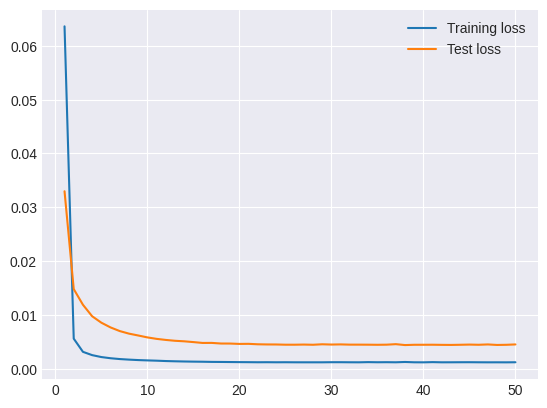

<ipython-input-66-c63adde89b6b>:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  historical_data[-1] = predicted_value
<ipython-input-68-01d63afce19a>:12: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


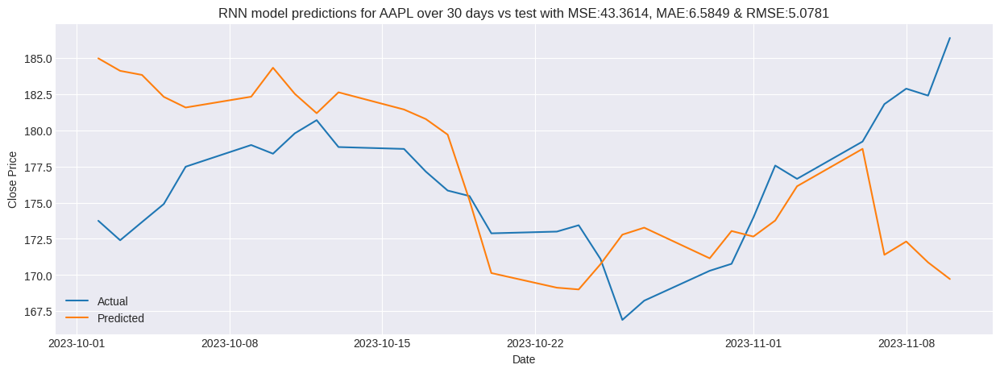

[*********************100%%**********************]  1 of 1 completed


Epoch [10/50] - Training Loss: 0.0016, Test Loss: 0.0059
Epoch [20/50] - Training Loss: 0.0012, Test Loss: 0.0045
Epoch [30/50] - Training Loss: 0.0012, Test Loss: 0.0044
Epoch [40/50] - Training Loss: 0.0012, Test Loss: 0.0044
Epoch [50/50] - Training Loss: 0.0012, Test Loss: 0.0044


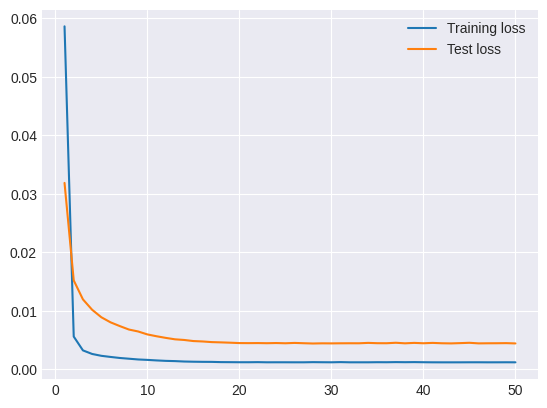

<ipython-input-66-c63adde89b6b>:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  historical_data[-1] = predicted_value
<ipython-input-68-01d63afce19a>:12: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


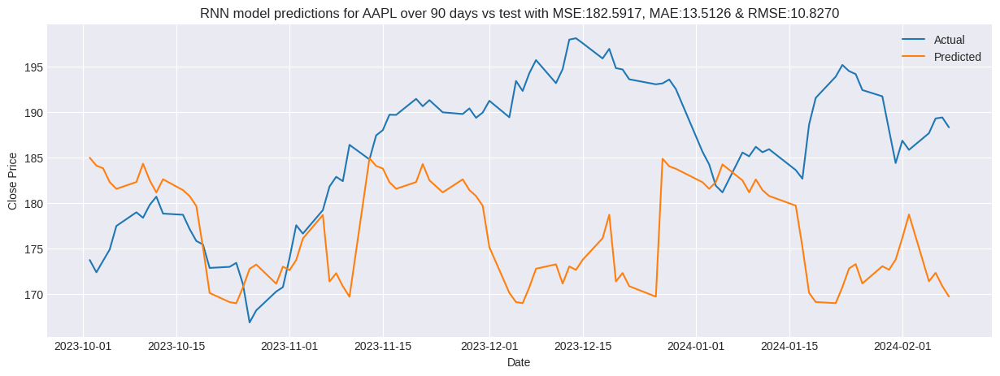

[*********************100%%**********************]  1 of 1 completed


Epoch [10/50] - Training Loss: 0.0013, Test Loss: 0.0050
Epoch [20/50] - Training Loss: 0.0010, Test Loss: 0.0039
Epoch [30/50] - Training Loss: 0.0011, Test Loss: 0.0037
Epoch [40/50] - Training Loss: 0.0010, Test Loss: 0.0037
Epoch [50/50] - Training Loss: 0.0010, Test Loss: 0.0038


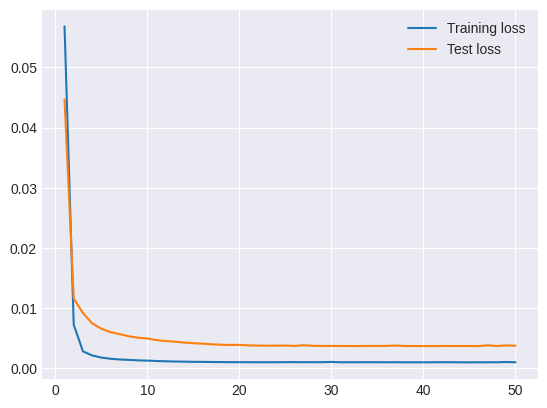

<ipython-input-66-c63adde89b6b>:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  historical_data[-1] = predicted_value
<ipython-input-68-01d63afce19a>:12: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


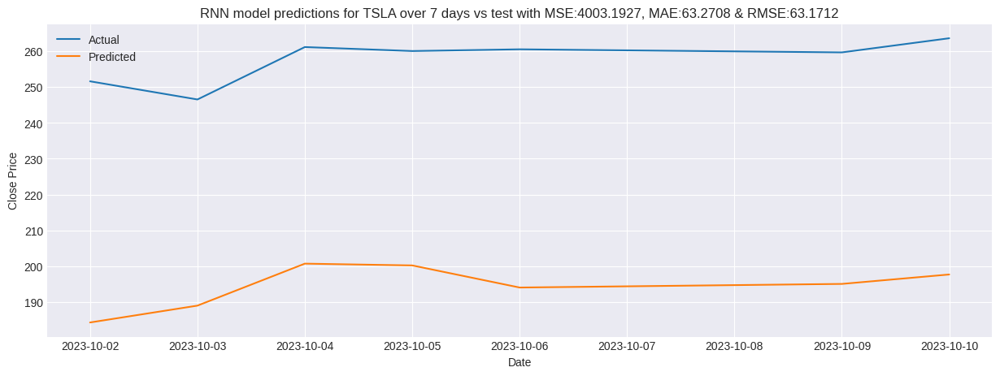

[*********************100%%**********************]  1 of 1 completed


Epoch [10/50] - Training Loss: 0.0012, Test Loss: 0.0047
Epoch [20/50] - Training Loss: 0.0010, Test Loss: 0.0039
Epoch [30/50] - Training Loss: 0.0010, Test Loss: 0.0037
Epoch [40/50] - Training Loss: 0.0010, Test Loss: 0.0037
Epoch [50/50] - Training Loss: 0.0010, Test Loss: 0.0037


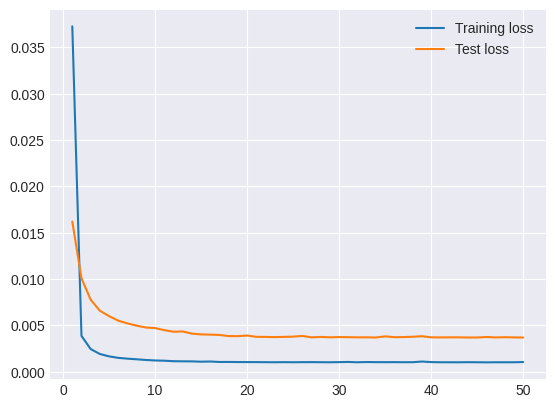

<ipython-input-66-c63adde89b6b>:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  historical_data[-1] = predicted_value
<ipython-input-68-01d63afce19a>:12: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


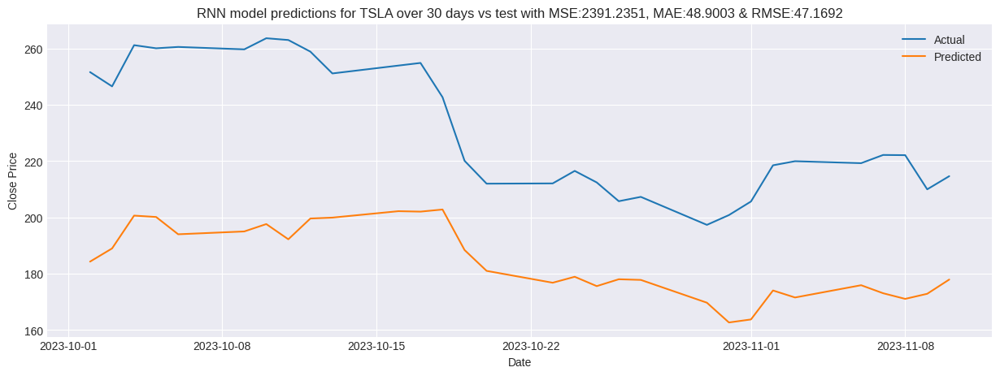

[*********************100%%**********************]  1 of 1 completed


Epoch [10/50] - Training Loss: 0.0013, Test Loss: 0.0048
Epoch [20/50] - Training Loss: 0.0010, Test Loss: 0.0038
Epoch [30/50] - Training Loss: 0.0010, Test Loss: 0.0038
Epoch [40/50] - Training Loss: 0.0010, Test Loss: 0.0037
Epoch [50/50] - Training Loss: 0.0010, Test Loss: 0.0037


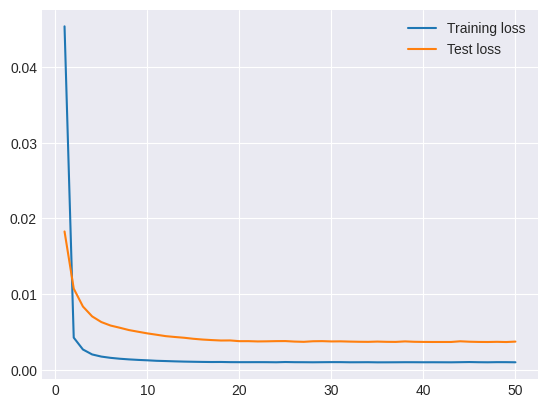

<ipython-input-66-c63adde89b6b>:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  historical_data[-1] = predicted_value
<ipython-input-68-01d63afce19a>:12: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


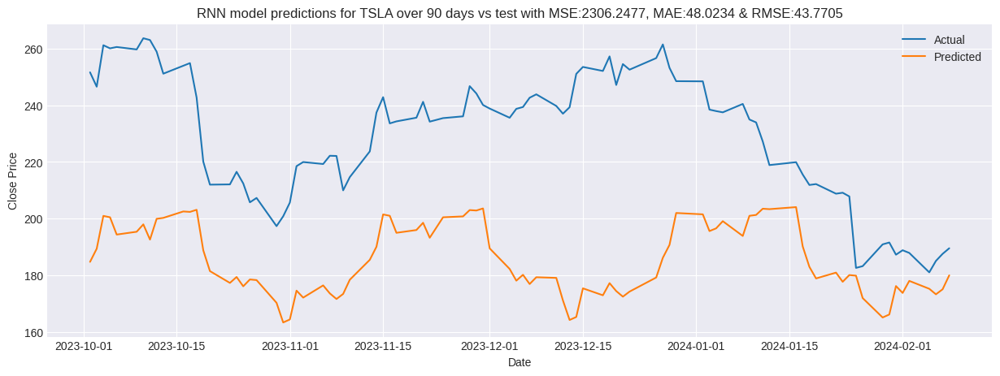

[*********************100%%**********************]  1 of 1 completed


Epoch [10/50] - Training Loss: 0.0024, Test Loss: 0.0059
Epoch [20/50] - Training Loss: 0.0024, Test Loss: 0.0058
Epoch [30/50] - Training Loss: 0.0024, Test Loss: 0.0057
Epoch [40/50] - Training Loss: 0.0024, Test Loss: 0.0059
Epoch [50/50] - Training Loss: 0.0024, Test Loss: 0.0060


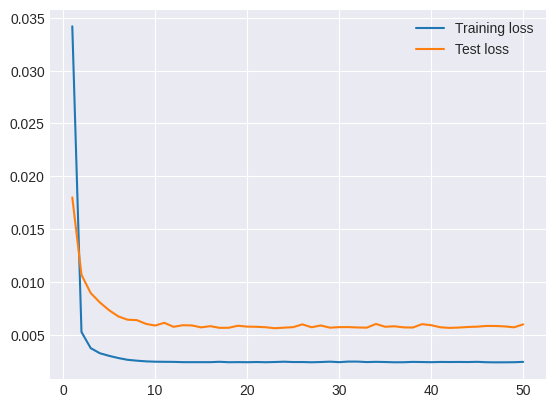

<ipython-input-66-c63adde89b6b>:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  historical_data[-1] = predicted_value
<ipython-input-68-01d63afce19a>:12: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


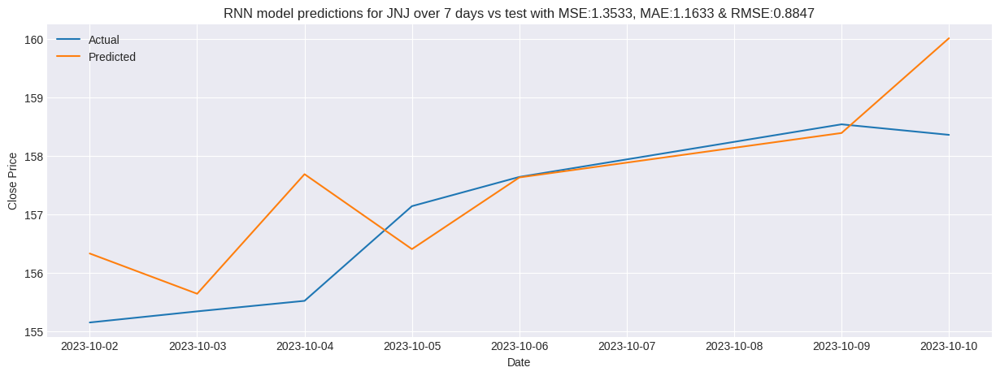

[*********************100%%**********************]  1 of 1 completed


Epoch [10/50] - Training Loss: 0.0024, Test Loss: 0.0058
Epoch [20/50] - Training Loss: 0.0024, Test Loss: 0.0057
Epoch [30/50] - Training Loss: 0.0024, Test Loss: 0.0057
Epoch [40/50] - Training Loss: 0.0024, Test Loss: 0.0057
Epoch [50/50] - Training Loss: 0.0024, Test Loss: 0.0058


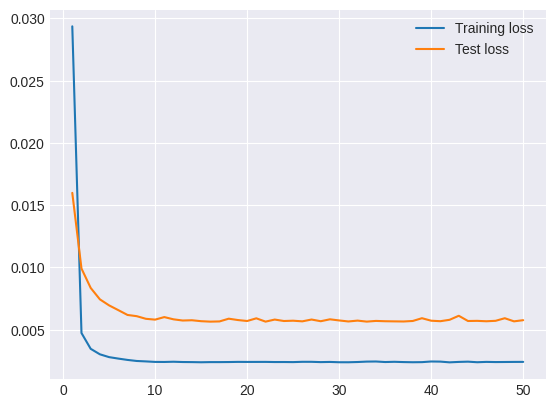

<ipython-input-66-c63adde89b6b>:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  historical_data[-1] = predicted_value
<ipython-input-68-01d63afce19a>:12: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


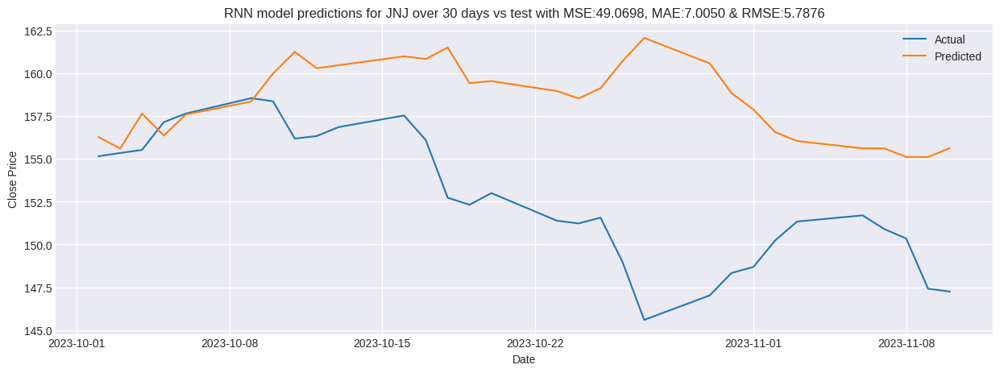

[*********************100%%**********************]  1 of 1 completed


Epoch [10/50] - Training Loss: 0.0024, Test Loss: 0.0058
Epoch [20/50] - Training Loss: 0.0024, Test Loss: 0.0059
Epoch [30/50] - Training Loss: 0.0024, Test Loss: 0.0057
Epoch [40/50] - Training Loss: 0.0024, Test Loss: 0.0057
Epoch [50/50] - Training Loss: 0.0024, Test Loss: 0.0057


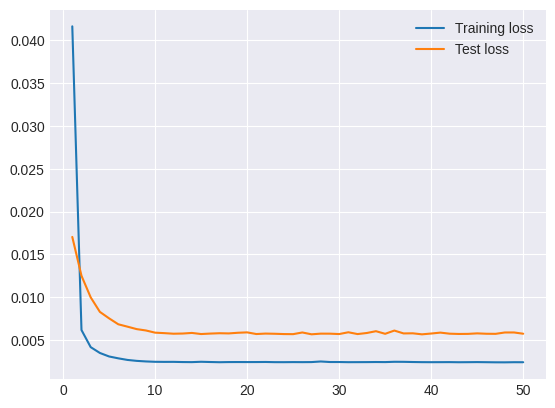

<ipython-input-66-c63adde89b6b>:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  historical_data[-1] = predicted_value
<ipython-input-68-01d63afce19a>:12: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


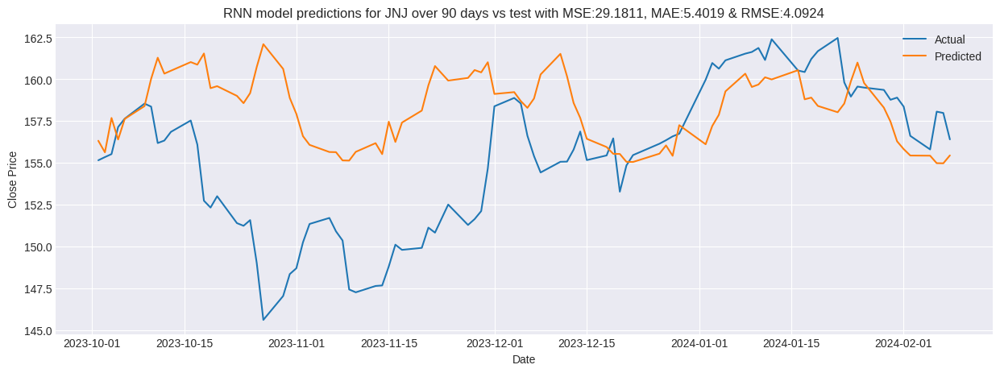

/usr/local/lib/python3.10/dist-packages/torch/__init__.py:696: UserWarning: torch.set_default_tensor_type() is deprecated as of PyTorch 2.1, please use torch.set_default_dtype() and torch.set_default_device() as alternatives. (Triggered internally at ../torch/csrc/tensor/python_tensor.cpp:451.)
  _C._set_default_tensor_type(t)
<ipython-input-59-c8892329ea7b>:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


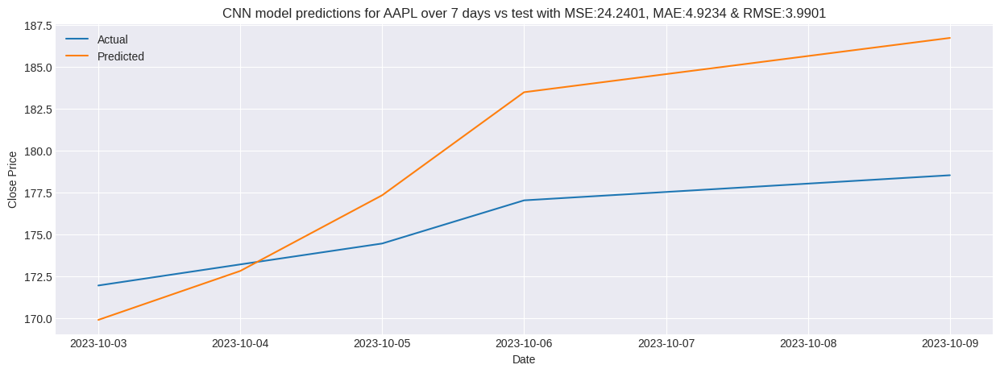

<ipython-input-59-c8892329ea7b>:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


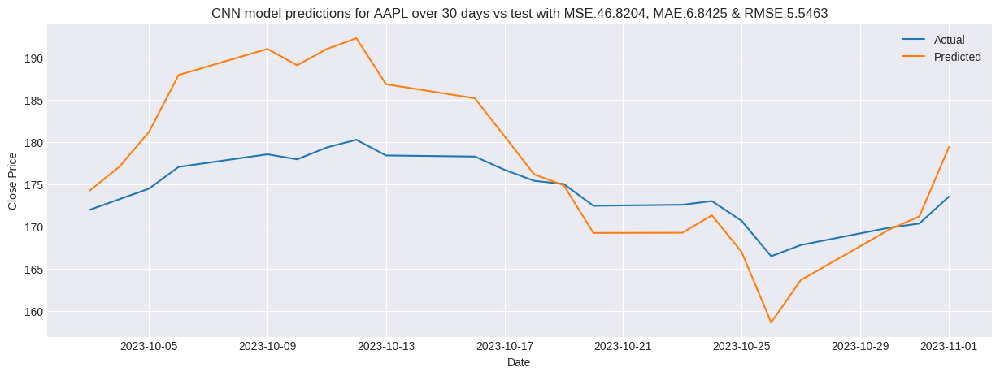

<ipython-input-59-c8892329ea7b>:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


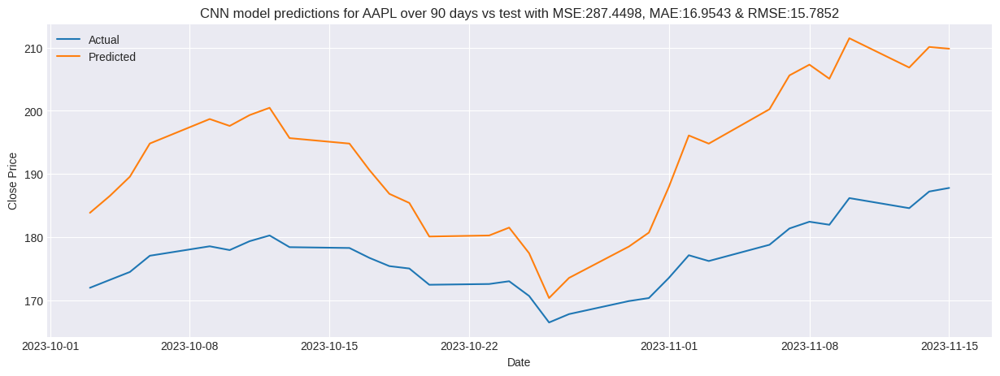

<ipython-input-59-c8892329ea7b>:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


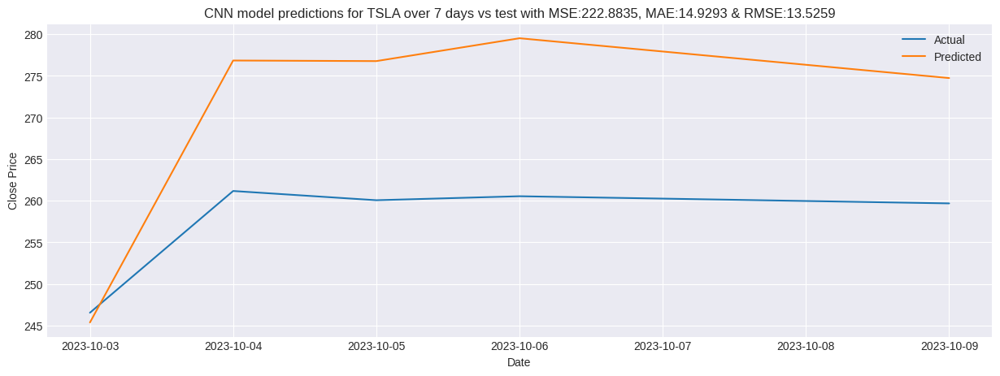

<ipython-input-59-c8892329ea7b>:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


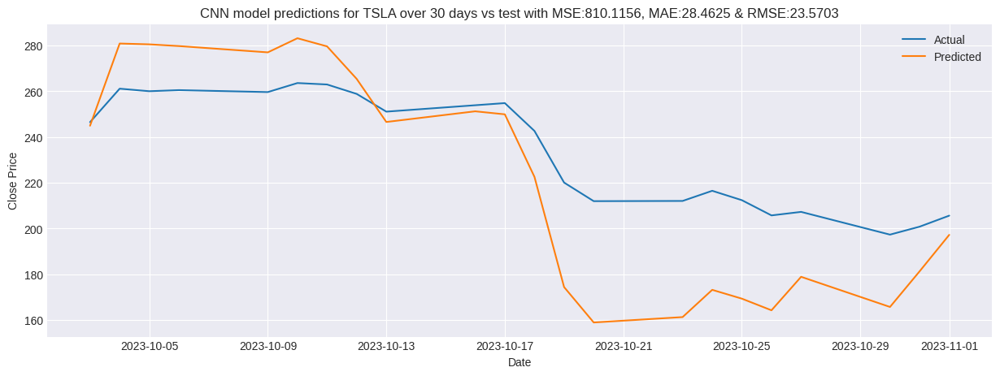

<ipython-input-59-c8892329ea7b>:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


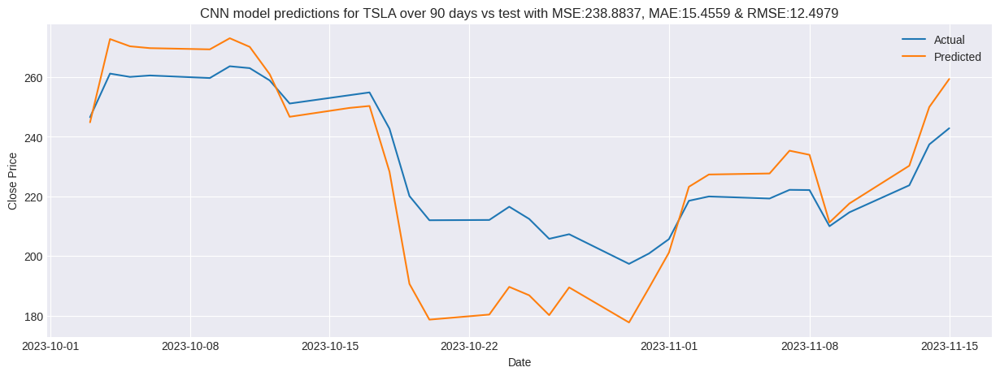

<ipython-input-59-c8892329ea7b>:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


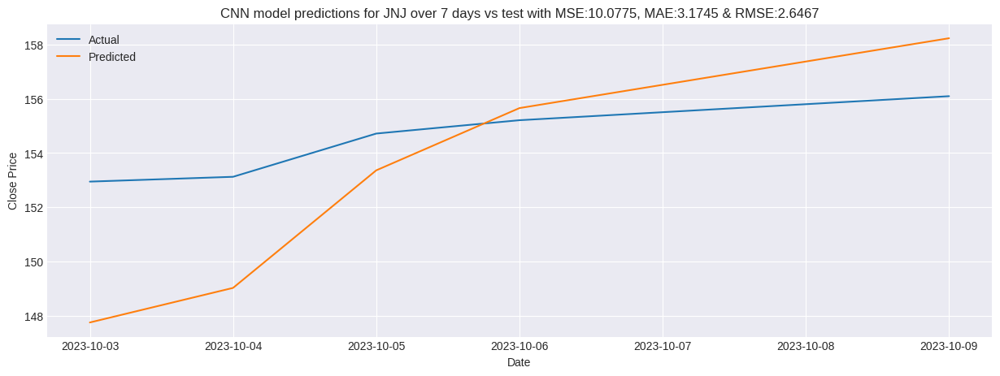

<ipython-input-59-c8892329ea7b>:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


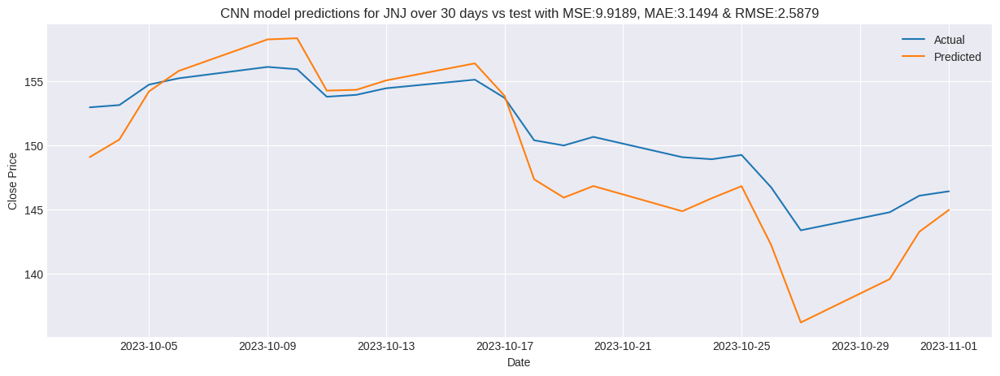

<ipython-input-59-c8892329ea7b>:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


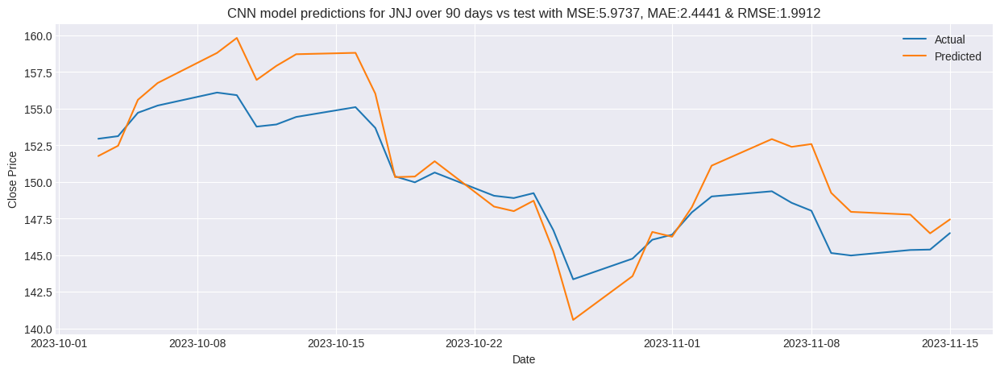

[*********************100%%**********************]  1 of 1 completed


Epoch 1/75
9/9 - 11s - loss: 0.0545 - val_loss: 0.0500 - 11s/epoch - 1s/step
Epoch 2/75
9/9 - 6s - loss: 0.0110 - val_loss: 0.0329 - 6s/epoch - 646ms/step
Epoch 3/75
9/9 - 5s - loss: 0.0074 - val_loss: 0.0382 - 5s/epoch - 574ms/step
Epoch 4/75
9/9 - 6s - loss: 0.0096 - val_loss: 0.0328 - 6s/epoch - 688ms/step
Epoch 5/75
9/9 - 5s - loss: 0.0150 - val_loss: 0.0043 - 5s/epoch - 580ms/step
Epoch 6/75
9/9 - 6s - loss: 0.0095 - val_loss: 0.0087 - 6s/epoch - 697ms/step
Epoch 7/75
9/9 - 5s - loss: 0.0076 - val_loss: 0.0285 - 5s/epoch - 579ms/step
Epoch 8/75
9/9 - 6s - loss: 0.0068 - val_loss: 0.0046 - 6s/epoch - 663ms/step
Epoch 9/75
9/9 - 5s - loss: 0.0051 - val_loss: 0.0040 - 5s/epoch - 608ms/step
Epoch 10/75
9/9 - 5s - loss: 0.0044 - val_loss: 0.0069 - 5s/epoch - 585ms/step
Epoch 11/75
9/9 - 6s - loss: 0.0042 - val_loss: 0.0057 - 6s/epoch - 685ms/step
Epoch 12/75
9/9 - 5s - loss: 0.0044 - val_loss: 0.0044 - 5s/epoch - 582ms/step
Epoch 13/75
9/9 - 6s - loss: 0.0047 - val_loss: 0.0033 - 6s/ep

<ipython-input-34-2d55bb576cf4>:146: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


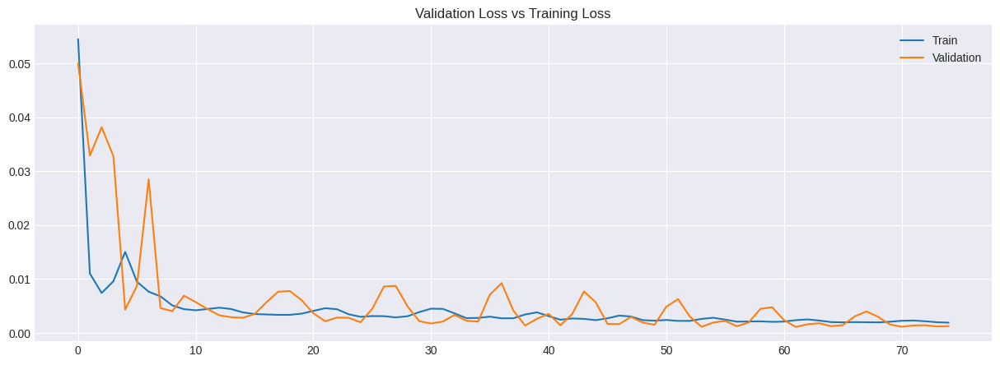

4/4 [==============================] - 1s 131ms/step


<ipython-input-34-2d55bb576cf4>:178: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


<Figure size 640x480 with 0 Axes>

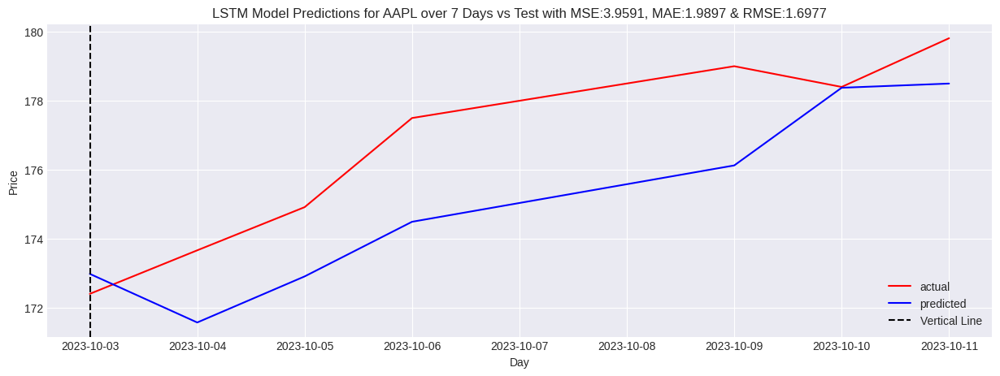

[*********************100%%**********************]  1 of 1 completed


Epoch 1/75
9/9 - 12s - loss: 0.0529 - val_loss: 0.0542 - 12s/epoch - 1s/step
Epoch 2/75
9/9 - 6s - loss: 0.0111 - val_loss: 0.0299 - 6s/epoch - 698ms/step
Epoch 3/75
9/9 - 5s - loss: 0.0069 - val_loss: 0.0393 - 5s/epoch - 596ms/step
Epoch 4/75
9/9 - 6s - loss: 0.0082 - val_loss: 0.0458 - 6s/epoch - 701ms/step
Epoch 5/75
9/9 - 5s - loss: 0.0148 - val_loss: 0.0117 - 5s/epoch - 590ms/step
Epoch 6/75
9/9 - 6s - loss: 0.0133 - val_loss: 0.0132 - 6s/epoch - 632ms/step
Epoch 7/75
9/9 - 6s - loss: 0.0072 - val_loss: 0.0199 - 6s/epoch - 657ms/step
Epoch 8/75
9/9 - 5s - loss: 0.0060 - val_loss: 0.0095 - 5s/epoch - 597ms/step
Epoch 9/75
9/9 - 6s - loss: 0.0054 - val_loss: 0.0038 - 6s/epoch - 705ms/step
Epoch 10/75
9/9 - 5s - loss: 0.0044 - val_loss: 0.0048 - 5s/epoch - 593ms/step
Epoch 11/75
9/9 - 6s - loss: 0.0041 - val_loss: 0.0055 - 6s/epoch - 689ms/step
Epoch 12/75
9/9 - 5s - loss: 0.0042 - val_loss: 0.0051 - 5s/epoch - 590ms/step
Epoch 13/75
9/9 - 6s - loss: 0.0044 - val_loss: 0.0042 - 6s/ep

<ipython-input-34-2d55bb576cf4>:146: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


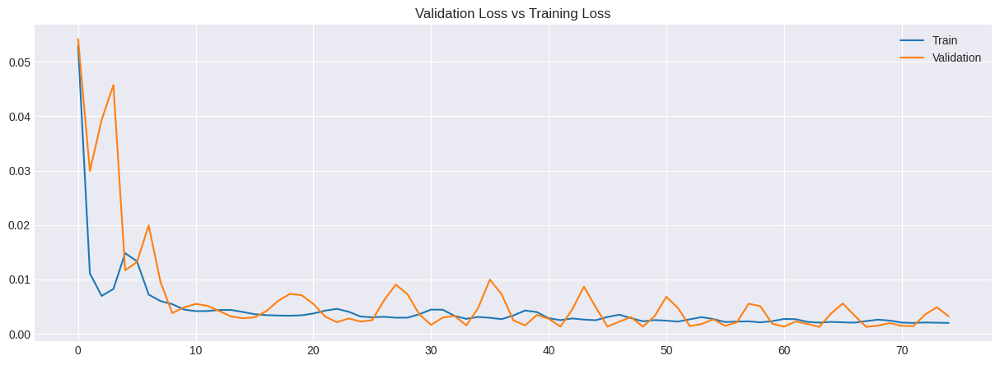

4/4 [==============================] - 1s 129ms/step


<ipython-input-34-2d55bb576cf4>:178: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


<Figure size 640x480 with 0 Axes>

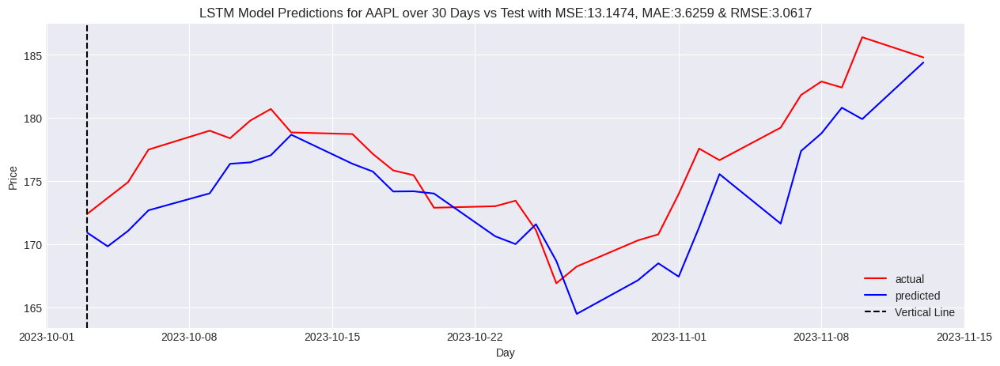

[*********************100%%**********************]  1 of 1 completed


Epoch 1/75
9/9 - 10s - loss: 0.0378 - val_loss: 0.0424 - 10s/epoch - 1s/step
Epoch 2/75
9/9 - 4s - loss: 0.0106 - val_loss: 0.0403 - 4s/epoch - 446ms/step
Epoch 3/75
9/9 - 5s - loss: 0.0080 - val_loss: 0.0437 - 5s/epoch - 549ms/step
Epoch 4/75
9/9 - 4s - loss: 0.0138 - val_loss: 0.0220 - 4s/epoch - 447ms/step
Epoch 5/75
9/9 - 4s - loss: 0.0173 - val_loss: 0.0111 - 4s/epoch - 443ms/step
Epoch 6/75
9/9 - 5s - loss: 0.0075 - val_loss: 0.0082 - 5s/epoch - 541ms/step
Epoch 7/75
9/9 - 4s - loss: 0.0065 - val_loss: 0.0183 - 4s/epoch - 451ms/step
Epoch 8/75
9/9 - 4s - loss: 0.0066 - val_loss: 0.0057 - 4s/epoch - 439ms/step
Epoch 9/75
9/9 - 5s - loss: 0.0063 - val_loss: 0.0036 - 5s/epoch - 548ms/step
Epoch 10/75
9/9 - 4s - loss: 0.0054 - val_loss: 0.0034 - 4s/epoch - 464ms/step
Epoch 11/75
9/9 - 4s - loss: 0.0047 - val_loss: 0.0033 - 4s/epoch - 449ms/step
Epoch 12/75
9/9 - 5s - loss: 0.0043 - val_loss: 0.0040 - 5s/epoch - 557ms/step
Epoch 13/75
9/9 - 4s - loss: 0.0042 - val_loss: 0.0052 - 4s/ep

<ipython-input-34-2d55bb576cf4>:146: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


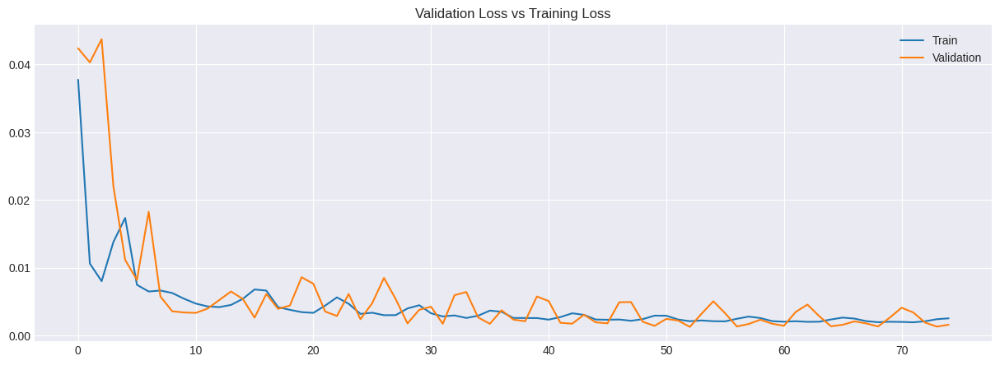

4/4 [==============================] - 1s 100ms/step


<ipython-input-34-2d55bb576cf4>:178: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


<Figure size 640x480 with 0 Axes>

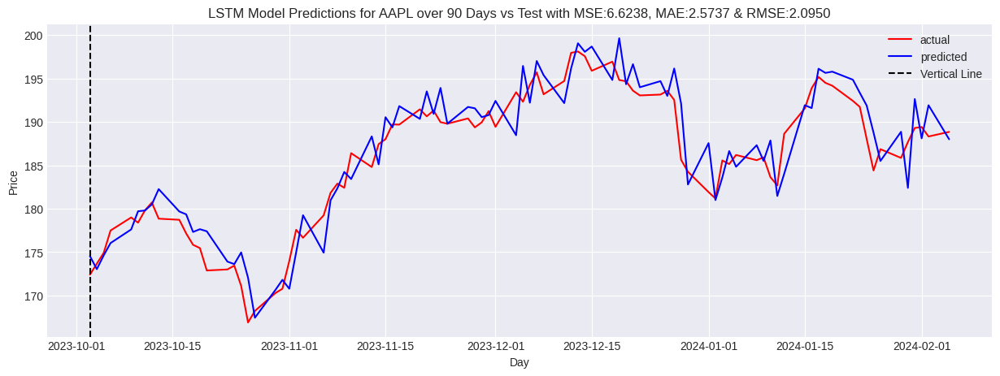

[*********************100%%**********************]  1 of 1 completed


Epoch 1/75
9/9 - 12s - loss: 0.1439 - val_loss: 0.0398 - 12s/epoch - 1s/step
Epoch 2/75
9/9 - 7s - loss: 0.0237 - val_loss: 0.0251 - 7s/epoch - 724ms/step
Epoch 3/75
9/9 - 5s - loss: 0.0149 - val_loss: 0.0125 - 5s/epoch - 608ms/step
Epoch 4/75
9/9 - 7s - loss: 0.0091 - val_loss: 0.0112 - 7s/epoch - 725ms/step
Epoch 5/75
9/9 - 5s - loss: 0.0085 - val_loss: 0.0135 - 5s/epoch - 606ms/step
Epoch 6/75
9/9 - 6s - loss: 0.0075 - val_loss: 0.0117 - 6s/epoch - 705ms/step
Epoch 7/75
9/9 - 5s - loss: 0.0067 - val_loss: 0.0108 - 5s/epoch - 606ms/step
Epoch 8/75
9/9 - 7s - loss: 0.0063 - val_loss: 0.0104 - 7s/epoch - 724ms/step
Epoch 9/75
9/9 - 5s - loss: 0.0061 - val_loss: 0.0096 - 5s/epoch - 601ms/step
Epoch 10/75
9/9 - 6s - loss: 0.0058 - val_loss: 0.0087 - 6s/epoch - 673ms/step
Epoch 11/75
9/9 - 6s - loss: 0.0055 - val_loss: 0.0080 - 6s/epoch - 659ms/step
Epoch 12/75
9/9 - 5s - loss: 0.0054 - val_loss: 0.0075 - 5s/epoch - 610ms/step
Epoch 13/75
9/9 - 6s - loss: 0.0053 - val_loss: 0.0072 - 6s/ep

<ipython-input-34-2d55bb576cf4>:146: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


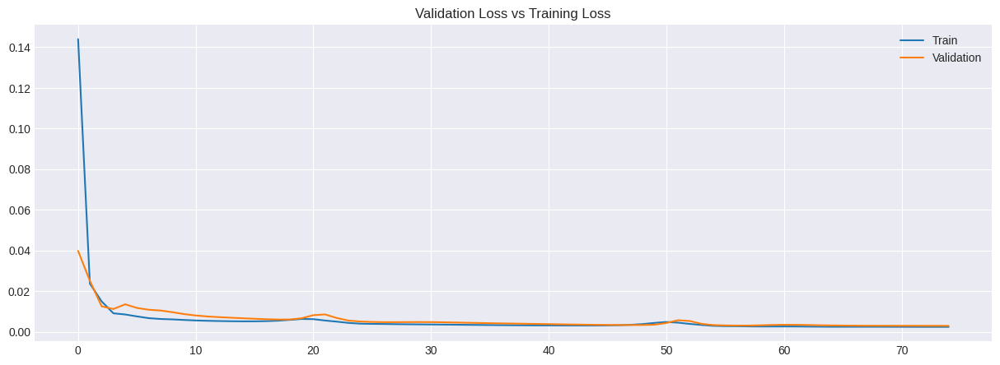

4/4 [==============================] - 1s 139ms/step


<ipython-input-34-2d55bb576cf4>:178: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


<Figure size 640x480 with 0 Axes>

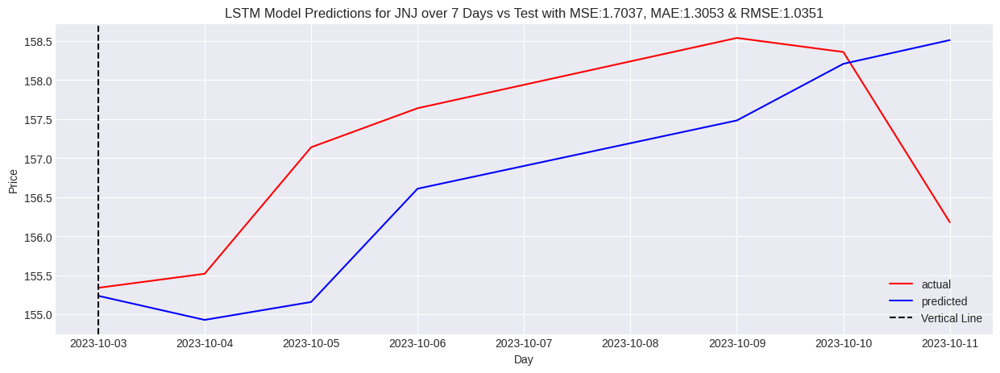

[*********************100%%**********************]  1 of 1 completed


Epoch 1/75
9/9 - 11s - loss: 0.1594 - val_loss: 0.0500 - 11s/epoch - 1s/step
Epoch 2/75
9/9 - 6s - loss: 0.0285 - val_loss: 0.0235 - 6s/epoch - 704ms/step
Epoch 3/75
9/9 - 5s - loss: 0.0158 - val_loss: 0.0142 - 5s/epoch - 589ms/step
Epoch 4/75
9/9 - 6s - loss: 0.0112 - val_loss: 0.0129 - 6s/epoch - 698ms/step
Epoch 5/75
9/9 - 5s - loss: 0.0084 - val_loss: 0.0126 - 5s/epoch - 604ms/step
Epoch 6/75
9/9 - 5s - loss: 0.0073 - val_loss: 0.0100 - 5s/epoch - 602ms/step
Epoch 7/75
9/9 - 6s - loss: 0.0064 - val_loss: 0.0100 - 6s/epoch - 692ms/step
Epoch 8/75
9/9 - 5s - loss: 0.0063 - val_loss: 0.0103 - 5s/epoch - 582ms/step
Epoch 9/75
9/9 - 6s - loss: 0.0064 - val_loss: 0.0098 - 6s/epoch - 688ms/step
Epoch 10/75
9/9 - 5s - loss: 0.0062 - val_loss: 0.0091 - 5s/epoch - 583ms/step
Epoch 11/75
9/9 - 6s - loss: 0.0060 - val_loss: 0.0086 - 6s/epoch - 683ms/step
Epoch 12/75
9/9 - 5s - loss: 0.0059 - val_loss: 0.0083 - 5s/epoch - 586ms/step
Epoch 13/75
9/9 - 6s - loss: 0.0057 - val_loss: 0.0081 - 6s/ep

<ipython-input-34-2d55bb576cf4>:146: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


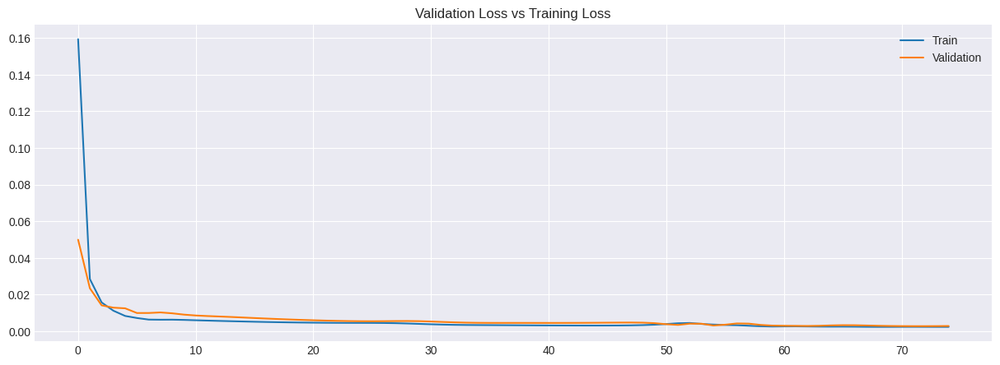

4/4 [==============================] - 1s 141ms/step


<ipython-input-34-2d55bb576cf4>:178: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


<Figure size 640x480 with 0 Axes>

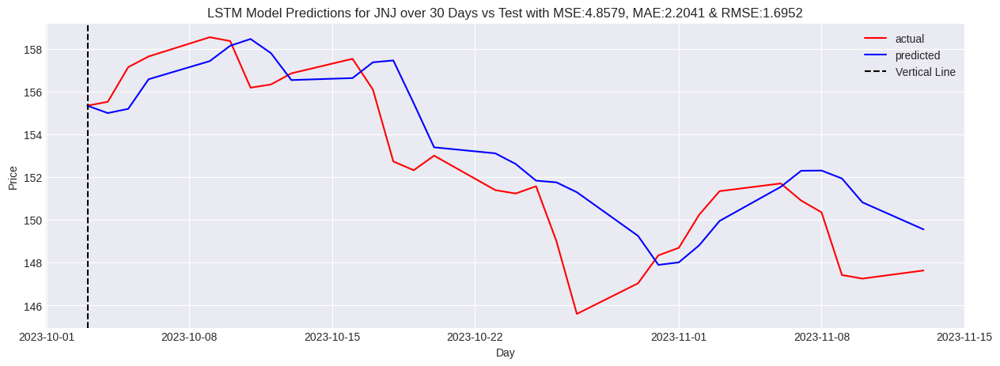

[*********************100%%**********************]  1 of 1 completed


Epoch 1/75
9/9 - 10s - loss: 0.0855 - val_loss: 0.0252 - 10s/epoch - 1s/step
Epoch 2/75
9/9 - 4s - loss: 0.0170 - val_loss: 0.0199 - 4s/epoch - 452ms/step
Epoch 3/75
9/9 - 5s - loss: 0.0114 - val_loss: 0.0112 - 5s/epoch - 551ms/step
Epoch 4/75
9/9 - 4s - loss: 0.0077 - val_loss: 0.0092 - 4s/epoch - 457ms/step
Epoch 5/75
9/9 - 4s - loss: 0.0066 - val_loss: 0.0085 - 4s/epoch - 455ms/step
Epoch 6/75
9/9 - 5s - loss: 0.0064 - val_loss: 0.0080 - 5s/epoch - 551ms/step
Epoch 7/75
9/9 - 4s - loss: 0.0065 - val_loss: 0.0075 - 4s/epoch - 447ms/step
Epoch 8/75
9/9 - 4s - loss: 0.0067 - val_loss: 0.0071 - 4s/epoch - 449ms/step
Epoch 9/75
9/9 - 5s - loss: 0.0073 - val_loss: 0.0069 - 5s/epoch - 566ms/step
Epoch 10/75
9/9 - 4s - loss: 0.0089 - val_loss: 0.0073 - 4s/epoch - 450ms/step
Epoch 11/75
9/9 - 4s - loss: 0.0099 - val_loss: 0.0114 - 4s/epoch - 458ms/step
Epoch 12/75
9/9 - 5s - loss: 0.0081 - val_loss: 0.0126 - 5s/epoch - 567ms/step
Epoch 13/75
9/9 - 4s - loss: 0.0074 - val_loss: 0.0073 - 4s/ep

<ipython-input-34-2d55bb576cf4>:146: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


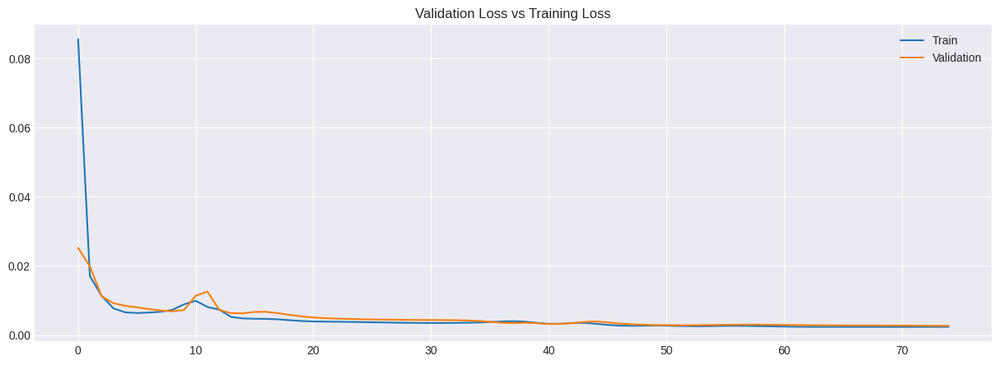

4/4 [==============================] - 1s 127ms/step


<ipython-input-34-2d55bb576cf4>:178: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


<Figure size 640x480 with 0 Axes>

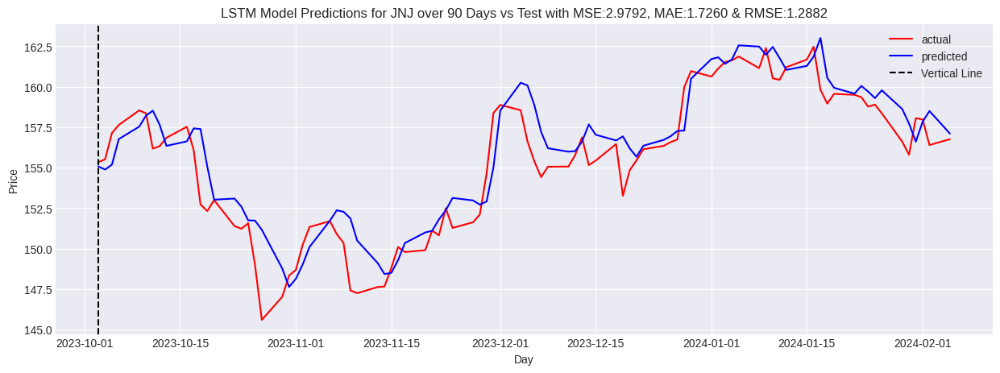

[*********************100%%**********************]  1 of 1 completed


Epoch 1/75
9/9 - 11s - loss: 0.0936 - val_loss: 0.0160 - 11s/epoch - 1s/step
Epoch 2/75
9/9 - 6s - loss: 0.0114 - val_loss: 0.0057 - 6s/epoch - 686ms/step
Epoch 3/75
9/9 - 6s - loss: 0.0080 - val_loss: 0.0130 - 6s/epoch - 611ms/step
Epoch 4/75
9/9 - 6s - loss: 0.0089 - val_loss: 0.0070 - 6s/epoch - 703ms/step
Epoch 5/75
9/9 - 9s - loss: 0.0121 - val_loss: 0.0030 - 9s/epoch - 950ms/step
Epoch 6/75
9/9 - 6s - loss: 0.0071 - val_loss: 0.0035 - 6s/epoch - 673ms/step
Epoch 7/75
9/9 - 5s - loss: 0.0047 - val_loss: 0.0043 - 5s/epoch - 604ms/step
Epoch 8/75
9/9 - 6s - loss: 0.0051 - val_loss: 0.0024 - 6s/epoch - 716ms/step
Epoch 9/75
9/9 - 5s - loss: 0.0044 - val_loss: 0.0022 - 5s/epoch - 605ms/step
Epoch 10/75
9/9 - 6s - loss: 0.0037 - val_loss: 0.0021 - 6s/epoch - 711ms/step
Epoch 11/75
9/9 - 5s - loss: 0.0036 - val_loss: 0.0021 - 5s/epoch - 601ms/step
Epoch 12/75
9/9 - 6s - loss: 0.0038 - val_loss: 0.0021 - 6s/epoch - 720ms/step
Epoch 13/75
9/9 - 6s - loss: 0.0043 - val_loss: 0.0022 - 6s/ep

<ipython-input-34-2d55bb576cf4>:146: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


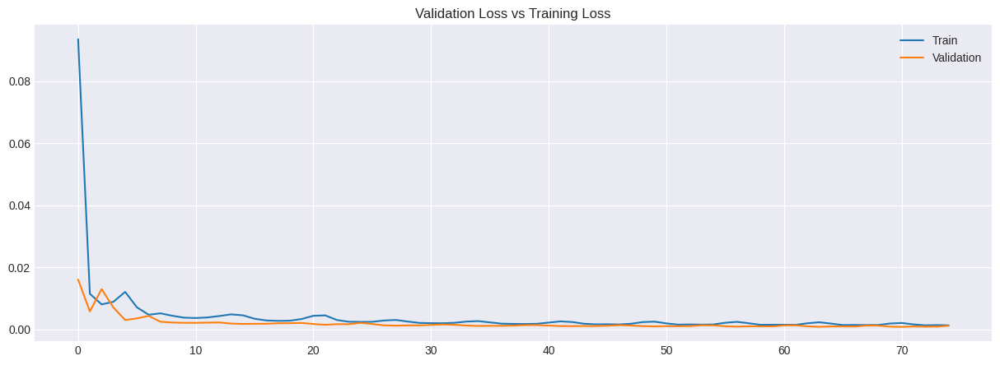

4/4 [==============================] - 1s 143ms/step


<ipython-input-34-2d55bb576cf4>:178: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


<Figure size 640x480 with 0 Axes>

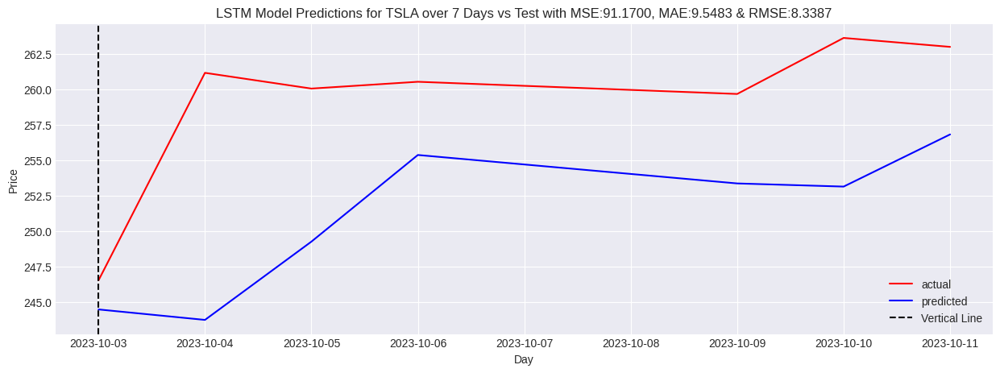

[*********************100%%**********************]  1 of 1 completed


Epoch 1/75
9/9 - 12s - loss: 0.0791 - val_loss: 0.0113 - 12s/epoch - 1s/step
Epoch 2/75
9/9 - 6s - loss: 0.0095 - val_loss: 0.0044 - 6s/epoch - 693ms/step
Epoch 3/75
9/9 - 5s - loss: 0.0067 - val_loss: 0.0065 - 5s/epoch - 582ms/step
Epoch 4/75
9/9 - 6s - loss: 0.0059 - val_loss: 0.0085 - 6s/epoch - 656ms/step
Epoch 5/75
9/9 - 6s - loss: 0.0075 - val_loss: 0.0065 - 6s/epoch - 624ms/step
Epoch 6/75
9/9 - 5s - loss: 0.0135 - val_loss: 0.0023 - 5s/epoch - 583ms/step
Epoch 7/75
9/9 - 6s - loss: 0.0075 - val_loss: 0.0045 - 6s/epoch - 693ms/step
Epoch 8/75
9/9 - 5s - loss: 0.0049 - val_loss: 0.0066 - 5s/epoch - 579ms/step
Epoch 9/75
9/9 - 8s - loss: 0.0062 - val_loss: 0.0031 - 8s/epoch - 914ms/step
Epoch 10/75
9/9 - 6s - loss: 0.0039 - val_loss: 0.0029 - 6s/epoch - 719ms/step
Epoch 11/75
9/9 - 6s - loss: 0.0037 - val_loss: 0.0019 - 6s/epoch - 690ms/step
Epoch 12/75
9/9 - 5s - loss: 0.0035 - val_loss: 0.0017 - 5s/epoch - 604ms/step
Epoch 13/75
9/9 - 6s - loss: 0.0031 - val_loss: 0.0016 - 6s/ep

<ipython-input-34-2d55bb576cf4>:146: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


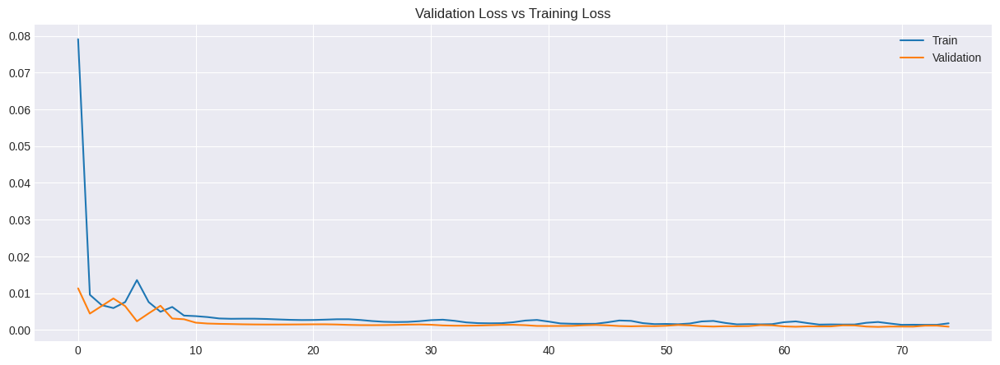

4/4 [==============================] - 1s 137ms/step


<ipython-input-34-2d55bb576cf4>:178: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


<Figure size 640x480 with 0 Axes>

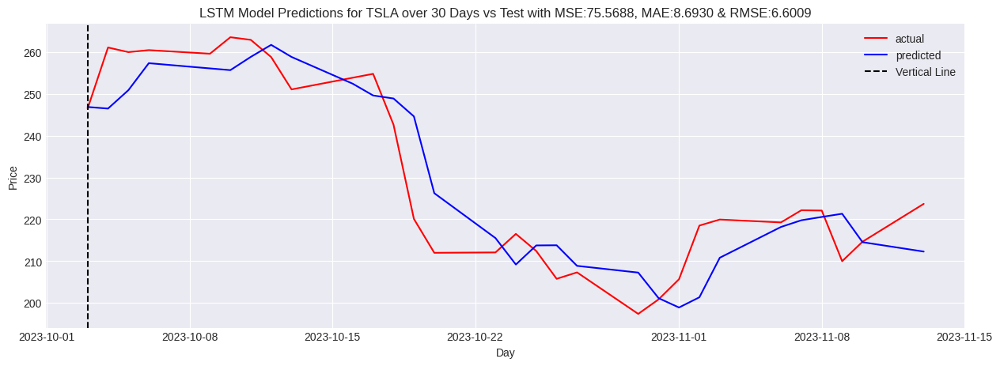

[*********************100%%**********************]  1 of 1 completed


Epoch 1/75
9/9 - 10s - loss: 0.0422 - val_loss: 0.0065 - 10s/epoch - 1s/step
Epoch 2/75
9/9 - 4s - loss: 0.0100 - val_loss: 0.0041 - 4s/epoch - 441ms/step
Epoch 3/75
9/9 - 5s - loss: 0.0059 - val_loss: 0.0035 - 5s/epoch - 536ms/step
Epoch 4/75
9/9 - 4s - loss: 0.0047 - val_loss: 0.0041 - 4s/epoch - 472ms/step
Epoch 5/75
9/9 - 4s - loss: 0.0049 - val_loss: 0.0077 - 4s/epoch - 445ms/step
Epoch 6/75
9/9 - 5s - loss: 0.0081 - val_loss: 0.0113 - 5s/epoch - 523ms/step
Epoch 7/75
9/9 - 4s - loss: 0.0175 - val_loss: 0.0024 - 4s/epoch - 481ms/step
Epoch 8/75
9/9 - 4s - loss: 0.0086 - val_loss: 0.0052 - 4s/epoch - 440ms/step
Epoch 9/75
9/9 - 5s - loss: 0.0057 - val_loss: 0.0086 - 5s/epoch - 514ms/step
Epoch 10/75
9/9 - 4s - loss: 0.0069 - val_loss: 0.0025 - 4s/epoch - 490ms/step
Epoch 11/75
9/9 - 4s - loss: 0.0040 - val_loss: 0.0019 - 4s/epoch - 452ms/step
Epoch 12/75
9/9 - 5s - loss: 0.0032 - val_loss: 0.0020 - 5s/epoch - 512ms/step
Epoch 13/75
9/9 - 4s - loss: 0.0035 - val_loss: 0.0015 - 4s/ep

<ipython-input-34-2d55bb576cf4>:146: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


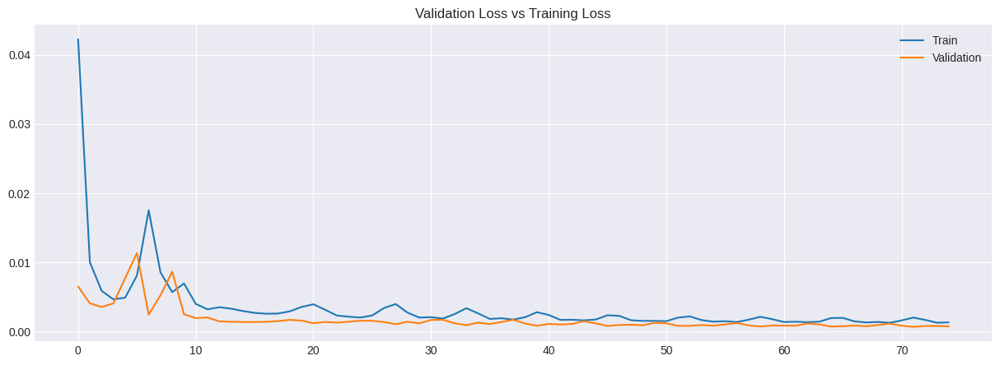

4/4 [==============================] - 1s 110ms/step


<ipython-input-34-2d55bb576cf4>:178: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


<Figure size 640x480 with 0 Axes>

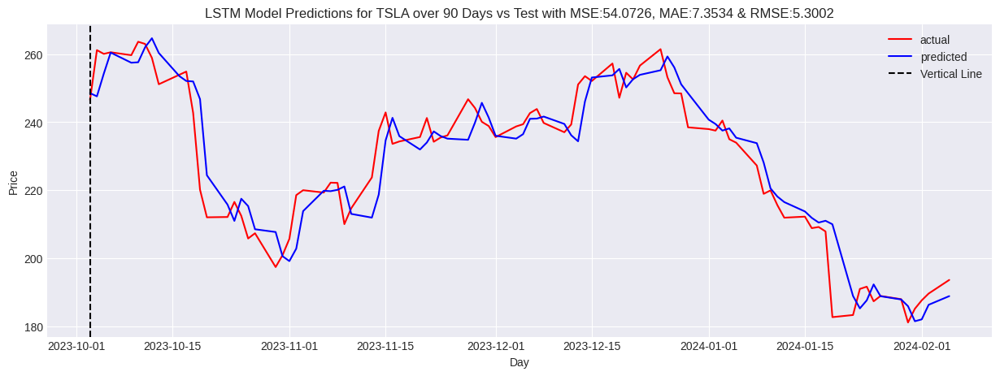

[*********************100%%**********************]  1 of 1 completed


Epoch 1/75
6/6 - 6s - loss: 0.4212 - val_loss: 1.1946 - 6s/epoch - 1s/step
Epoch 2/75
6/6 - 2s - loss: 0.2418 - val_loss: 0.2584 - 2s/epoch - 251ms/step
Epoch 3/75
6/6 - 1s - loss: 0.0596 - val_loss: 0.0995 - 1s/epoch - 248ms/step
Epoch 4/75
6/6 - 2s - loss: 0.0699 - val_loss: 0.0519 - 2s/epoch - 251ms/step
Epoch 5/75
6/6 - 2s - loss: 0.0257 - val_loss: 0.0318 - 2s/epoch - 307ms/step
Epoch 6/75
6/6 - 2s - loss: 0.0189 - val_loss: 0.0087 - 2s/epoch - 362ms/step
Epoch 7/75
6/6 - 2s - loss: 0.0163 - val_loss: 0.0140 - 2s/epoch - 253ms/step
Epoch 8/75
6/6 - 2s - loss: 0.0124 - val_loss: 0.0051 - 2s/epoch - 255ms/step
Epoch 9/75
6/6 - 1s - loss: 0.0093 - val_loss: 0.0130 - 1s/epoch - 248ms/step
Epoch 10/75
6/6 - 2s - loss: 0.0106 - val_loss: 0.0055 - 2s/epoch - 250ms/step
Epoch 11/75
6/6 - 1s - loss: 0.0074 - val_loss: 0.0039 - 1s/epoch - 246ms/step
Epoch 12/75
6/6 - 1s - loss: 0.0073 - val_loss: 0.0061 - 1s/epoch - 245ms/step
Epoch 13/75
6/6 - 2s - loss: 0.0054 - val_loss: 0.0029 - 2s/epoc

<ipython-input-42-829f71aa44ab>:173: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


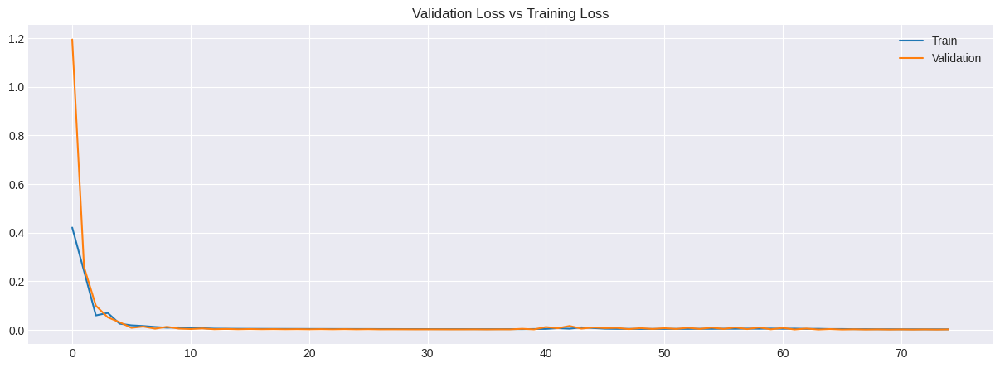

1/1 [==============================] - 1s 852ms/step


<ipython-input-42-829f71aa44ab>:205: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


<Figure size 640x480 with 0 Axes>

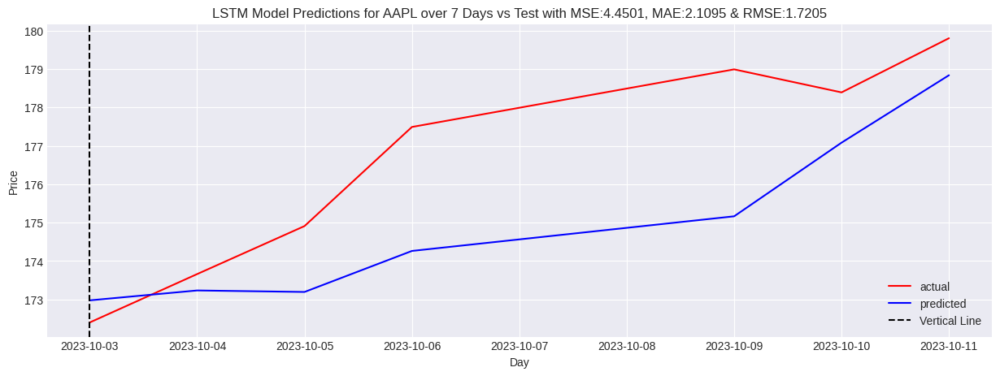

[*********************100%%**********************]  1 of 1 completed


Epoch 1/75
6/6 - 6s - loss: 0.4224 - val_loss: 1.2757 - 6s/epoch - 1s/step
Epoch 2/75
6/6 - 2s - loss: 0.2366 - val_loss: 0.1896 - 2s/epoch - 252ms/step
Epoch 3/75
6/6 - 1s - loss: 0.0679 - val_loss: 0.1474 - 1s/epoch - 250ms/step
Epoch 4/75
6/6 - 1s - loss: 0.0538 - val_loss: 0.0181 - 1s/epoch - 244ms/step
Epoch 5/75
6/6 - 2s - loss: 0.0355 - val_loss: 0.0350 - 2s/epoch - 251ms/step
Epoch 6/75
6/6 - 2s - loss: 0.0106 - val_loss: 0.0129 - 2s/epoch - 311ms/step
Epoch 7/75
6/6 - 2s - loss: 0.0090 - val_loss: 0.0052 - 2s/epoch - 345ms/step
Epoch 8/75
6/6 - 1s - loss: 0.0133 - val_loss: 0.0100 - 1s/epoch - 248ms/step
Epoch 9/75
6/6 - 1s - loss: 0.0118 - val_loss: 0.0038 - 1s/epoch - 245ms/step
Epoch 10/75
6/6 - 2s - loss: 0.0098 - val_loss: 0.0158 - 2s/epoch - 254ms/step
Epoch 11/75
6/6 - 1s - loss: 0.0115 - val_loss: 0.0036 - 1s/epoch - 245ms/step
Epoch 12/75
6/6 - 1s - loss: 0.0083 - val_loss: 0.0056 - 1s/epoch - 244ms/step
Epoch 13/75
6/6 - 1s - loss: 0.0084 - val_loss: 0.0030 - 1s/epoc

<ipython-input-42-829f71aa44ab>:173: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


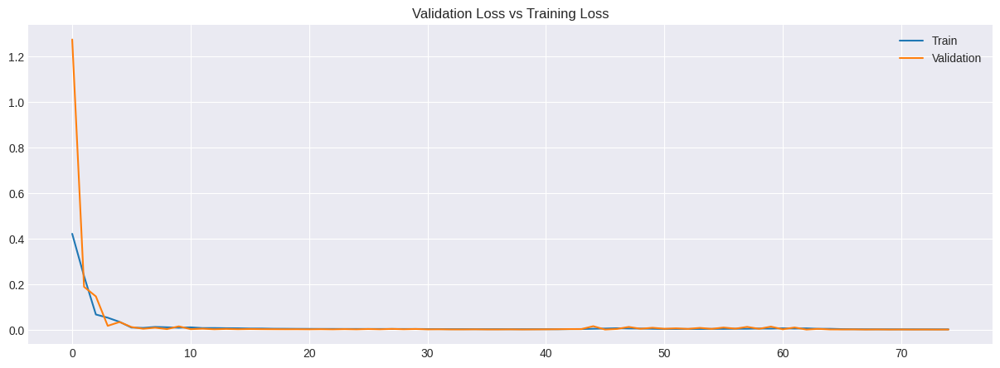

1/1 [==============================] - 1s 848ms/step


<ipython-input-42-829f71aa44ab>:205: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


<Figure size 640x480 with 0 Axes>

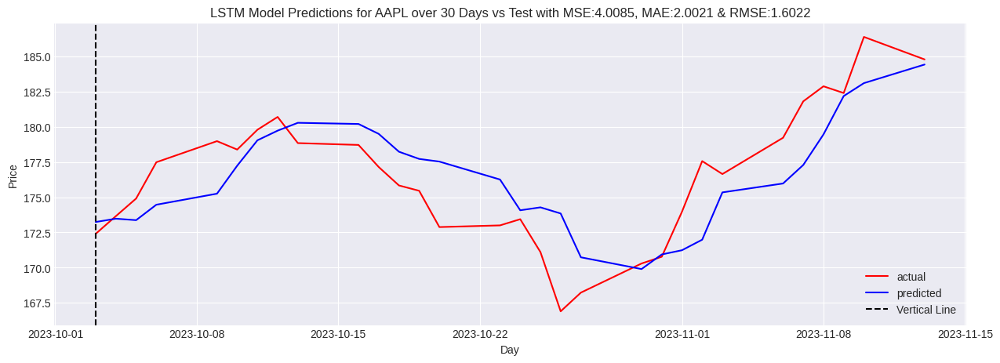

[*********************100%%**********************]  1 of 1 completed


Epoch 1/75
6/6 - 9s - loss: 0.0480 - val_loss: 0.1839 - 9s/epoch - 1s/step
Epoch 2/75
6/6 - 3s - loss: 0.0427 - val_loss: 0.0056 - 3s/epoch - 450ms/step
Epoch 3/75
6/6 - 3s - loss: 0.0225 - val_loss: 0.0125 - 3s/epoch - 444ms/step
Epoch 4/75
6/6 - 3s - loss: 0.0182 - val_loss: 0.0672 - 3s/epoch - 450ms/step
Epoch 5/75
6/6 - 3s - loss: 0.0212 - val_loss: 0.0041 - 3s/epoch - 530ms/step
Epoch 6/75
6/6 - 3s - loss: 0.0143 - val_loss: 0.0369 - 3s/epoch - 535ms/step
Epoch 7/75
6/6 - 3s - loss: 0.0160 - val_loss: 0.0111 - 3s/epoch - 448ms/step
Epoch 8/75
6/6 - 3s - loss: 0.0088 - val_loss: 0.0083 - 3s/epoch - 451ms/step
Epoch 9/75
6/6 - 3s - loss: 0.0070 - val_loss: 0.0137 - 3s/epoch - 445ms/step
Epoch 10/75
6/6 - 4s - loss: 0.0053 - val_loss: 0.0041 - 4s/epoch - 617ms/step
Epoch 11/75
6/6 - 3s - loss: 0.0048 - val_loss: 0.0102 - 3s/epoch - 459ms/step
Epoch 12/75
6/6 - 3s - loss: 0.0048 - val_loss: 0.0041 - 3s/epoch - 449ms/step
Epoch 13/75
6/6 - 3s - loss: 0.0044 - val_loss: 0.0092 - 3s/epoc

<ipython-input-42-829f71aa44ab>:173: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


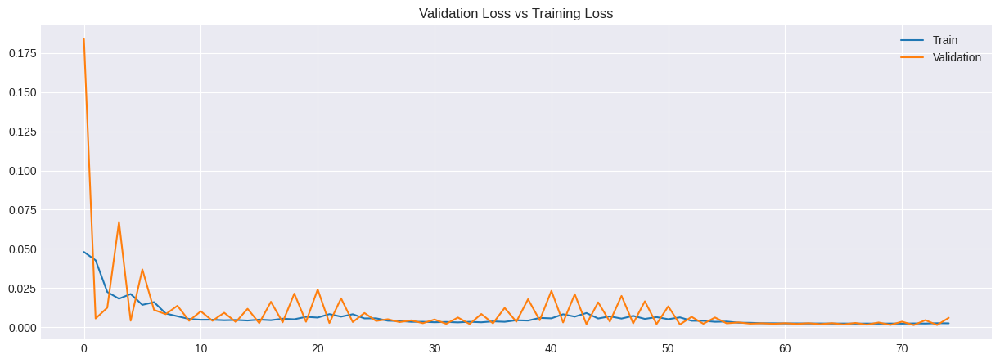

1/1 [==============================] - 1s 966ms/step


<ipython-input-42-829f71aa44ab>:205: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


<Figure size 640x480 with 0 Axes>

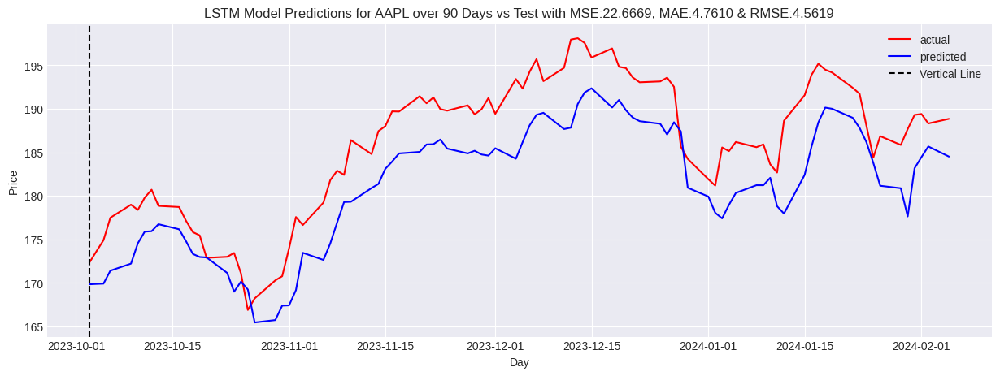

[*********************100%%**********************]  1 of 1 completed


Epoch 1/75
6/6 - 6s - loss: 0.0766 - val_loss: 0.0350 - 6s/epoch - 973ms/step
Epoch 2/75
6/6 - 1s - loss: 0.0217 - val_loss: 0.0228 - 1s/epoch - 245ms/step
Epoch 3/75
6/6 - 1s - loss: 0.0312 - val_loss: 0.0535 - 1s/epoch - 244ms/step
Epoch 4/75
6/6 - 1s - loss: 0.0155 - val_loss: 0.0150 - 1s/epoch - 244ms/step
Epoch 5/75
6/6 - 2s - loss: 0.0124 - val_loss: 0.0157 - 2s/epoch - 331ms/step
Epoch 6/75
6/6 - 2s - loss: 0.0073 - val_loss: 0.0099 - 2s/epoch - 322ms/step
Epoch 7/75
6/6 - 1s - loss: 0.0070 - val_loss: 0.0075 - 1s/epoch - 246ms/step
Epoch 8/75
6/6 - 2s - loss: 0.0058 - val_loss: 0.0080 - 2s/epoch - 252ms/step
Epoch 9/75
6/6 - 1s - loss: 0.0055 - val_loss: 0.0076 - 1s/epoch - 244ms/step
Epoch 10/75
6/6 - 1s - loss: 0.0053 - val_loss: 0.0065 - 1s/epoch - 248ms/step
Epoch 11/75
6/6 - 1s - loss: 0.0051 - val_loss: 0.0062 - 1s/epoch - 243ms/step
Epoch 12/75
6/6 - 1s - loss: 0.0048 - val_loss: 0.0059 - 1s/epoch - 243ms/step
Epoch 13/75
6/6 - 2s - loss: 0.0047 - val_loss: 0.0060 - 2s/e

<ipython-input-42-829f71aa44ab>:173: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


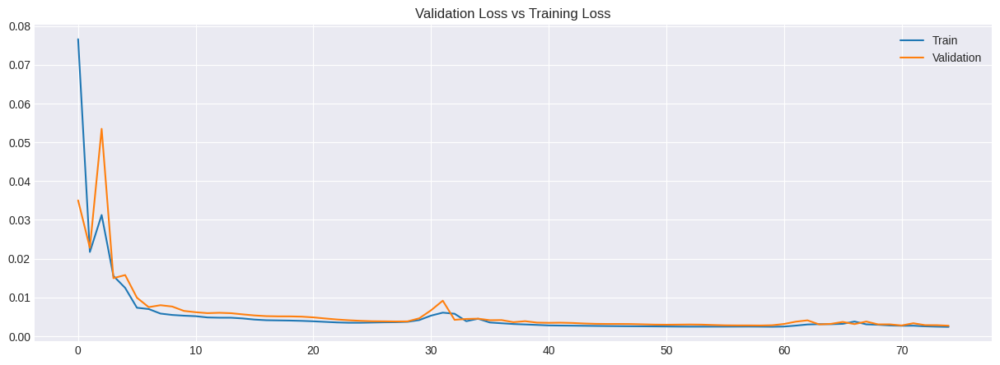

1/1 [==============================] - 1s 882ms/step


<ipython-input-42-829f71aa44ab>:205: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


<Figure size 640x480 with 0 Axes>

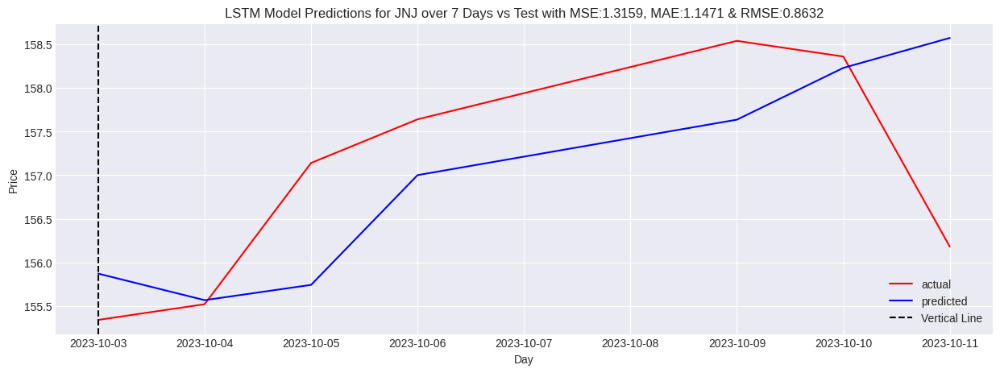

[*********************100%%**********************]  1 of 1 completed


Epoch 1/75
6/6 - 6s - loss: 0.0744 - val_loss: 0.0288 - 6s/epoch - 1s/step
Epoch 2/75
6/6 - 2s - loss: 0.0209 - val_loss: 0.0230 - 2s/epoch - 252ms/step
Epoch 3/75
6/6 - 2s - loss: 0.0364 - val_loss: 0.0592 - 2s/epoch - 259ms/step
Epoch 4/75
6/6 - 2s - loss: 0.0181 - val_loss: 0.0161 - 2s/epoch - 255ms/step
Epoch 5/75
6/6 - 2s - loss: 0.0155 - val_loss: 0.0188 - 2s/epoch - 258ms/step
Epoch 6/75
6/6 - 1s - loss: 0.0100 - val_loss: 0.0107 - 1s/epoch - 249ms/step
Epoch 7/75
6/6 - 2s - loss: 0.0119 - val_loss: 0.0090 - 2s/epoch - 337ms/step
Epoch 8/75
6/6 - 2s - loss: 0.0089 - val_loss: 0.0085 - 2s/epoch - 333ms/step
Epoch 9/75
6/6 - 2s - loss: 0.0109 - val_loss: 0.0073 - 2s/epoch - 261ms/step
Epoch 10/75
6/6 - 2s - loss: 0.0081 - val_loss: 0.0070 - 2s/epoch - 257ms/step
Epoch 11/75
6/6 - 2s - loss: 0.0093 - val_loss: 0.0067 - 2s/epoch - 257ms/step
Epoch 12/75
6/6 - 1s - loss: 0.0066 - val_loss: 0.0065 - 1s/epoch - 250ms/step
Epoch 13/75
6/6 - 2s - loss: 0.0069 - val_loss: 0.0063 - 2s/epoc

<ipython-input-42-829f71aa44ab>:173: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


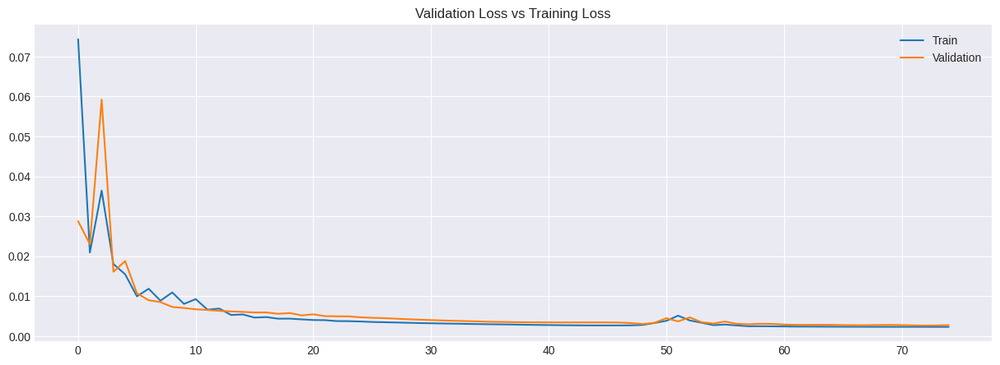

1/1 [==============================] - 1s 1s/step


<ipython-input-42-829f71aa44ab>:205: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


<Figure size 640x480 with 0 Axes>

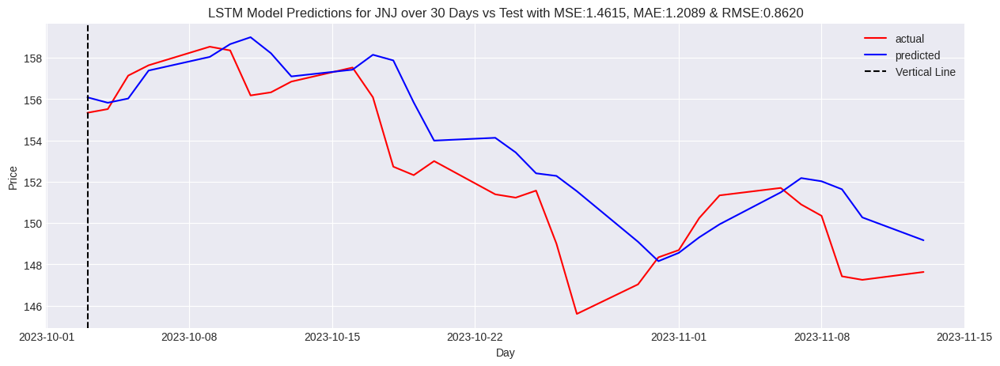

[*********************100%%**********************]  1 of 1 completed


Epoch 1/75
6/6 - 7s - loss: 0.1645 - val_loss: 0.0274 - 7s/epoch - 1s/step
Epoch 2/75
6/6 - 4s - loss: 0.0175 - val_loss: 0.0267 - 4s/epoch - 607ms/step
Epoch 3/75
6/6 - 3s - loss: 0.0306 - val_loss: 0.0254 - 3s/epoch - 475ms/step
Epoch 4/75
6/6 - 3s - loss: 0.0169 - val_loss: 0.0132 - 3s/epoch - 466ms/step
Epoch 5/75
6/6 - 3s - loss: 0.0106 - val_loss: 0.0118 - 3s/epoch - 459ms/step
Epoch 6/75
6/6 - 3s - loss: 0.0127 - val_loss: 0.0129 - 3s/epoch - 539ms/step
Epoch 7/75
6/6 - 3s - loss: 0.0094 - val_loss: 0.0108 - 3s/epoch - 538ms/step
Epoch 8/75
6/6 - 3s - loss: 0.0110 - val_loss: 0.0122 - 3s/epoch - 449ms/step
Epoch 9/75
6/6 - 3s - loss: 0.0085 - val_loss: 0.0100 - 3s/epoch - 455ms/step
Epoch 10/75
6/6 - 3s - loss: 0.0097 - val_loss: 0.0115 - 3s/epoch - 452ms/step
Epoch 11/75
6/6 - 4s - loss: 0.0078 - val_loss: 0.0093 - 4s/epoch - 620ms/step
Epoch 12/75
6/6 - 3s - loss: 0.0087 - val_loss: 0.0110 - 3s/epoch - 455ms/step
Epoch 13/75
6/6 - 3s - loss: 0.0072 - val_loss: 0.0087 - 3s/epoc

<ipython-input-42-829f71aa44ab>:173: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


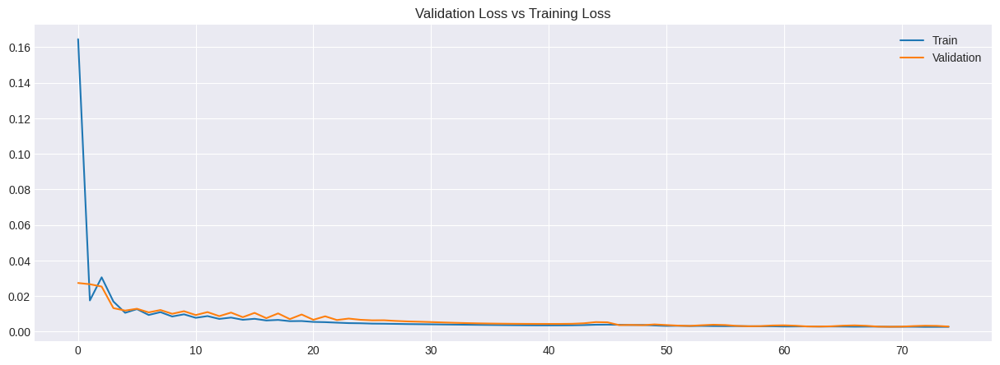

1/1 [==============================] - 1s 1s/step


<ipython-input-42-829f71aa44ab>:205: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


<Figure size 640x480 with 0 Axes>

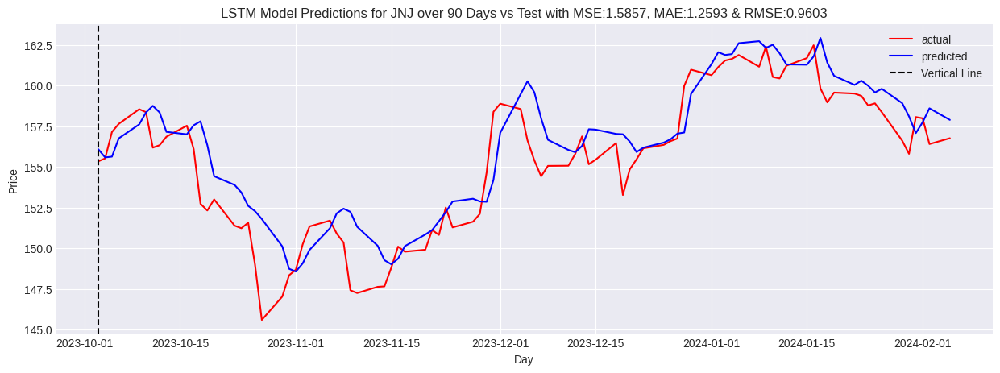

[*********************100%%**********************]  1 of 1 completed


Epoch 1/75
6/6 - 6s - loss: 0.0906 - val_loss: 0.0809 - 6s/epoch - 926ms/step
Epoch 2/75
6/6 - 1s - loss: 0.0947 - val_loss: 0.0121 - 1s/epoch - 246ms/step
Epoch 3/75
6/6 - 2s - loss: 0.0725 - val_loss: 0.0191 - 2s/epoch - 296ms/step
Epoch 4/75
6/6 - 2s - loss: 0.0330 - val_loss: 0.0091 - 2s/epoch - 357ms/step
Epoch 5/75
6/6 - 2s - loss: 0.0143 - val_loss: 0.0125 - 2s/epoch - 264ms/step
Epoch 6/75
6/6 - 1s - loss: 0.0131 - val_loss: 0.0044 - 1s/epoch - 246ms/step
Epoch 7/75
6/6 - 1s - loss: 0.0079 - val_loss: 0.0070 - 1s/epoch - 247ms/step
Epoch 8/75
6/6 - 1s - loss: 0.0101 - val_loss: 0.0037 - 1s/epoch - 248ms/step
Epoch 9/75
6/6 - 1s - loss: 0.0070 - val_loss: 0.0047 - 1s/epoch - 250ms/step
Epoch 10/75
6/6 - 1s - loss: 0.0072 - val_loss: 0.0033 - 1s/epoch - 245ms/step
Epoch 11/75
6/6 - 2s - loss: 0.0051 - val_loss: 0.0031 - 2s/epoch - 266ms/step
Epoch 12/75
6/6 - 2s - loss: 0.0049 - val_loss: 0.0027 - 2s/epoch - 359ms/step
Epoch 13/75
6/6 - 2s - loss: 0.0038 - val_loss: 0.0025 - 2s/e

<ipython-input-42-829f71aa44ab>:173: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


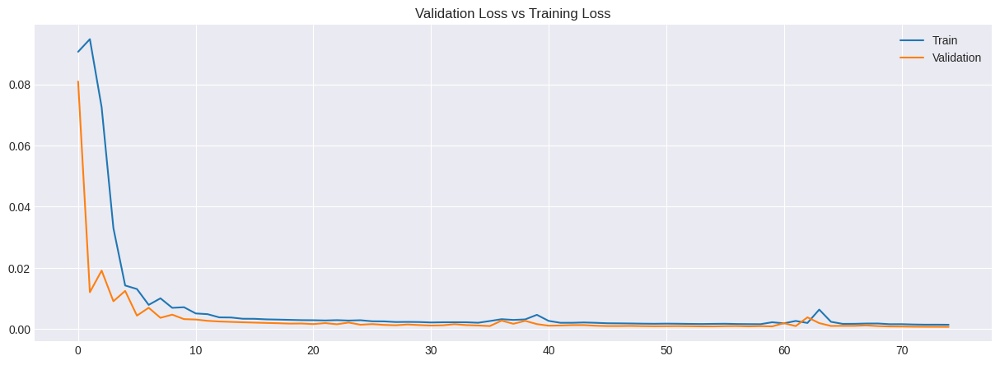

1/1 [==============================] - 1s 1s/step


<ipython-input-42-829f71aa44ab>:205: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


<Figure size 640x480 with 0 Axes>

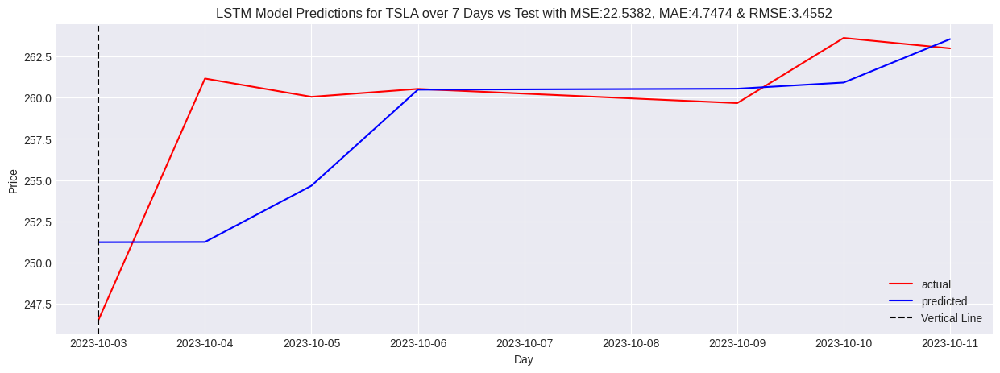

[*********************100%%**********************]  1 of 1 completed


Epoch 1/75
6/6 - 7s - loss: 0.0780 - val_loss: 0.0559 - 7s/epoch - 1s/step
Epoch 2/75
6/6 - 2s - loss: 0.0878 - val_loss: 0.0149 - 2s/epoch - 258ms/step
Epoch 3/75
6/6 - 1s - loss: 0.1058 - val_loss: 0.0249 - 1s/epoch - 248ms/step
Epoch 4/75
6/6 - 2s - loss: 0.0423 - val_loss: 0.0162 - 2s/epoch - 350ms/step
Epoch 5/75
6/6 - 2s - loss: 0.0169 - val_loss: 0.0125 - 2s/epoch - 311ms/step
Epoch 6/75
6/6 - 2s - loss: 0.0149 - val_loss: 0.0049 - 2s/epoch - 252ms/step
Epoch 7/75
6/6 - 1s - loss: 0.0071 - val_loss: 0.0086 - 1s/epoch - 250ms/step
Epoch 8/75
6/6 - 1s - loss: 0.0095 - val_loss: 0.0035 - 1s/epoch - 246ms/step
Epoch 9/75
6/6 - 2s - loss: 0.0077 - val_loss: 0.0092 - 2s/epoch - 255ms/step
Epoch 10/75
6/6 - 2s - loss: 0.0103 - val_loss: 0.0032 - 2s/epoch - 252ms/step
Epoch 11/75
6/6 - 2s - loss: 0.0091 - val_loss: 0.0042 - 2s/epoch - 251ms/step
Epoch 12/75
6/6 - 2s - loss: 0.0104 - val_loss: 0.0024 - 2s/epoch - 350ms/step
Epoch 13/75
6/6 - 2s - loss: 0.0057 - val_loss: 0.0025 - 2s/epoc

<ipython-input-42-829f71aa44ab>:173: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


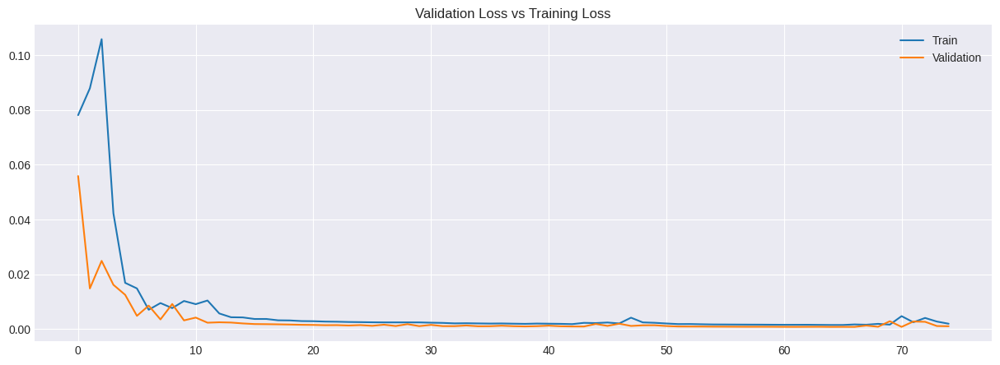

1/1 [==============================] - 1s 952ms/step


<ipython-input-42-829f71aa44ab>:205: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


<Figure size 640x480 with 0 Axes>

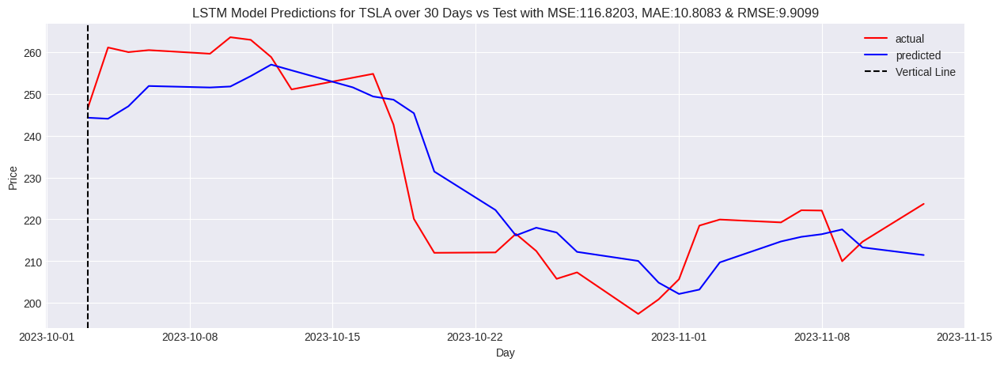

[*********************100%%**********************]  1 of 1 completed


Epoch 1/75
6/6 - 8s - loss: 0.1119 - val_loss: 0.0191 - 8s/epoch - 1s/step
Epoch 2/75
6/6 - 3s - loss: 0.0225 - val_loss: 0.0682 - 3s/epoch - 452ms/step
Epoch 3/75
6/6 - 3s - loss: 0.0798 - val_loss: 0.0047 - 3s/epoch - 450ms/step
Epoch 4/75
6/6 - 3s - loss: 0.0175 - val_loss: 0.0186 - 3s/epoch - 450ms/step
Epoch 5/75
6/6 - 4s - loss: 0.0334 - val_loss: 0.0033 - 4s/epoch - 607ms/step
Epoch 6/75
6/6 - 3s - loss: 0.0143 - val_loss: 0.0031 - 3s/epoch - 447ms/step
Epoch 7/75
6/6 - 3s - loss: 0.0094 - val_loss: 0.0061 - 3s/epoch - 442ms/step
Epoch 8/75
6/6 - 3s - loss: 0.0080 - val_loss: 0.0031 - 3s/epoch - 444ms/step
Epoch 9/75
6/6 - 3s - loss: 0.0067 - val_loss: 0.0026 - 3s/epoch - 512ms/step
Epoch 10/75
6/6 - 3s - loss: 0.0062 - val_loss: 0.0026 - 3s/epoch - 551ms/step
Epoch 11/75
6/6 - 3s - loss: 0.0047 - val_loss: 0.0024 - 3s/epoch - 449ms/step
Epoch 12/75
6/6 - 3s - loss: 0.0043 - val_loss: 0.0023 - 3s/epoch - 445ms/step
Epoch 13/75
6/6 - 3s - loss: 0.0043 - val_loss: 0.0021 - 3s/epoc

<ipython-input-42-829f71aa44ab>:173: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


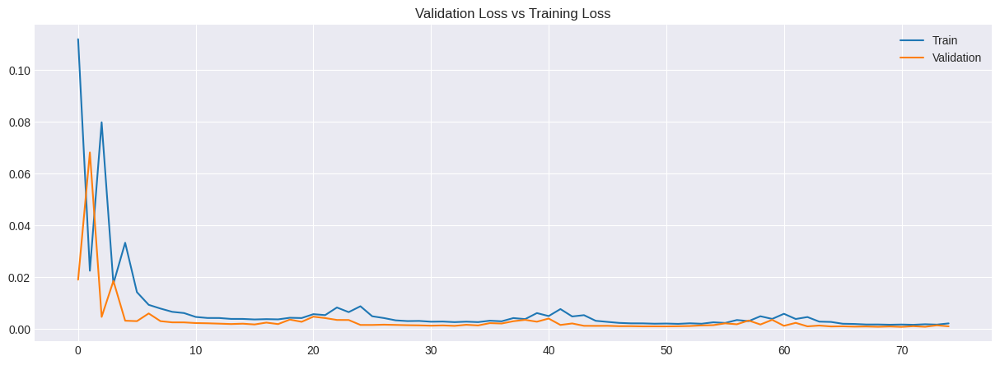

1/1 [==============================] - 1s 961ms/step


<ipython-input-42-829f71aa44ab>:205: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


<Figure size 640x480 with 0 Axes>

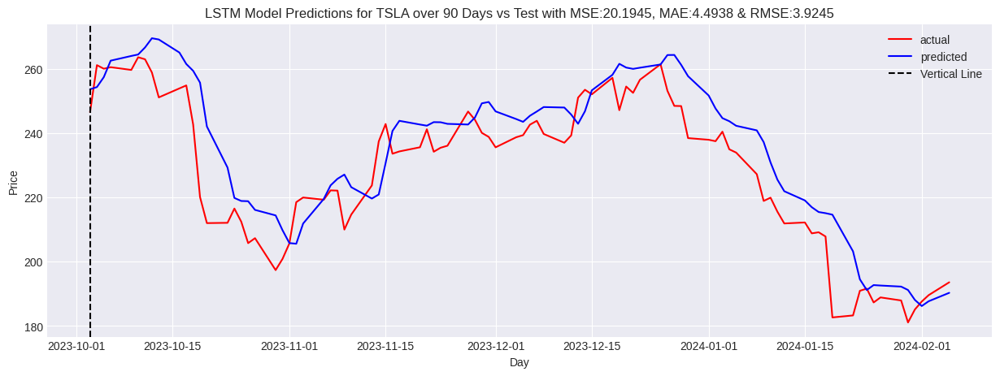

In [83]:
_7_Day_Results.append(ANN_1('AAPL', "2021-01-01", "2024-03-28", 7))
_30_Day_Results.append(ANN_1('AAPL', "2021-01-01", "2024-03-28", 30))
_90_Day_Results.append(ANN_1('AAPL', "2021-01-01", "2024-03-28", 90))
_7_Day_Results.append(ANN_1('JNJ', "2021-01-01", "2024-03-28", 7))
_30_Day_Results.append(ANN_1('JNJ', "2021-01-01", "2024-03-28", 30))
_90_Day_Results.append(ANN_1('JNJ', "2021-01-01", "2024-03-28", 90))
_7_Day_Results.append(ANN_1('TSLA', "2021-01-01", "2024-03-28", 7))
_30_Day_Results.append(ANN_1('TSLA', "2021-01-01", "2024-03-28", 30))
_90_Day_Results.append(ANN_1('TSLA', "2021-01-01", "2024-03-28", 90))

_7_Day_Results.append(random_forest("AAPL", '2021-01-01', '2024-03-28', 7))
_30_Day_Results.append(random_forest("AAPL", '2021-01-01', '2024-03-28', 30))
_90_Day_Results.append(random_forest("AAPL", '2021-01-01', '2024-03-28', 90))
_7_Day_Results.append(random_forest("TSLA", '2021-01-01', '2024-03-28', 7))
_30_Day_Results.append(random_forest("TSLA", '2021-01-01', '2024-03-28', 30))
_90_Day_Results.append(random_forest("TSLA", '2021-01-01', '2024-03-28', 90))
_7_Day_Results.append(random_forest("JNJ", '2021-01-01', '2024-03-28', 7))
_30_Day_Results.append(random_forest("JNJ", '2021-01-01', '2024-03-28', 30))
_90_Day_Results.append(random_forest("JNJ", '2021-01-01', '2024-03-28', 90))

_7_Day_Results.append(Linear_Reg('AAPL', '2021-01-01', '2024-03-28', 7))
_30_Day_Results.append(Linear_Reg('AAPL', '2021-01-01', '2024-03-28', 30))
_90_Day_Results.append(Linear_Reg('AAPL', '2021-01-01', '2024-03-28', 90))
_7_Day_Results.append(Linear_Reg("TSLA", '2021-01-01', '2024-03-28', 7))
_30_Day_Results.append(Linear_Reg("TSLA", '2021-01-01', '2024-03-28', 30))
_90_Day_Results.append(Linear_Reg("TSLA", '2021-01-01', '2024-03-28', 90))
_7_Day_Results.append(Linear_Reg("JNJ", '2021-01-01', '2024-03-28', 7))
_30_Day_Results.append(Linear_Reg("JNJ", '2021-01-01', '2024-03-28', 30))
_90_Day_Results.append(Linear_Reg("JNJ", '2021-01-01', '2024-03-28', 90))


_7_Day_Results.append(SVR_Linear_model('AAPL', '2021-01-01', '2023-03-28', 7))
_30_Day_Results.append(SVR_Linear_model('AAPL', '2021-01-01', '2023-03-28', 30))
_90_Day_Results.append(SVR_Linear_model('AAPL', '2021-01-01', '2024-03-28', 90))
_7_Day_Results.append(SVR_Linear_model("TSLA", '2021-01-01', '2024-03-28', 7))
_30_Day_Results.append(SVR_Linear_model("TSLA", '2021-01-01', '2024-03-28', 30))
_90_Day_Results.append(SVR_Linear_model("TSLA", '2021-01-01', '2024-03-28', 90))
_7_Day_Results.append(SVR_Linear_model("JNJ", '2021-01-01', '2024-03-28', 7))
_30_Day_Results.append(SVR_Linear_model("JNJ", '2021-01-01', '2024-03-28', 30))
_90_Day_Results.append(SVR_Linear_model("JNJ", '2021-01-01', '2024-03-28', 90))

_7_Day_Results.append(Ridge_Reg('AAPL', '2021-01-01', '2024-03-28', 7))
_30_Day_Results.append(Ridge_Reg('AAPL', '2021-01-01', '2024-03-28', 30))
_90_Day_Results.append(Ridge_Reg('AAPL', '2021-01-01', '2024-03-28', 90))
_7_Day_Results.append(Ridge_Reg("TSLA", '2021-01-01', '2024-03-28', 7))
_30_Day_Results.append(Ridge_Reg("TSLA", '2021-01-01', '2024-03-28', 30))
_90_Day_Results.append(Ridge_Reg("TSLA", '2021-01-01', '2024-03-28', 90))
_7_Day_Results.append(Ridge_Reg("JNJ", '2021-01-01', '2024-03-28', 7))
_30_Day_Results.append(Ridge_Reg("JNJ", '2021-01-01', '2024-03-28', 30))
_90_Day_Results.append(Ridge_Reg("JNJ", '2021-01-01', '2024-03-28', 90))

_7_Day_Results.append(Naive('AAPL', "2021-01-01", "2024-03-28", 7))
_30_Day_Results.append(Naive('AAPL', "2021-01-01", "2024-03-28", 30))
_90_Day_Results.append(Naive('AAPL', "2021-01-01", "2024-03-28", 90))
_7_Day_Results.append(Naive('JNJ', "2021-01-01", "2024-03-28", 7))
_30_Day_Results.append(Naive('JNJ', "2021-01-01", "2024-03-28", 30))
_90_Day_Results.append(Naive('JNJ', "2021-01-01", "2024-03-28", 90))
_7_Day_Results.append(Naive('TSLA', "2021-01-01", "2024-03-28", 7))
_30_Day_Results.append(Naive('TSLA', "2021-01-01", "2024-03-28", 30))
_90_Day_Results.append(Naive('TSLA', "2021-01-01", "2024-03-28", 90))

_7_Day_Results.append(ARIMA_MODEL('AAPL', '2021-01-01', '2024-03-28', 15, 1, 5, 7))
_30_Day_Results.append(ARIMA_MODEL('AAPL', '2021-01-01', '2024-03-28', 3, 1, 20, 30))
_90_Day_Results.append(ARIMA_MODEL('AAPL', '2021-01-01', '2024-03-28', 3, 1, 20, 90))
_7_Day_Results.append(ARIMA_MODEL('JNJ', '2021-01-01', '2024-03-28', 12, 1, 25, 7))
_30_Day_Results.append(ARIMA_MODEL('JNJ', '2021-01-01', '2024-03-28', 3, 1, 5, 30))
_90_Day_Results.append(ARIMA_MODEL('JNJ', '2021-01-01', '2024-03-28', 9, 1, 1, 90))
_7_Day_Results.append(ARIMA_MODEL('TSLA', '2021-01-01', '2024-03-28', 3, 1, 15, 7))
_30_Day_Results.append(ARIMA_MODEL('TSLA', '2021-01-01', '2024-03-28', 9, 1, 20, 30))
_90_Day_Results.append(ARIMA_MODEL('TSLA', '2021-01-01', '2024-03-28', 9, 1, 20, 90))

_7_Day_Results.append(rnn("AAPL", '2021-01-01', '2024-03-28', 7))
_30_Day_Results.append(rnn("AAPL", '2021-01-01', '2024-03-28', 30))
_90_Day_Results.append(rnn("AAPL", '2021-01-01', '2024-03-28', 90))
_7_Day_Results.append(rnn("TSLA", '2021-01-01', '2024-03-28', 7))
_30_Day_Results.append(rnn("TSLA", '2021-01-01', '2024-03-28', 30))
_90_Day_Results.append(rnn("TSLA", '2021-01-01', '2024-03-28', 90))
_7_Day_Results.append(rnn("JNJ", '2021-01-01', '2024-03-28', 7))
_30_Day_Results.append(rnn("JNJ", '2021-01-01', '2024-03-28', 30))
_90_Day_Results.append(rnn("JNJ", '2021-01-01', '2024-03-28', 90))

_7_Day_Results.append(cnn("AAPL", '2021-01-01', '2024-03-28', 7))
_30_Day_Results.append(cnn("AAPL", '2021-01-01', '2024-03-28', 30))
_90_Day_Results.append(cnn("AAPL", '2021-01-01', '2024-03-28', 90))
_7_Day_Results.append(cnn("TSLA", '2021-01-01', '2024-03-28', 7))
_30_Day_Results.append(cnn("TSLA", '2021-01-01', '2024-03-28', 30))
_90_Day_Results.append(cnn("TSLA", '2021-01-01', '2024-03-28', 90))
_7_Day_Results.append(cnn("JNJ", '2021-01-01', '2024-03-28', 7))
_30_Day_Results.append(cnn("JNJ", '2021-01-01', '2024-03-28', 30))
_90_Day_Results.append(cnn("JNJ", '2021-01-01', '2024-03-28', 90))

_7_Day_Results.append(LSTM_MODEL('AAPL', "2021-01-01", "2024-03-28", 64, 14, 75, 7))
_30_Day_Results.append(LSTM_MODEL('AAPL', "2021-01-01", "2024-03-28", 64, 14, 75, 30))
_90_Day_Results.append(LSTM_MODEL('AAPL', "2021-01-01", "2024-03-28", 64, 10, 75, 90))
_7_Day_Results.append(LSTM_MODEL('JNJ', "2021-01-01", "2024-03-28", 64, 14, 75, 7))
_30_Day_Results.append(LSTM_MODEL('JNJ', "2021-01-01", "2024-03-28", 64, 14, 75, 30))
_90_Day_Results.append(LSTM_MODEL('JNJ', "2021-01-01", "2024-03-28", 64, 10, 75, 90))
_7_Day_Results.append(LSTM_MODEL('TSLA', "2021-01-01", "2024-03-28", 64, 14, 75, 7))
_30_Day_Results.append(LSTM_MODEL('TSLA', "2021-01-01", "2024-03-28", 64, 14, 75, 30))
_90_Day_Results.append(LSTM_MODEL('TSLA', "2021-01-01", "2024-03-28", 64, 10, 75, 90))

_7_Day_Results.append(stateful_LSTM('AAPL', '2021-01-01', '2024-03-28', 4, 75, 7))
_30_Day_Results.append(stateful_LSTM('AAPL', '2021-01-01', '2024-03-28', 4, 75, 30))
_90_Day_Results.append(stateful_LSTM('AAPL', '2021-01-01', '2024-03-28', 8, 75, 90))
_7_Day_Results.append(stateful_LSTM('JNJ', '2021-01-01', '2024-03-28', 4, 75, 7))
_30_Day_Results.append(stateful_LSTM('JNJ', '2021-01-01', '2024-03-28', 4, 75, 30))
_90_Day_Results.append(stateful_LSTM('JNJ', '2021-01-01', '2024-03-28', 8, 75, 90))
_7_Day_Results.append(stateful_LSTM('TSLA', '2021-01-01', '2024-03-28', 4, 75, 7))
_30_Day_Results.append(stateful_LSTM('TSLA', '2021-01-01', '2024-03-28', 4, 75, 30))
_90_Day_Results.append(stateful_LSTM('TSLA', '2021-01-01', '2024-03-28', 8, 75, 90))

Results across prediction periods

In [84]:
_7_Day_Results = pd.DataFrame(_7_Day_Results)
_30_Day_Results = pd.DataFrame(_30_Day_Results)
_90_Day_Results = pd.DataFrame(_90_Day_Results)

Total Results

In [85]:
Results = pd.concat([_7_Day_Results, _30_Day_Results, _90_Day_Results])
pd.DataFrame(Results)

,Stock,Model,Prediction Period,Test MSE,Test RMSE,Test MAE
0,AAPL,ANN,7,2.545904,1.595589,1.392543
1,JNJ,ANN,7,1.004774,1.002384,0.906468
2,TSLA,ANN,7,36.532836,6.044240,5.362187
3,AAPL,Random Forest,7,0.917884,0.958063,0.848371
4,TSLA,Random Forest,7,35.539939,5.961538,4.350462
5,JNJ,Random Forest,7,0.332837,0.576920,0.381726
6,AAPL,Linear Regression,7,0.315192,0.561419,0.524879
7,TSLA,Linear Regression,7,12.180067,3.489995,2.513077
8,JNJ,Linear Regression,7,0.175830,0.419321,0.349457
9,AAPL,SVR Linear,7,3.502532,1.871505,1.386389


In [86]:
overall_results = Results.groupby('Model')['Test RMSE'].mean()
overall_results = pd.DataFrame(overall_results)

7 Day Results DataFrame

In [87]:
_7_Day_Results

,Stock,Model,Prediction Period,Test MSE,Test RMSE,Test MAE
0,AAPL,ANN,7,2.545904,1.595589,1.392543
1,JNJ,ANN,7,1.004774,1.002384,0.906468
2,TSLA,ANN,7,36.532836,6.044240,5.362187
3,AAPL,Random Forest,7,0.917884,0.958063,0.848371
4,TSLA,Random Forest,7,35.539939,5.961538,4.350462
5,JNJ,Random Forest,7,0.332837,0.576920,0.381726
6,AAPL,Linear Regression,7,0.315192,0.561419,0.524879
7,TSLA,Linear Regression,7,12.180067,3.489995,2.513077
8,JNJ,Linear Regression,7,0.175830,0.419321,0.349457
9,AAPL,SVR Linear,7,3.502532,1.871505,1.386389


30 Day Results Dataframe

In [88]:
_30_Day_Results

,Stock,Model,Prediction Period,Test MSE,Test RMSE,Test MAE
0,AAPL,ANN,30,1.845365,1.358442,1.214815
1,JNJ,ANN,30,0.534143,0.730851,0.598848
2,TSLA,ANN,30,12.332865,3.511818,2.925068
3,AAPL,Random Forest,30,3.444151,1.855842,1.415891
4,TSLA,Random Forest,30,32.252549,5.679133,3.998469
5,JNJ,Random Forest,30,4.211928,2.052298,1.383191
6,AAPL,Linear Regression,30,1.085219,1.041738,0.738350
7,TSLA,Linear Regression,30,9.095506,3.015876,2.276983
8,JNJ,Linear Regression,30,0.250463,0.500463,0.376462
9,AAPL,SVR Linear,30,2.550932,1.597164,1.161986


90 Day Results Dataframe

In [89]:
_90_Day_Results

,Stock,Model,Prediction Period,Test MSE,Test RMSE,Test MAE
0,AAPL,ANN,90,3.963225,1.990785,1.710516
1,JNJ,ANN,90,1.023547,1.011705,0.781636
2,TSLA,ANN,90,14.995369,3.872385,3.107380
3,AAPL,Random Forest,90,69.922901,8.361991,6.662541
4,TSLA,Random Forest,90,23.839399,4.882561,3.537571
5,JNJ,Random Forest,90,2.012591,1.418658,0.886188
6,AAPL,Linear Regression,90,1.348390,1.161202,0.872042
7,TSLA,Linear Regression,90,7.875014,2.806245,2.033657
8,JNJ,Linear Regression,90,0.329790,0.574273,0.421799
9,AAPL,SVR Linear,90,2.149524,1.466126,0.986302


#**Visualisations**

# **Performance across different shares**

Compare the performance across different shares

In [90]:
apple_7_day = _7_Day_Results[_7_Day_Results['Stock'] == 'AAPL']
apple_30_day = _30_Day_Results[_30_Day_Results['Stock'] == 'AAPL']
apple_90_day = _90_Day_Results[_90_Day_Results['Stock'] == 'AAPL']
JNJ_7_day = _7_Day_Results[_7_Day_Results['Stock'] == 'JNJ']
JNJ_30_day = _30_Day_Results[_30_Day_Results['Stock'] == 'JNJ']
JNJ_90_day = _90_Day_Results[_90_Day_Results['Stock'] == 'JNJ']
TSLA_7_day = _7_Day_Results[_7_Day_Results['Stock'] == 'TSLA']
TSLA_30_day = _30_Day_Results[_30_Day_Results['Stock'] == 'TSLA']
TSLA_90_day = _90_Day_Results[_90_Day_Results['Stock'] == 'TSLA']

**Apple**

Text(0.5, 1.0, 'Model Comparison over 7 Day Prediction Period')

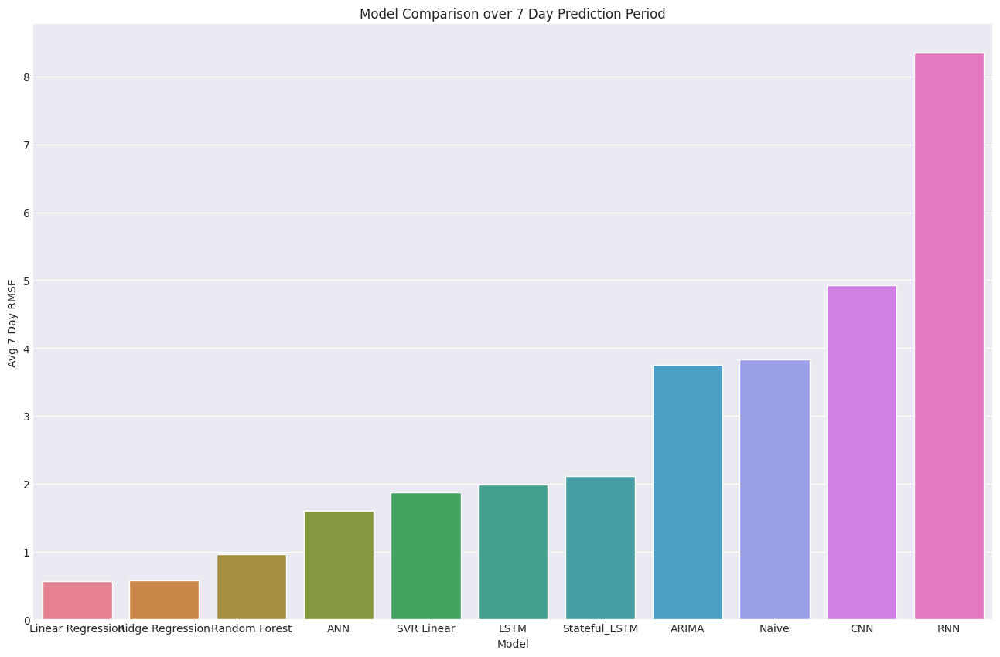

In [91]:
sns.set_style("darkgrid")
plt.figure(figsize=(16,10))
#plt.axvline(x=pd.to_datetime('2023-10-03'), color='black', linestyle='--', label='Vertical Line')
Avg_7_Day = apple_7_day.groupby('Model')['Test RMSE'].mean().sort_values(ascending=True)
bp = sns.barplot(y=Avg_7_Day.values, x=Avg_7_Day.index, hue=Avg_7_Day.index, palette='husl') #plot this
bp.set(ylabel="Avg 7 Day RMSE", xlabel="Model") #set labels
plt.title("Model Comparison over 7 Day Prediction Period")

Text(0.5, 1.0, 'Model Comparison over 30 Day Prediction Period')

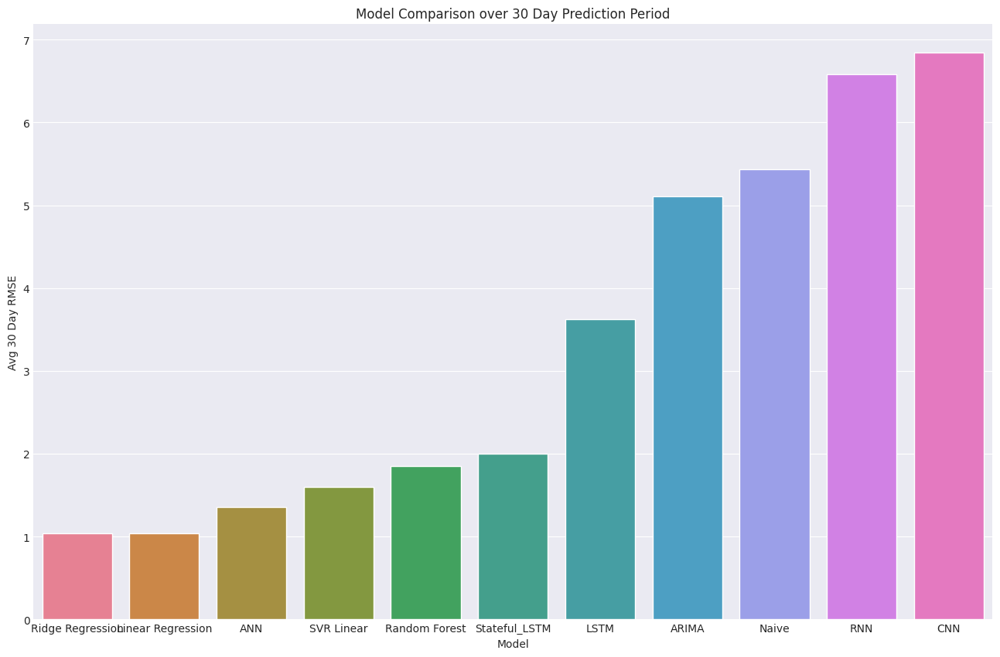

In [92]:
sns.set_style("darkgrid")
plt.figure(figsize=(16,10))
#plt.axvline(x=pd.to_datetime('2023-10-03'), color='black', linestyle='--', label='Vertical Line')
Avg_30_Day = apple_30_day.groupby('Model')['Test RMSE'].mean().sort_values(ascending=True)
bp = sns.barplot(y=Avg_30_Day.values, x=Avg_30_Day.index, hue=Avg_30_Day.index, palette='husl') #plot this
bp.set(ylabel="Avg 30 Day RMSE", xlabel="Model") #set labels
plt.title("Model Comparison over 30 Day Prediction Period")

Text(0.5, 1.0, 'Model Comparison over 90 Day Prediction Period')

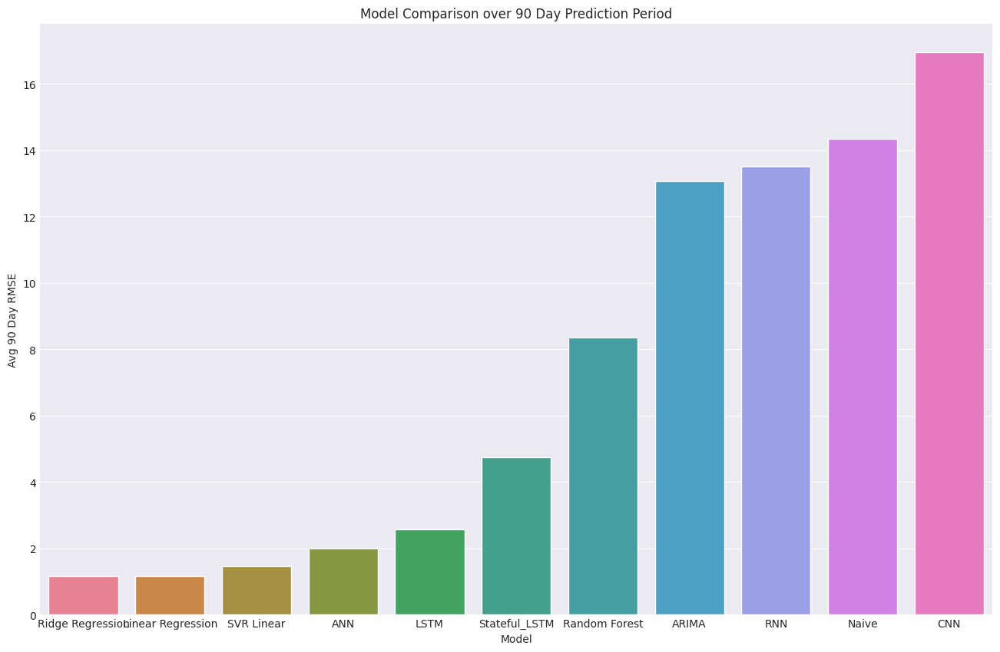

In [93]:
sns.set_style("darkgrid")
plt.figure(figsize=(16,10))
#plt.axvline(x=pd.to_datetime('2023-10-03'), color='black', linestyle='--', label='Vertical Line')
Avg_90_Day = apple_90_day.groupby('Model')['Test RMSE'].mean().sort_values(ascending=True)
bp = sns.barplot(y=Avg_90_Day.values, x=Avg_90_Day.index, hue=Avg_90_Day.index, palette='husl') #plot this
bp.set(ylabel="Avg 90 Day RMSE", xlabel="Model") #set labels
plt.title("Model Comparison over 90 Day Prediction Period")

Johnson & Johnson

Text(0.5, 1.0, 'Model Comparison over 7 Day Prediction Period')

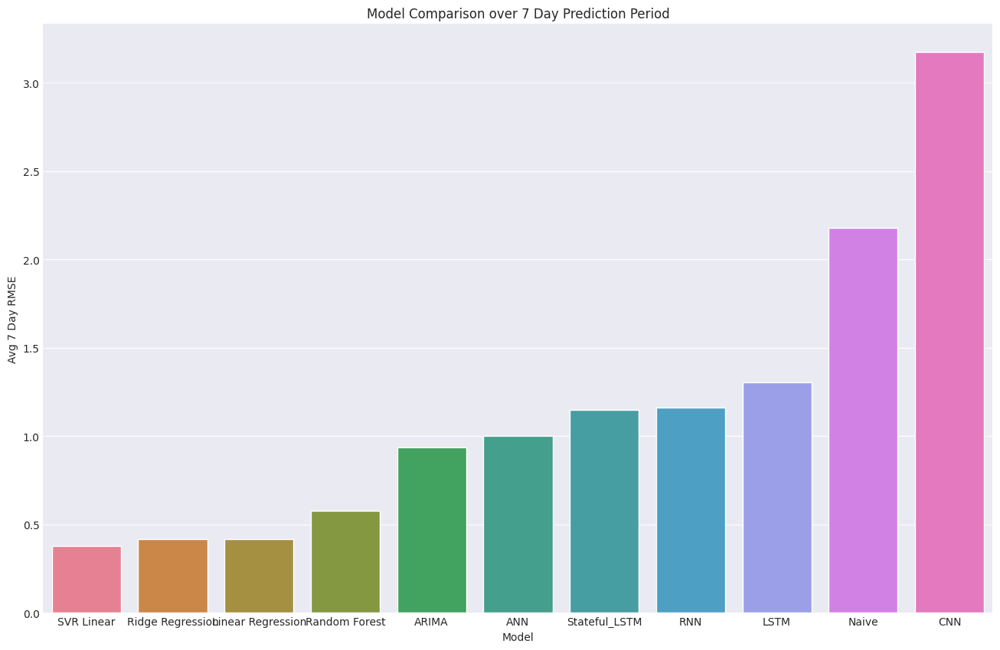

In [94]:
sns.set_style("darkgrid")
plt.figure(figsize=(16,10))
#plt.axvline(x=pd.to_datetime('2023-10-03'), color='black', linestyle='--', label='Vertical Line')
Avg_7_Day = JNJ_7_day.groupby('Model')['Test RMSE'].mean().sort_values(ascending=True)
bp = sns.barplot(y=Avg_7_Day.values, x=Avg_7_Day.index, hue=Avg_7_Day.index, palette='husl') #plot this
bp.set(ylabel="Avg 7 Day RMSE", xlabel="Model") #set labels
plt.title("Model Comparison over 7 Day Prediction Period")

Text(0.5, 1.0, 'Model Comparison over 30 Day Prediction Period')

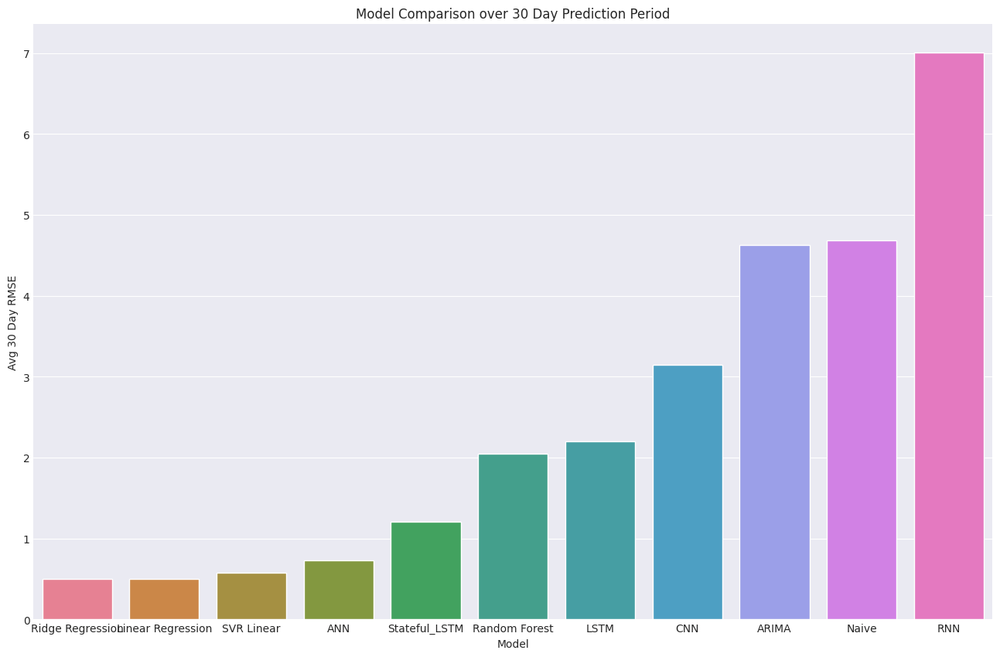

In [95]:
sns.set_style("darkgrid")
plt.figure(figsize=(16,10))
#plt.axvline(x=pd.to_datetime('2023-10-03'), color='black', linestyle='--', label='Vertical Line')
Avg_30_Day = JNJ_30_day.groupby('Model')['Test RMSE'].mean().sort_values(ascending=True)
bp = sns.barplot(y=Avg_30_Day.values, x=Avg_30_Day.index, hue=Avg_30_Day.index, palette='husl') #plot this
bp.set(ylabel="Avg 30 Day RMSE", xlabel="Model") #set labels
plt.title("Model Comparison over 30 Day Prediction Period")

Text(0.5, 1.0, 'Model Comparison over 90 Day Prediction Period')

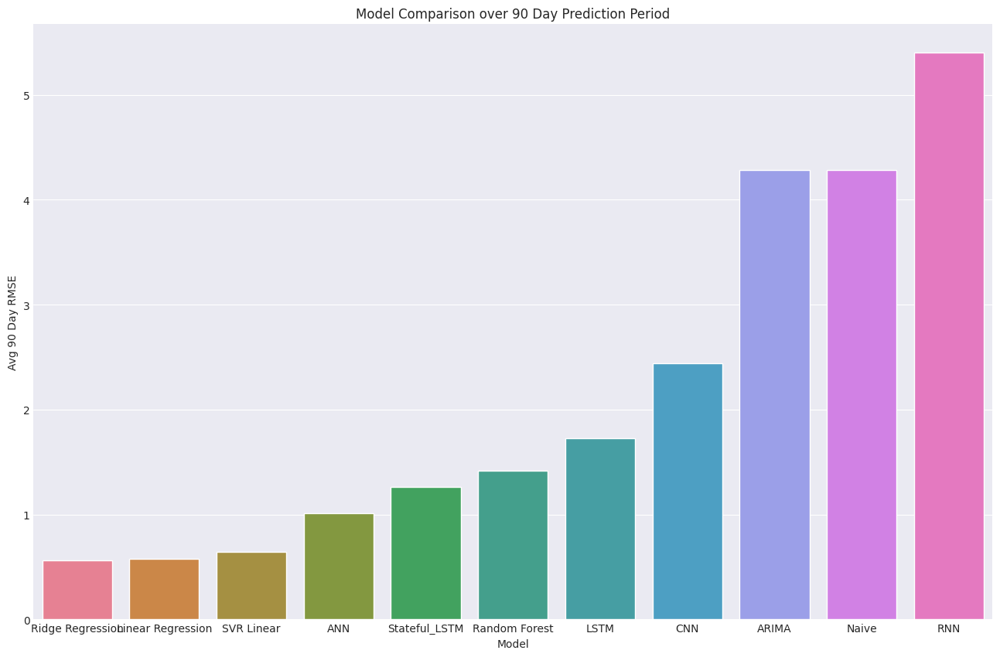

In [96]:
sns.set_style("darkgrid")
plt.figure(figsize=(16,10))
#plt.axvline(x=pd.to_datetime('2023-10-03'), color='black', linestyle='--', label='Vertical Line')
Avg_90_Day = JNJ_90_day.groupby('Model')['Test RMSE'].mean().sort_values(ascending=True)
bp = sns.barplot(y=Avg_90_Day.values, x=Avg_90_Day.index, hue=Avg_90_Day.index, palette='husl') #plot this
bp.set(ylabel="Avg 90 Day RMSE", xlabel="Model") #set labels
plt.title("Model Comparison over 90 Day Prediction Period")

Tesla

Text(0.5, 1.0, 'Model Comparison over 7 Day Prediction Period')

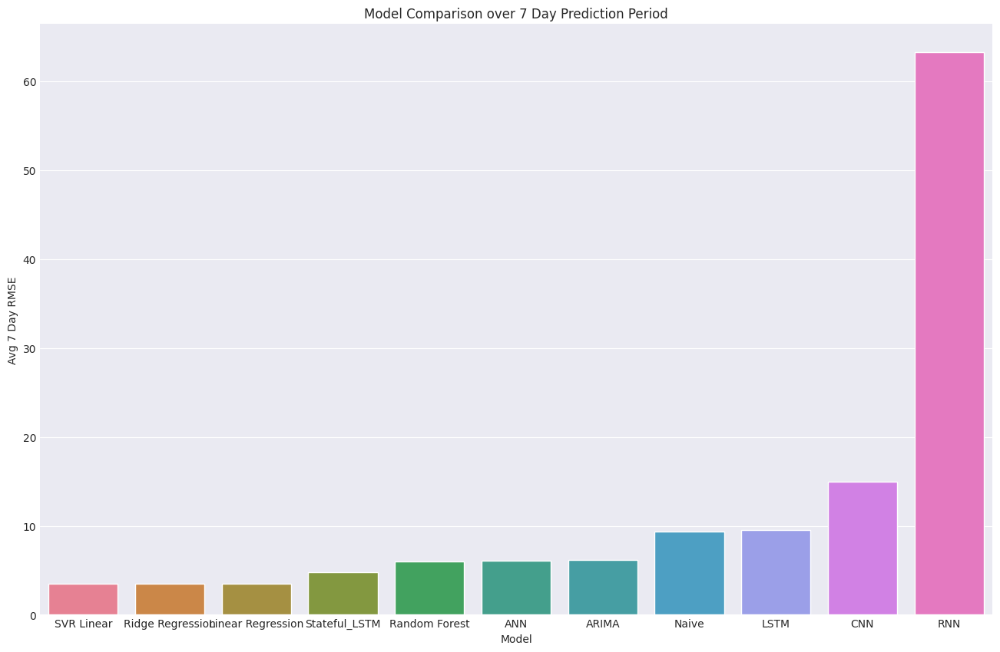

In [97]:
sns.set_style("darkgrid")
plt.figure(figsize=(16,10))
#plt.axvline(x=pd.to_datetime('2023-10-03'), color='black', linestyle='--', label='Vertical Line')
Avg_7_Day = TSLA_7_day.groupby('Model')['Test RMSE'].mean().sort_values(ascending=True)
bp = sns.barplot(y=Avg_7_Day.values, x=Avg_7_Day.index, hue=Avg_7_Day.index, palette='husl') #plot this
bp.set(ylabel="Avg 7 Day RMSE", xlabel="Model") #set labels
plt.title("Model Comparison over 7 Day Prediction Period")

Text(0.5, 1.0, 'Model Comparison over 30 Day Prediction Period')

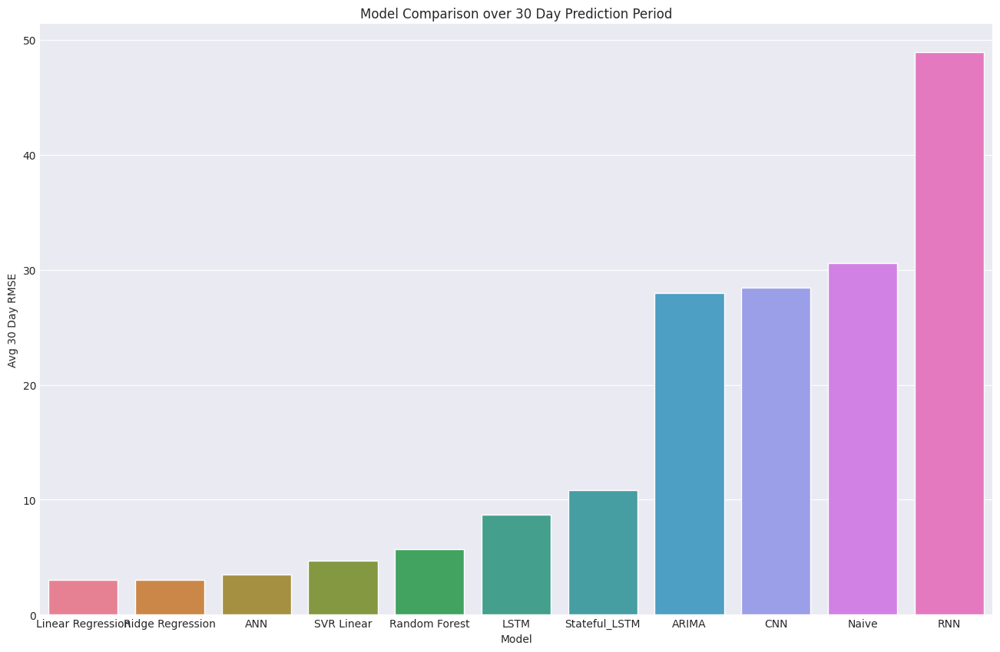

In [98]:
sns.set_style("darkgrid")
plt.figure(figsize=(16,10))
#plt.axvline(x=pd.to_datetime('2023-10-03'), color='black', linestyle='--', label='Vertical Line')
Avg_30_Day = TSLA_30_day.groupby('Model')['Test RMSE'].mean().sort_values(ascending=True)
bp = sns.barplot(y=Avg_30_Day.values, x=Avg_30_Day.index, hue=Avg_30_Day.index, palette='husl') #plot this
bp.set(ylabel="Avg 30 Day RMSE", xlabel="Model") #set labels
plt.title("Model Comparison over 30 Day Prediction Period")

Text(0.5, 1.0, 'Model Comparison over 90 Day Prediction Period')

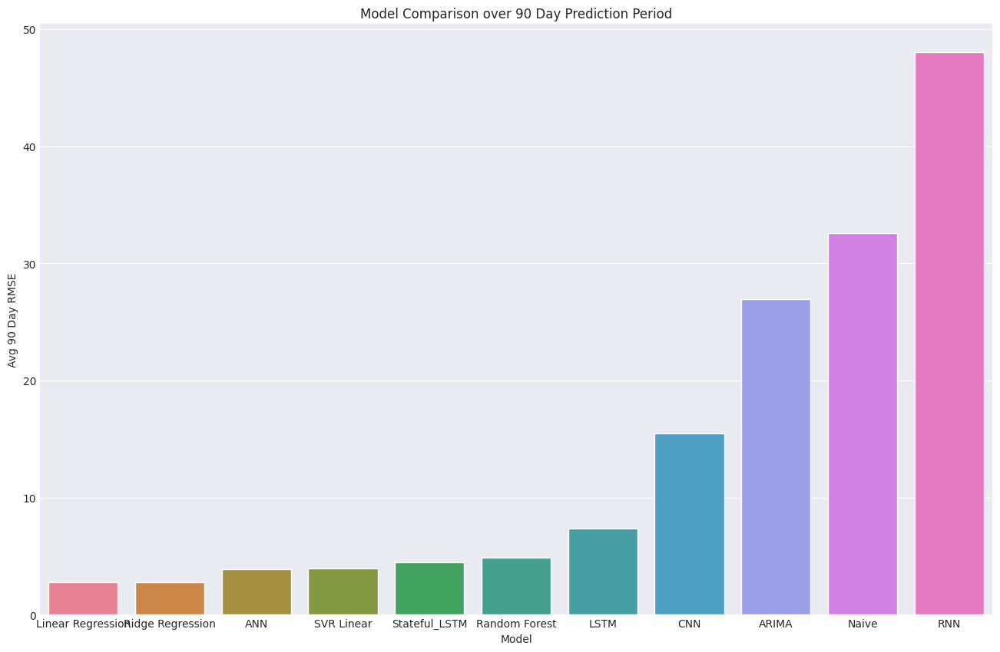

In [99]:
sns.set_style("darkgrid")
plt.figure(figsize=(16,10))
#plt.axvline(x=pd.to_datetime('2023-10-03'), color='black', linestyle='--', label='Vertical Line')
Avg_90_Day = TSLA_90_day.groupby('Model')['Test RMSE'].mean().sort_values(ascending=True)
bp = sns.barplot(y=Avg_90_Day.values, x=Avg_90_Day.index, hue=Avg_90_Day.index, palette='husl') #plot this
bp.set(ylabel="Avg 90 Day RMSE", xlabel="Model") #set labels
plt.title("Model Comparison over 90 Day Prediction Period")

# **Results with Model Performance across all shares**

Avg 7 Day RMSE


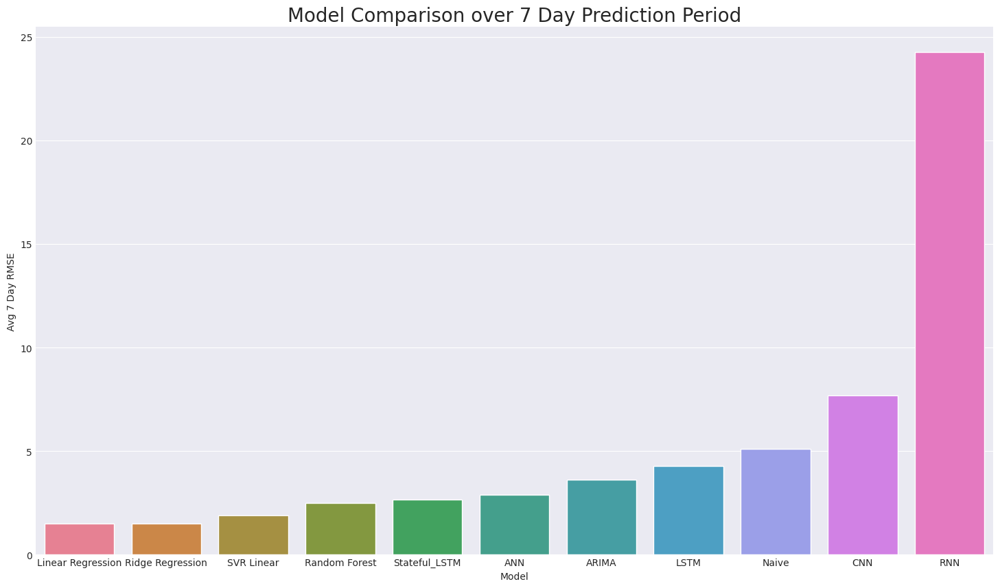

In [100]:
sns.set_style("darkgrid")
plt.figure(figsize=(18,10))
#plt.axvline(x=pd.to_datetime('2023-10-03'), color='black', linestyle='--', label='Vertical Line')
Avg_7_Day = _7_Day_Results.groupby('Model')['Test RMSE'].mean().sort_values(ascending=True)
bp = sns.barplot(y=Avg_7_Day.values, x=Avg_7_Day.index, hue=Avg_7_Day.index, palette='husl') #plot this
bp.set(ylabel="Avg 7 Day RMSE", xlabel="Model") #set labels
plt.title("Model Comparison over 7 Day Prediction Period", size = 20)
print("Avg 7 Day RMSE")

Text(0.5, 1.0, 'Model Comparison over 30 Day Prediction Period')

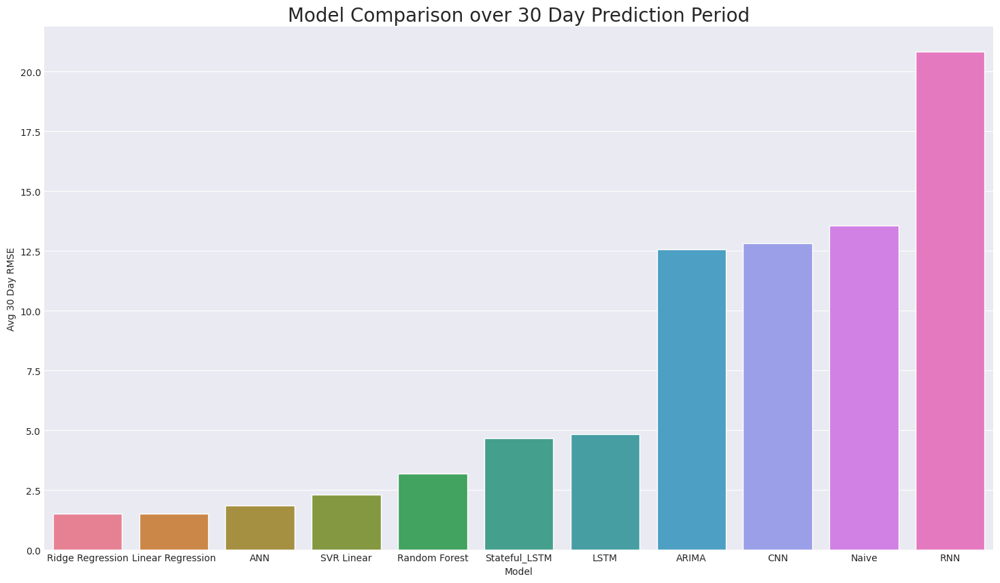

In [101]:
sns.set_style("darkgrid")
plt.figure(figsize=(18,10))
Avg_30_Day = _30_Day_Results.groupby('Model')['Test RMSE'].mean().sort_values(ascending=True)
bp = sns.barplot(y=Avg_30_Day.values, x=Avg_30_Day.index, hue=Avg_30_Day.index, palette='husl') #plot this
bp.set(ylabel="Avg 30 Day RMSE", xlabel="Model") #set labels
plt.title("Model Comparison over 30 Day Prediction Period", size = 20)

Text(0.5, 1.0, 'Model Comparison over 90 Day Prediction Period')

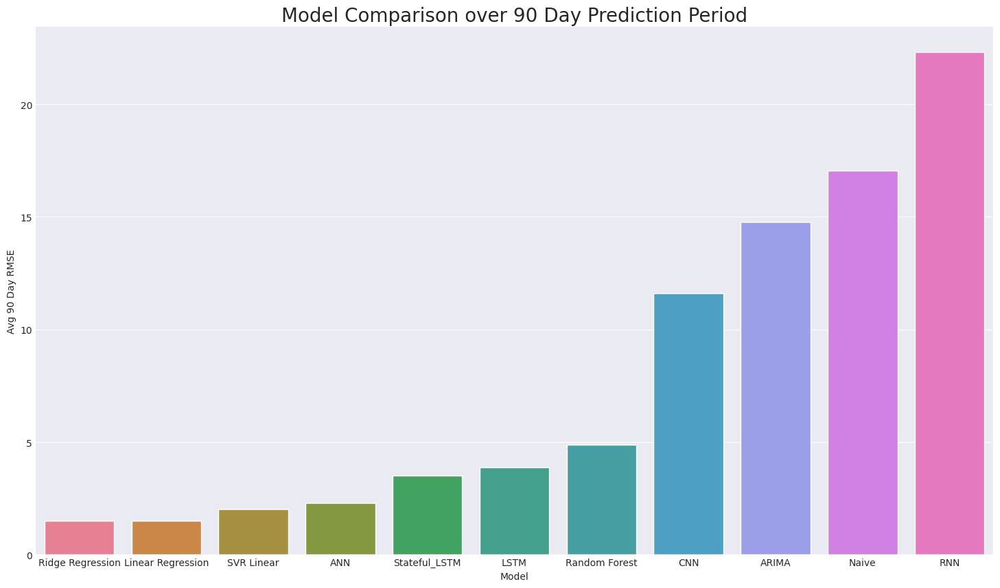

In [102]:
sns.set_style("darkgrid")
plt.figure(figsize=(18,10))
Avg_90_Day = _90_Day_Results.groupby('Model')['Test RMSE'].mean().sort_values(ascending=True)
bp = sns.barplot(y=Avg_90_Day.values, x=Avg_90_Day.index, hue=Avg_90_Day.index, palette='husl') #plot this
bp.set(ylabel="Avg 90 Day RMSE", xlabel="Model") #set labels
plt.title("Model Comparison over 90 Day Prediction Period", size = 20)

In [103]:
overall_results = pd.DataFrame(overall_results)

# **Total Model Performance Across all Prediction Periods**

Text(0.5, 1.0, 'Model Comparison Across Prediction Periods')

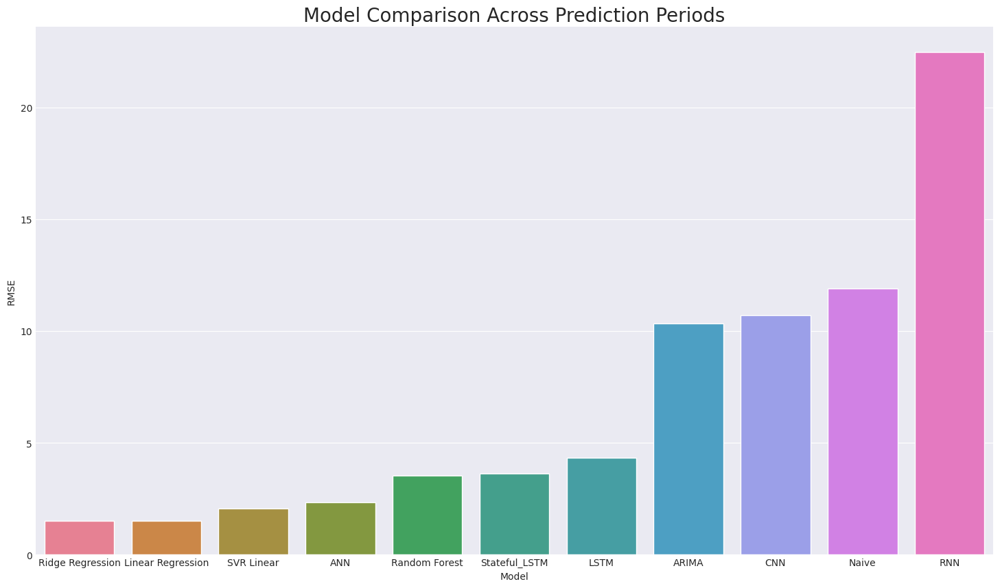

In [104]:
sns.set_style("darkgrid")
plt.figure(figsize=(18,10))
overall_results = overall_results.groupby('Model')['Test RMSE'].mean().sort_values(ascending=True)
bp = sns.barplot(y=overall_results.values, x=overall_results.index, hue=overall_results.index, palette='husl') #plot this
bp.set(ylabel="RMSE", xlabel="Model") #set labels
plt.title("Model Comparison Across Prediction Periods", size = 20)